In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.layers import Dense, Input, Flatten, Conv2D, MaxPooling2D, LayerNormalization, Softmax
from keras.callbacks import EarlyStopping
from keras.models import Sequential, Model
import tensorflow_probability as tfp
import keras

In [3]:
#training, testing = tf.keras.datasets.mnist.load_data(path="mnist.npz")
training, testing = tf.keras.datasets.fashion_mnist.load_data()



images_training = training[0]/256
images_testing = testing[0]/256

labels_training = pd.get_dummies(training[1]).to_numpy()
labels_testing = pd.get_dummies(testing[1]).to_numpy()

In [16]:
def generate_gaussian_noise(images,noise_sd):
    #Adds random gaussian noise to images
    noisy_images = images + np.random.normal(0,noise_sd,np.shape(images))
    return noisy_images


def generate_contrast(images,a):
    
    contrasted_images = np.zeros(np.shape(images))
    #changes contrast based on alpha
    alpha = a
    for i in range(np.shape(images)[0]):
        for j in range(np.shape(images)[1]):
            for k in range(np.shape(images)[2]):
                if images[i,j,k] < 0.5:
                    contrasted_images[i,j,k] = 0.5*(2*images[i,j,k])**alpha
                    
                else:
                    contrasted_images[i,j,k] = 1 - 0.5*(2*(1-images[i,j,k]))**alpha
    
    return contrasted_images

def generate_pixel_dropout(images,dropout, replace=0.5):
    dropout_images = np.zeros(np.shape(images))

    for i in range(np.shape(images)[0]):
        for j in range(np.shape(images)[1]):
            for k in range(np.shape(images)[2]):
                if np.random.rand(1,)[0] < dropout:
                    dropout_images[i,j,k] = replace
                else:
                    dropout_images[i,j,k] = images[i,j,k]                       
                    
     
    
    return dropout_images

def display_images(images,n=10):
    #Displays first n images
    plt.figure(10000)
    fig, ax = plt.subplots(1,n,figsize=(15,15))
    for i in range(n):
        ax[i].imshow(images[i])  
    plt.show()
    
def compute_accuracy(actual_labels, predicted_labels):
    c = 0
    for i in range(len(actual_labels[:,0])):
        if np.argmax(actual_labels[i,:]) == np.argmax(predicted_labels[i,:]):
            c = c+1
            
    return c/len(actual_labels[:,0])
        
def compute_confidence(actual_labels, predicted_labels):
    c = 0
    all_conf = 0 
    correct_conf = 0
    for i in range(len(actual_labels[:,0])):
        if np.argmax(actual_labels[i,:]) == np.argmax(predicted_labels[i,:]):
            c = c+1
            correct_conf = predicted_labels[i,np.argmax(predicted_labels[i,:])] + correct_conf
        all_conf = predicted_labels[i,np.argmax(predicted_labels[i,:])] + all_conf
        
    all_conf = all_conf/len(actual_labels[:,0])
    correct_conf = correct_conf/c
    
    return all_conf,correct_conf

def compute_frequencies(predicted_labels):
    freq = np.zeros((10,1))
    for i in range(len(predicted_labels[:,0])): 
        freq[np.argmax(predicted_labels[i,:]),0] = 1 + freq[np.argmax(predicted_labels[i,:]),0]
        
    freq = freq/len(predicted_labels[:,0])
        
    return freq
        
    
def compute_confidence_by_category(actual_labels, predicted_labels):
    c = np.zeros((10,1))
    cc = np.zeros((10,1))
    all_conf = np.zeros((10,1))
    correct_conf = np.zeros((10,1))
    
    for j in range(10):
        for i in range(len(actual_labels[:,0])):
            if np.argmax(predicted_labels[i,:]) == j:
                cc[j] = cc[j] + 1
                if np.argmax(actual_labels[i,:]) == np.argmax(predicted_labels[i,:]):
                    c[j] = c[j]+1
                    correct_conf[j] = predicted_labels[i,np.argmax(predicted_labels[i,:])] + correct_conf[j]
                all_conf[j] = predicted_labels[i,np.argmax(predicted_labels[i,:])] + all_conf[j]

        all_conf[j] = all_conf[j]/cc[j]
        correct_conf[j] = correct_conf[j]/c[j]
    
    return all_conf,correct_conf

Clean Data


<Figure size 640x480 with 0 Axes>

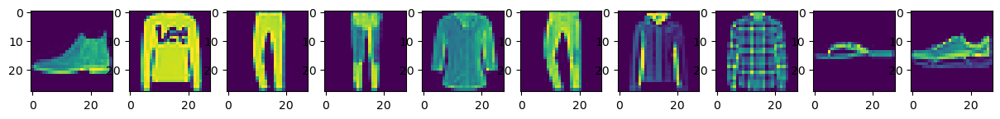

Noisy Data


<Figure size 640x480 with 0 Axes>

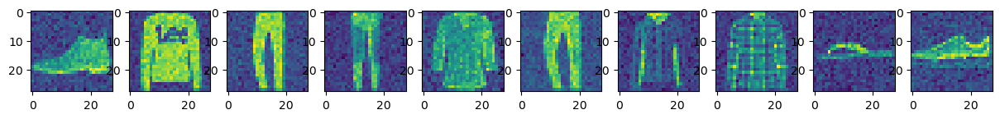

<Figure size 640x480 with 0 Axes>

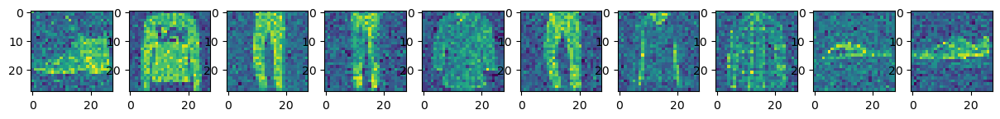

<Figure size 640x480 with 0 Axes>

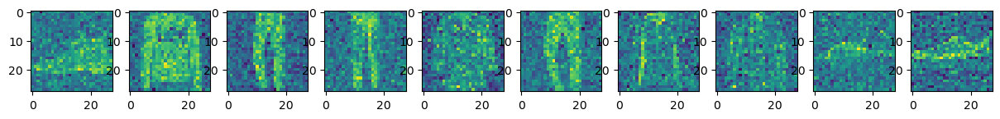

<Figure size 640x480 with 0 Axes>

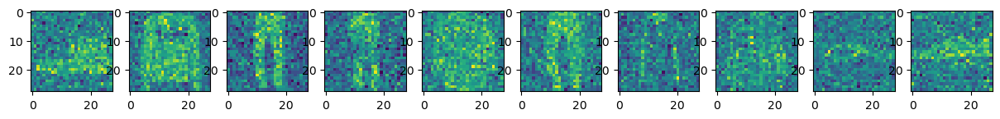

<Figure size 640x480 with 0 Axes>

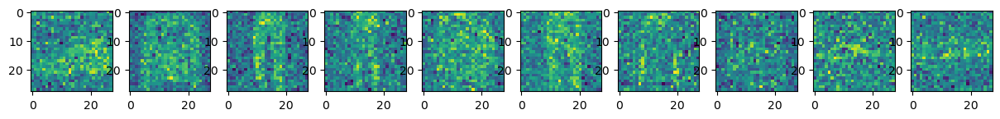

<Figure size 640x480 with 0 Axes>

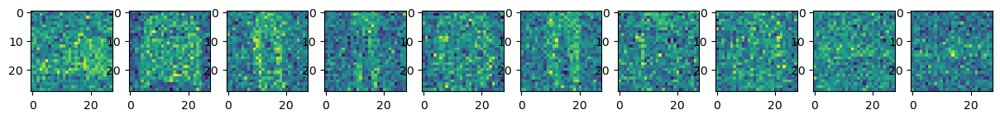

<Figure size 640x480 with 0 Axes>

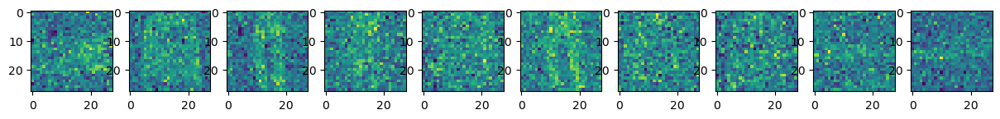

<Figure size 640x480 with 0 Axes>

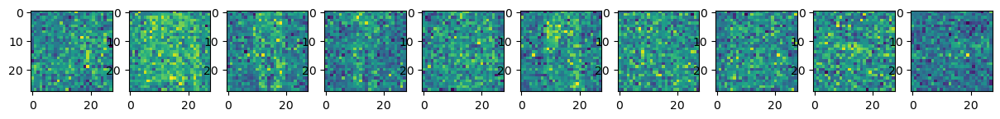

<Figure size 640x480 with 0 Axes>

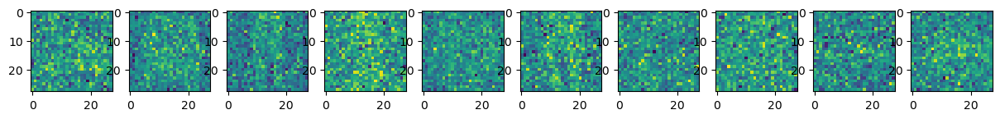

<Figure size 640x480 with 0 Axes>

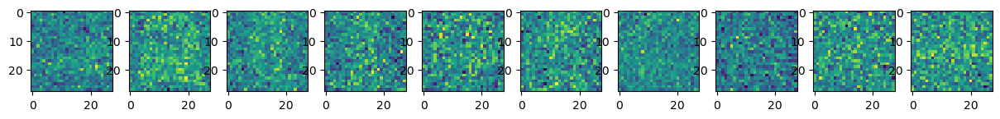

<Figure size 640x480 with 0 Axes>

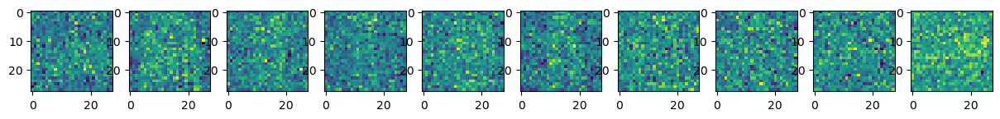

<Figure size 640x480 with 0 Axes>

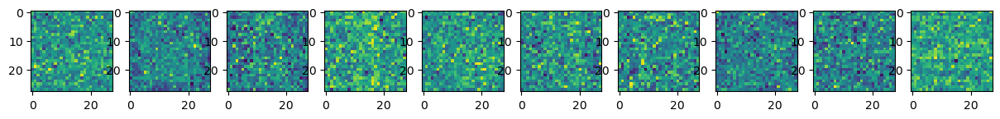

<Figure size 640x480 with 0 Axes>

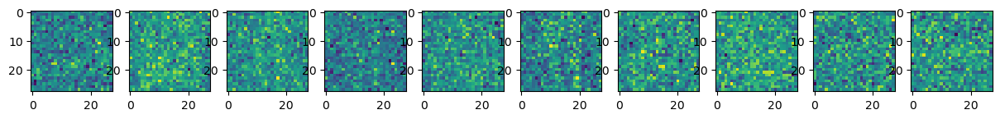

<Figure size 640x480 with 0 Axes>

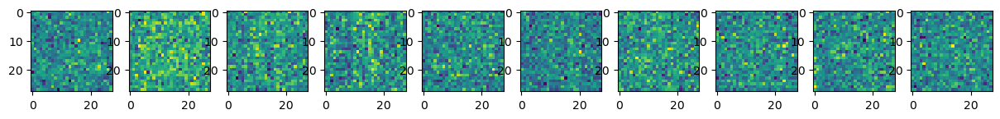

<Figure size 640x480 with 0 Axes>

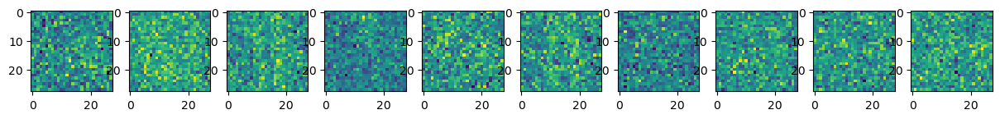

<Figure size 640x480 with 0 Axes>

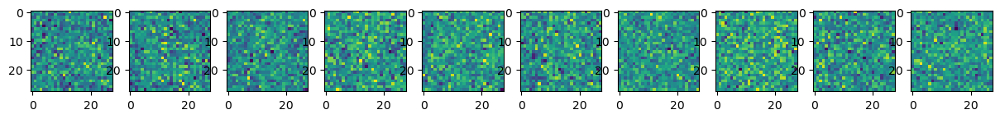

<Figure size 640x480 with 0 Axes>

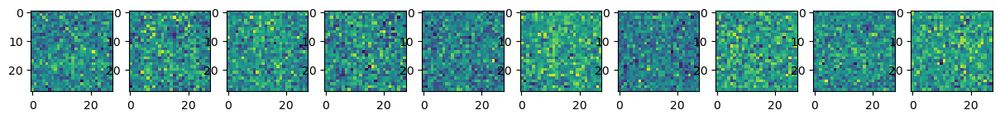

<Figure size 640x480 with 0 Axes>

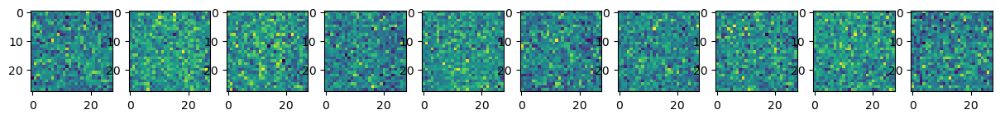

<Figure size 640x480 with 0 Axes>

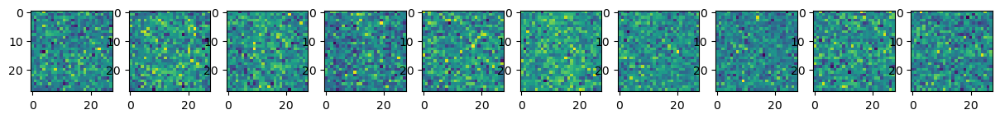

In [5]:
#Display clean data
print("Clean Data")
display_images(images_testing)

print("Noisy Data")
sd_test = np.arange(0.1,2,0.1)
for i in range(len(sd_test)):
    noisy_testing = generate_gaussian_noise(images_testing,sd_test[i])
    
    display_images(noisy_testing)
  

Contrast Data


<Figure size 640x480 with 0 Axes>

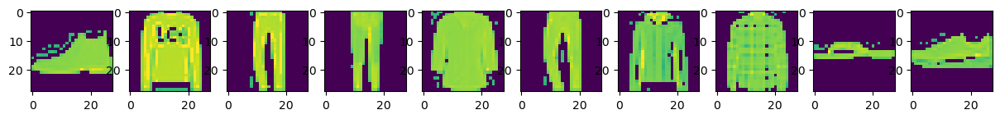

<Figure size 640x480 with 0 Axes>

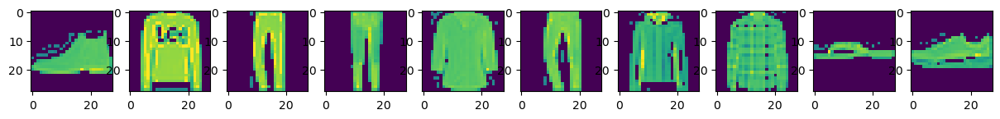

<Figure size 640x480 with 0 Axes>

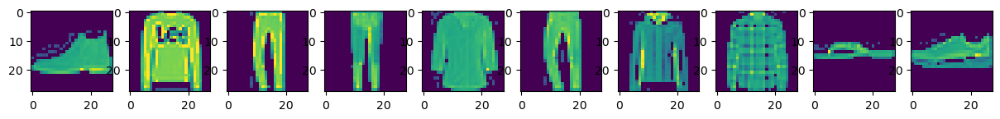

<Figure size 640x480 with 0 Axes>

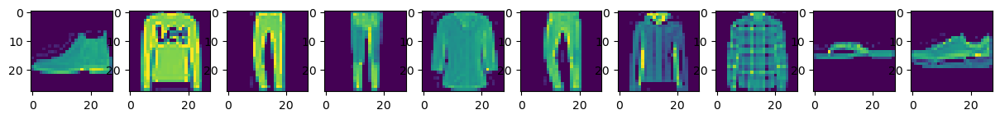

<Figure size 640x480 with 0 Axes>

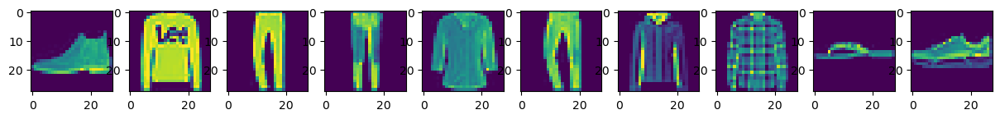

<Figure size 640x480 with 0 Axes>

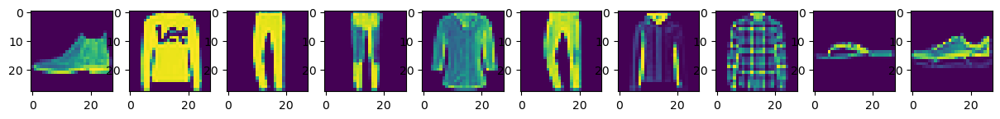

<Figure size 640x480 with 0 Axes>

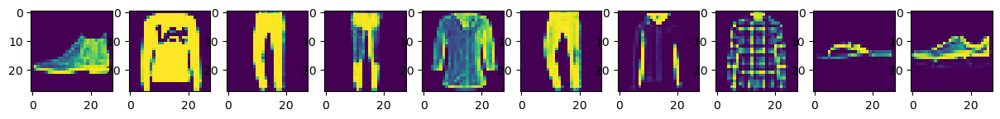

<Figure size 640x480 with 0 Axes>

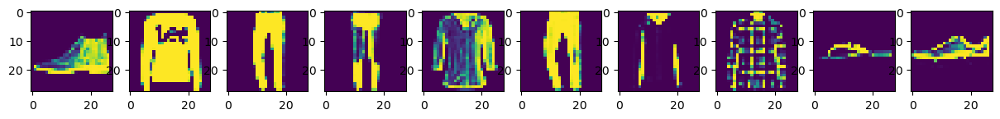

In [6]:
#Display contrast data


print("Contrast Data")
cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]
for i in range(len(cn_test)):
    noisy_testing = generate_contrast(images_testing,cn_test[i])
    
    display_images(noisy_testing)
  

Dropout Data


<Figure size 640x480 with 0 Axes>

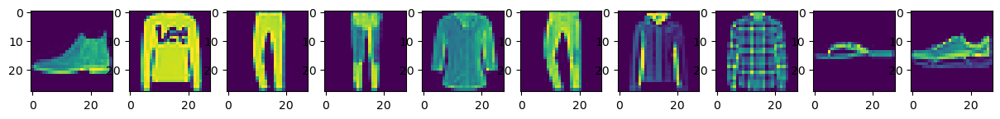

<Figure size 640x480 with 0 Axes>

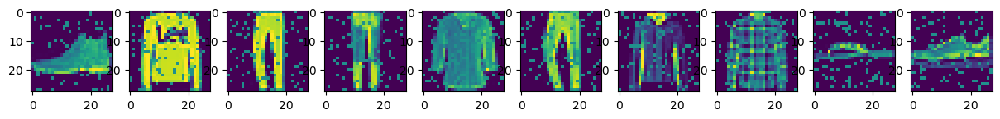

<Figure size 640x480 with 0 Axes>

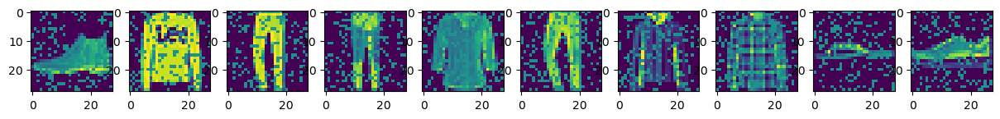

<Figure size 640x480 with 0 Axes>

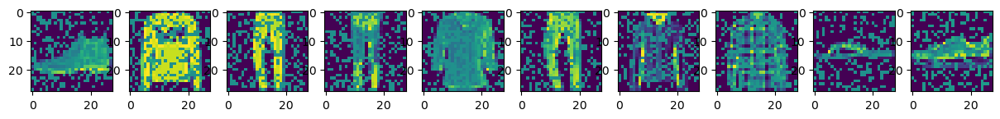

<Figure size 640x480 with 0 Axes>

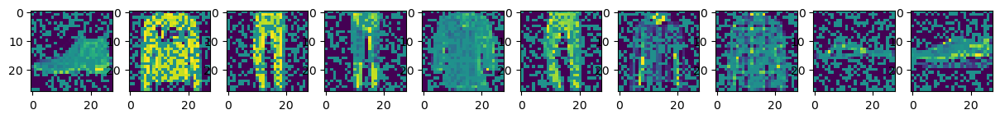

<Figure size 640x480 with 0 Axes>

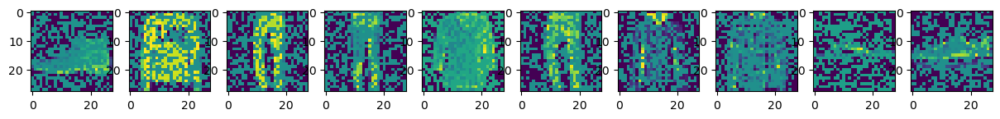

<Figure size 640x480 with 0 Axes>

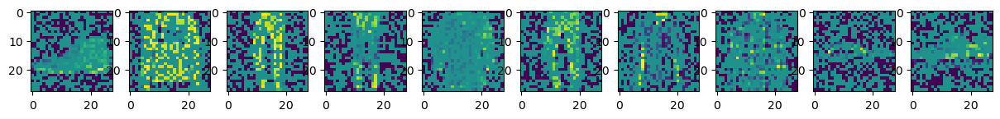

<Figure size 640x480 with 0 Axes>

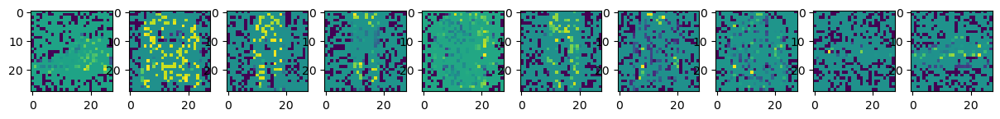

<Figure size 640x480 with 0 Axes>

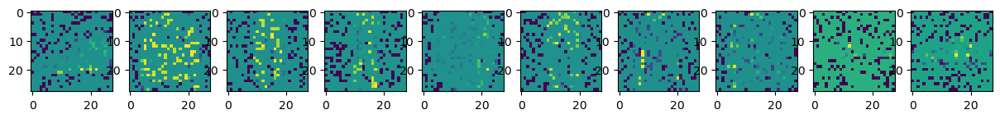

<Figure size 640x480 with 0 Axes>

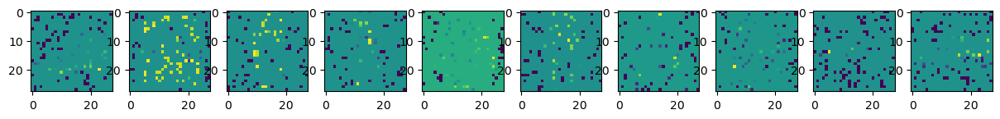

In [7]:
print("Dropout Data")
sd_test = np.arange(0,1,0.1)
for i in range(len(sd_test)):
    noisy_testing = generate_pixel_dropout(images_testing,sd_test[i])
    
    display_images(noisy_testing)

# Experiment 1a: Tiny Feedforward Network

In [8]:
#Train standard feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer = Dense(10,activation='relu')(inputs)


outputs = Dense(10,activation='softmax')(layer)

model_feedforward = Model(inputs=inputs,outputs=outputs)

model_feedforward_intermed = Model(inputs=inputs,outputs=layer)

model_feedforward.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_feedforward.fit(images_training_flat,labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00044: early stopping


<Figure size 640x480 with 0 Axes>

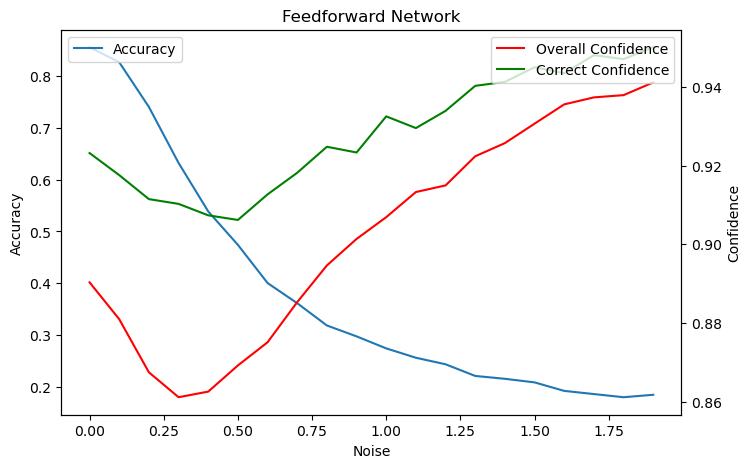

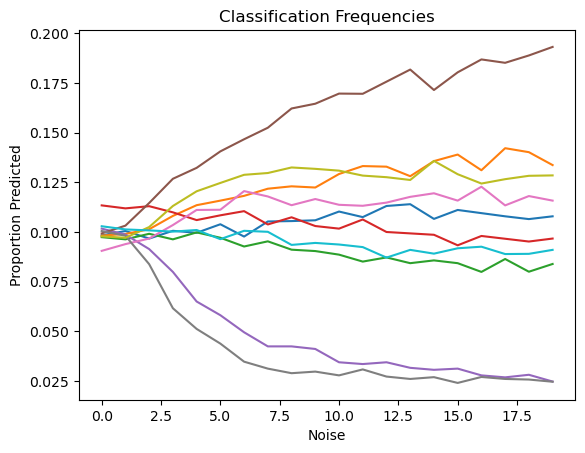

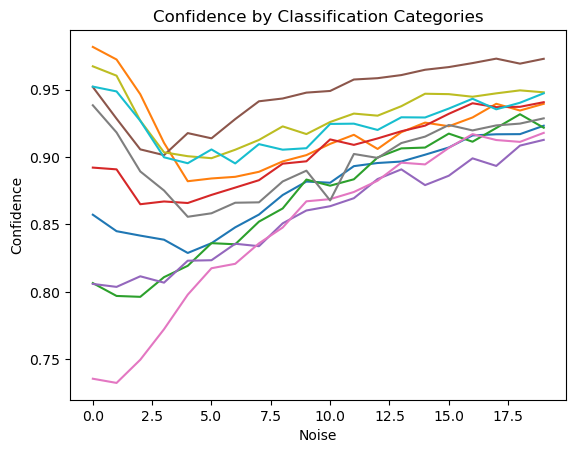

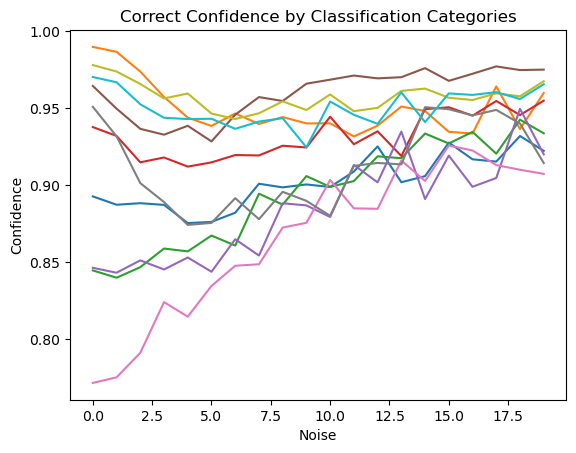

<Figure size 640x480 with 0 Axes>

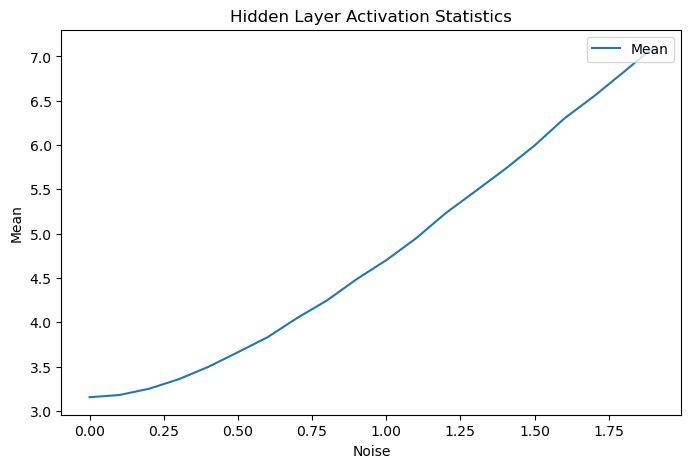

In [9]:
# Vary noise


sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

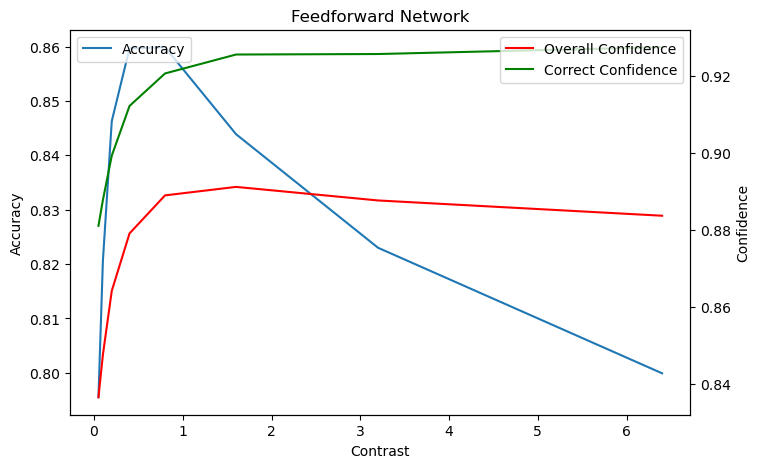

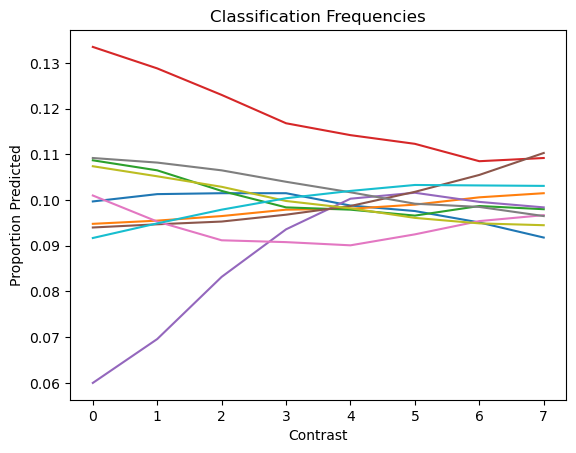

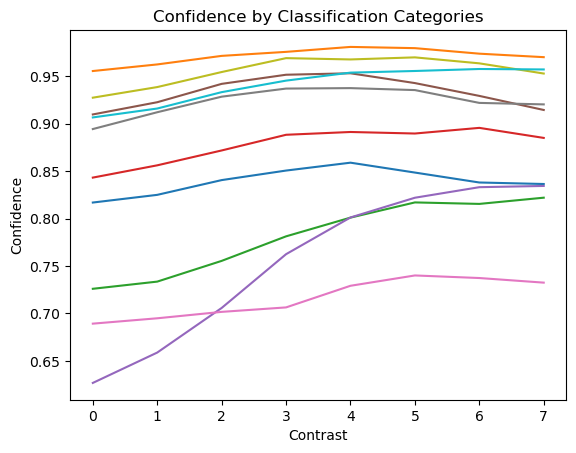

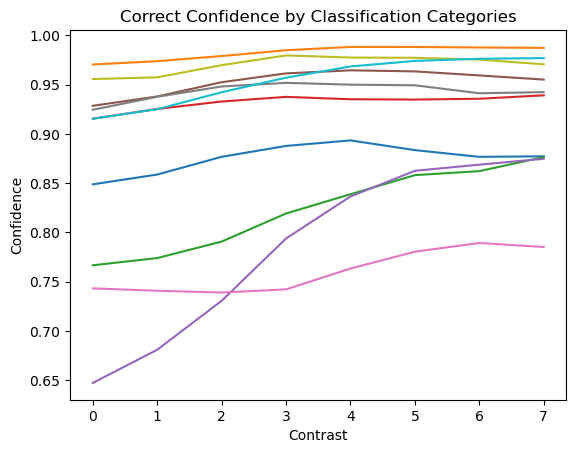

<Figure size 640x480 with 0 Axes>

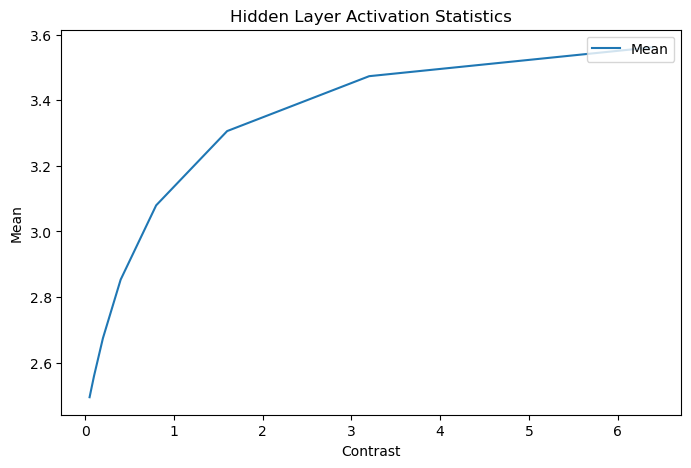

In [10]:
# Vary contrast


cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(cn_test)):
    images_testing_noise = generate_contrast(images_testing,cn_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cn_test,acc_array, label = "Accuracy")
conf_ax.plot(cn_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cn_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Contrast")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(cn_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

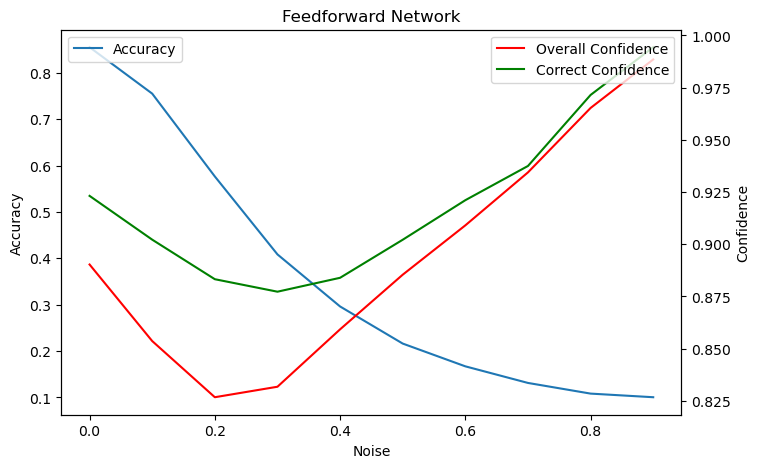

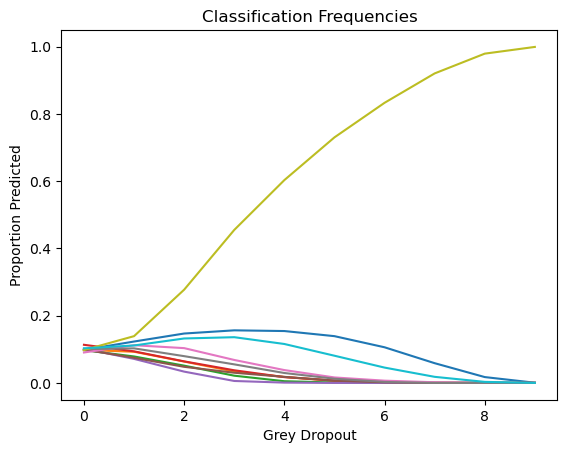

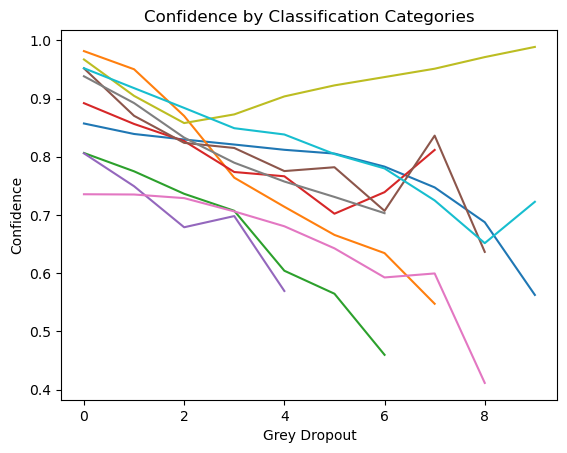

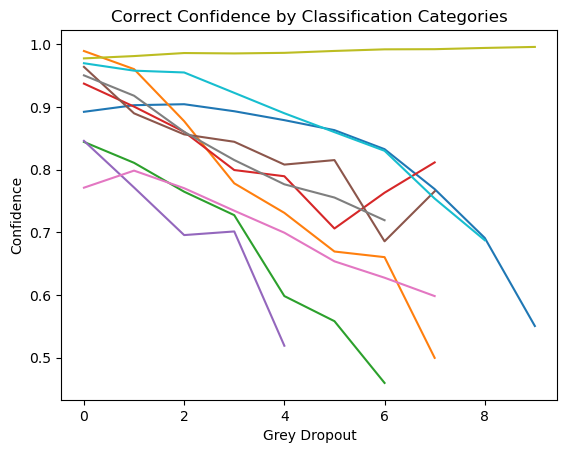

<Figure size 640x480 with 0 Axes>

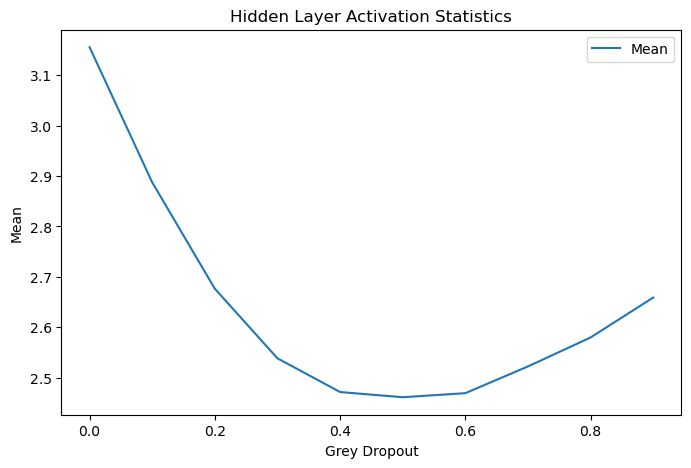

In [11]:
# Vary grey dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0.5)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Grey Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

In [ ]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Black Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

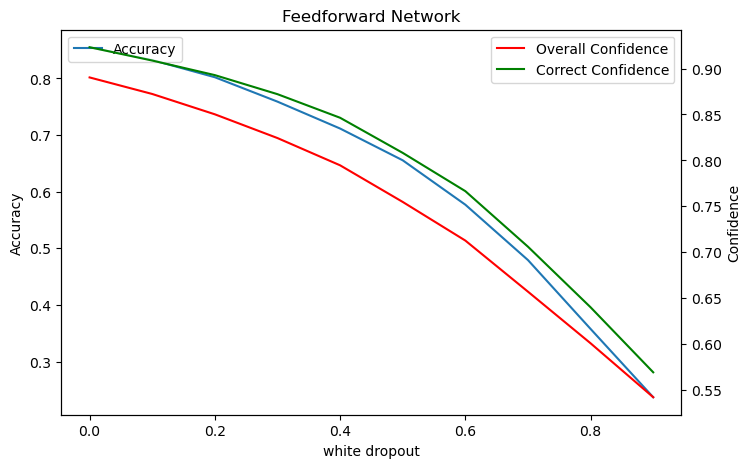

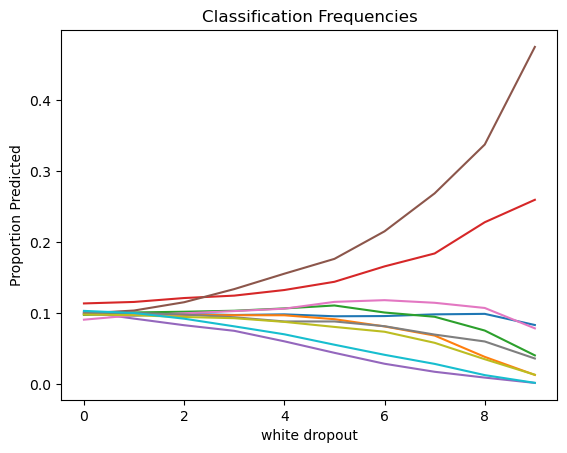

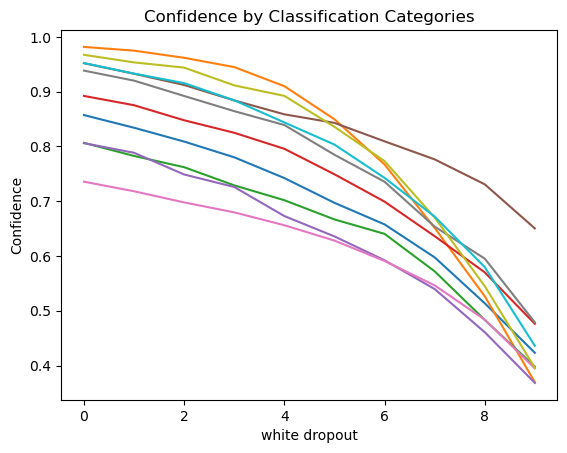

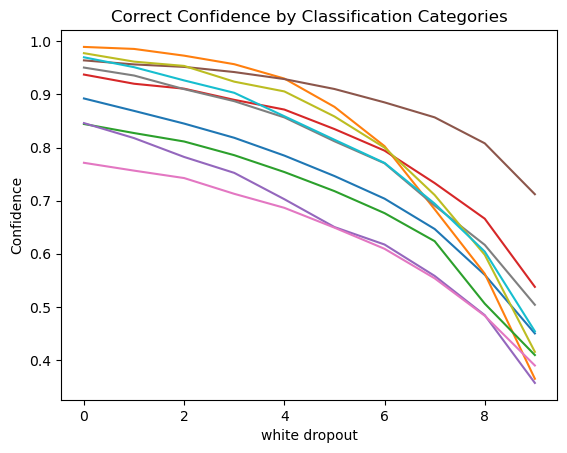

<Figure size 640x480 with 0 Axes>

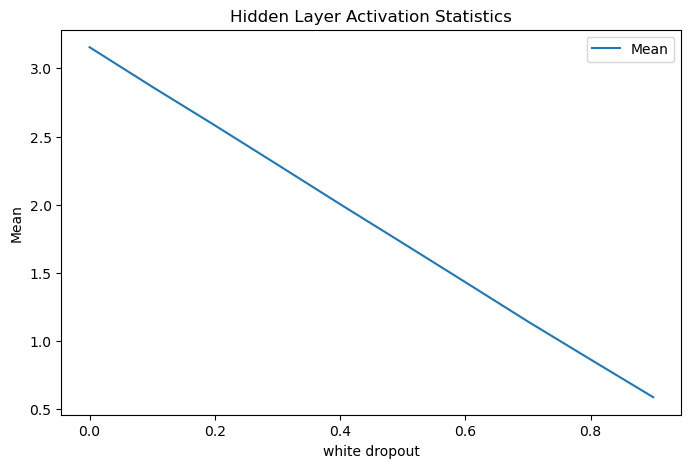

In [12]:
# Vary white dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("white dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("white dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("white dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

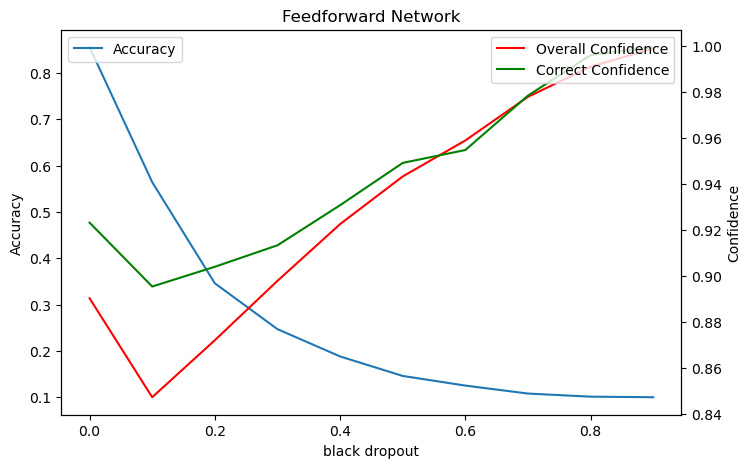

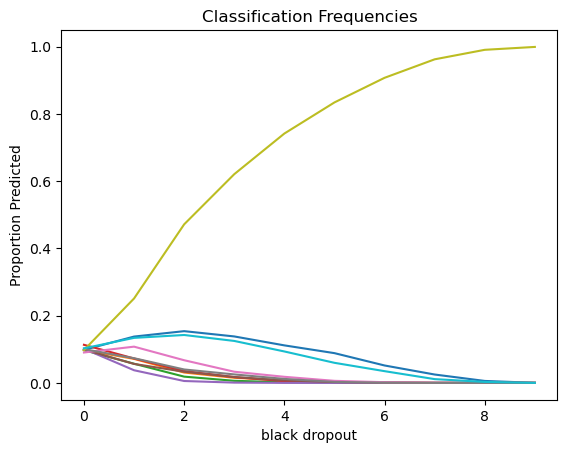

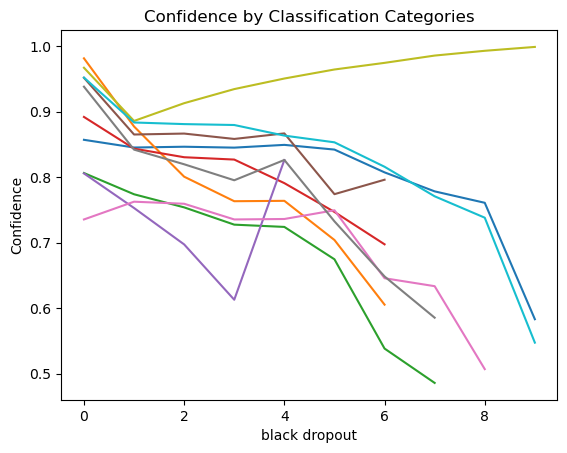

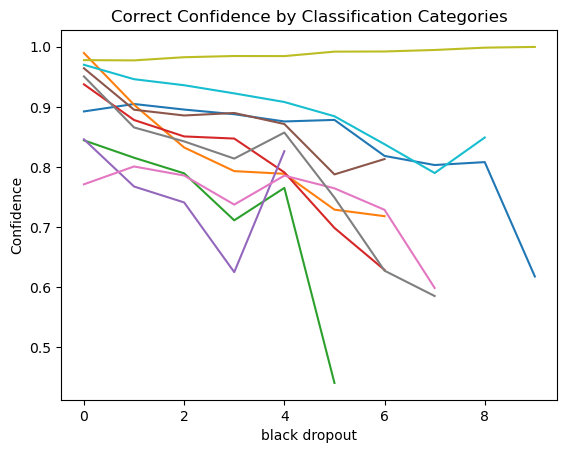

<Figure size 640x480 with 0 Axes>

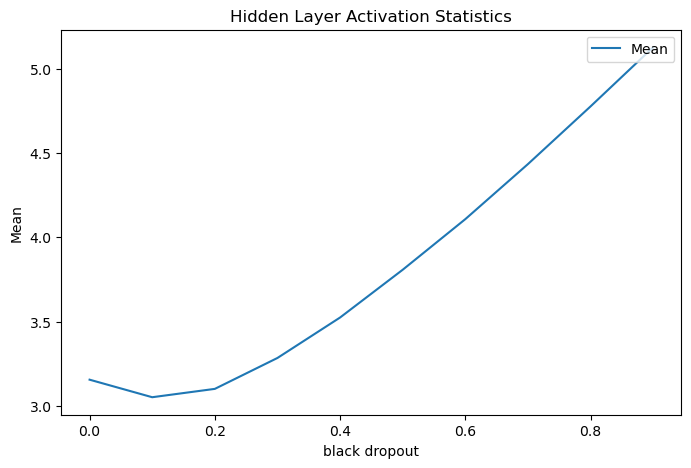

In [13]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],1)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("black dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("black dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("black dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Experiment 1b: Tiny Feedforward Network with Hidden Layer normalization

In [14]:
#Train standard feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer = Dense(10,activation='relu')(inputs)

layer = LayerNormalization()(layer)
outputs = Dense(10,activation='softmax')(layer)

model_feedforward = Model(inputs=inputs,outputs=outputs)

model_feedforward_intermed = Model(inputs=inputs,outputs=layer)

model_feedforward.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_feedforward.fit(images_training_flat,labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00042: early stopping


<Figure size 640x480 with 0 Axes>

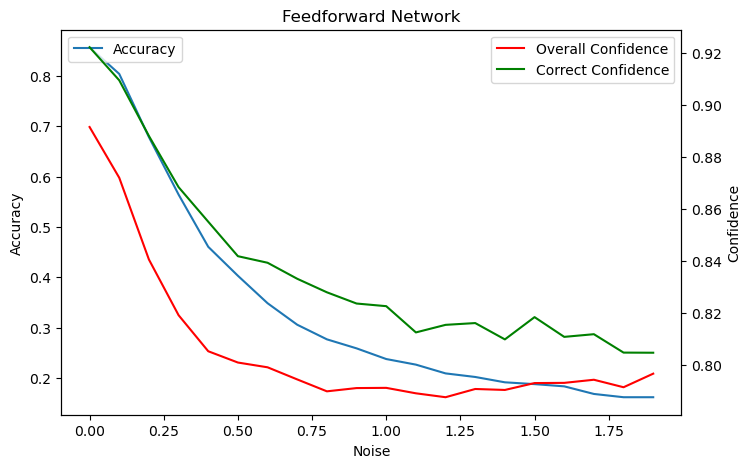

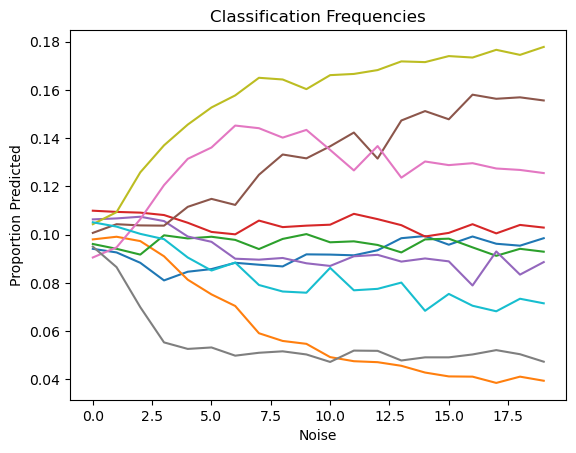

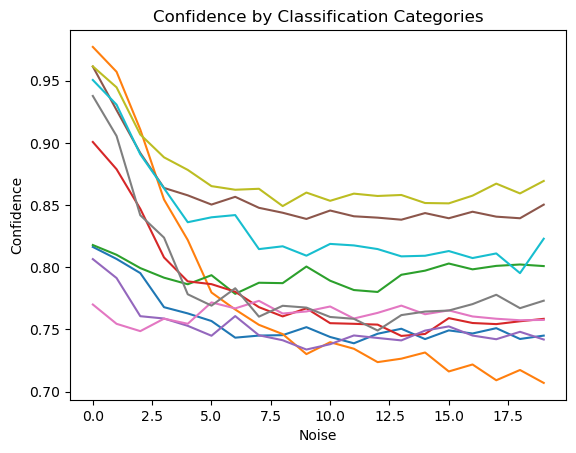

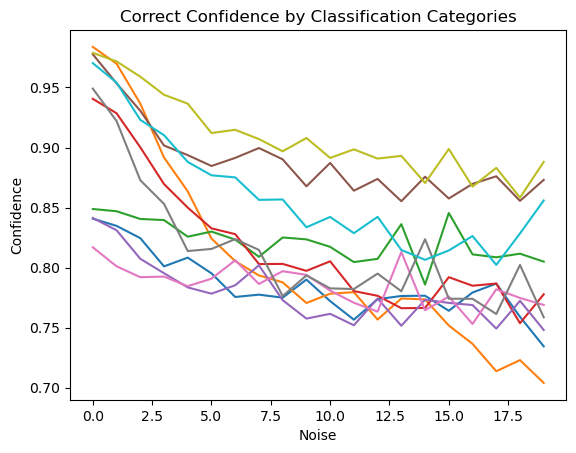

<Figure size 640x480 with 0 Axes>

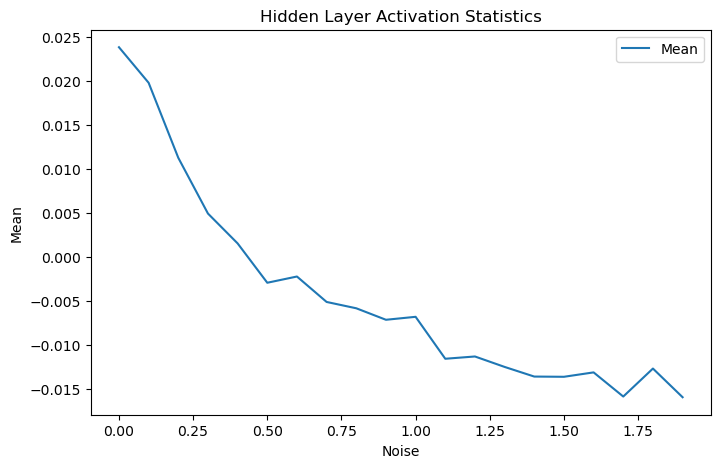

In [15]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

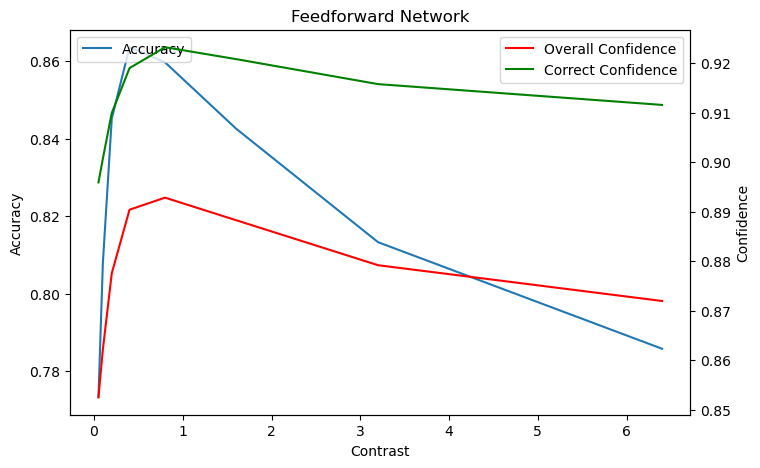

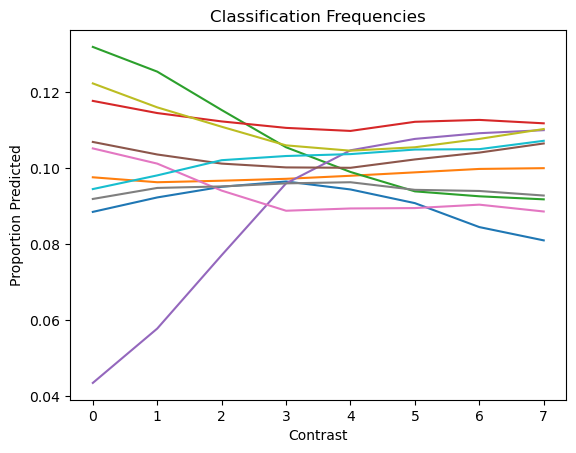

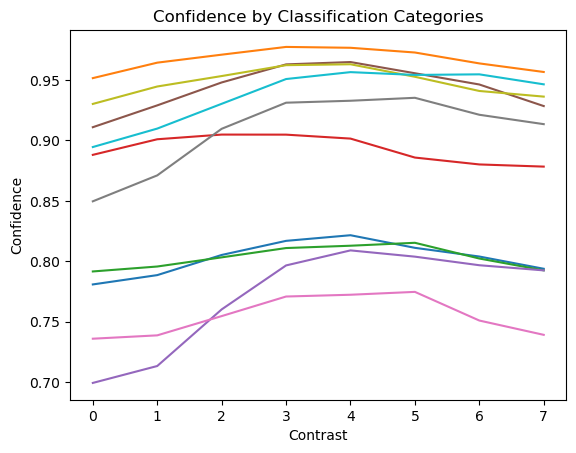

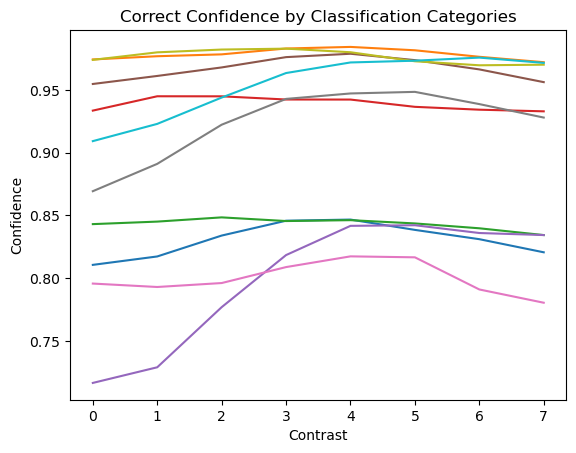

<Figure size 640x480 with 0 Axes>

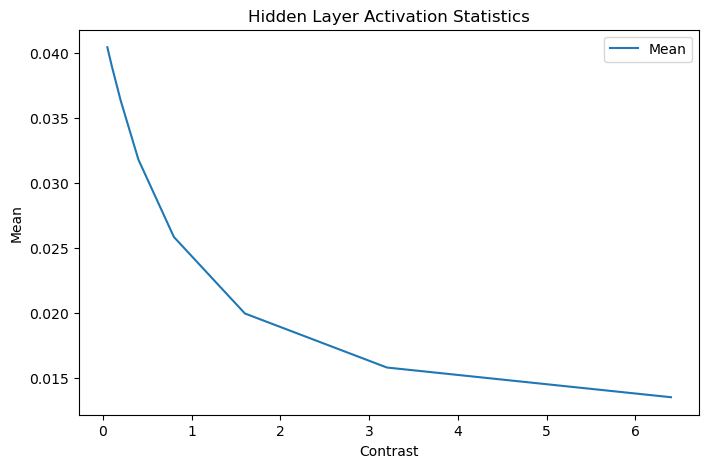

In [16]:
# Vary contrast


cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(cn_test)):
    images_testing_noise = generate_contrast(images_testing,cn_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cn_test,acc_array, label = "Accuracy")
conf_ax.plot(cn_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cn_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Contrast")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(cn_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]
<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]


<Figure size 640x480 with 0 Axes>

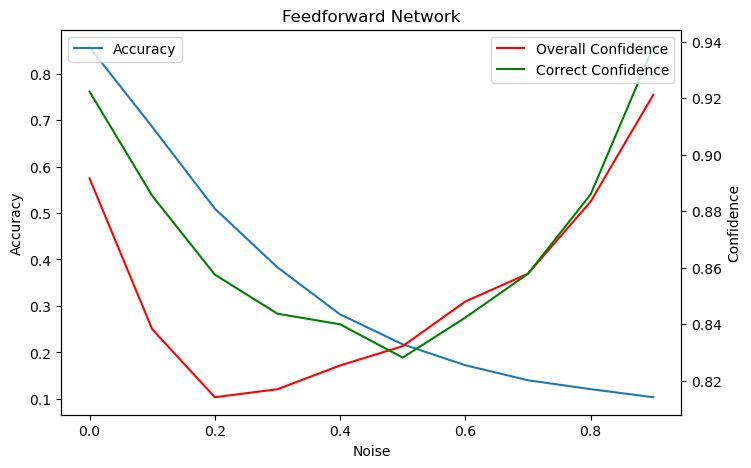

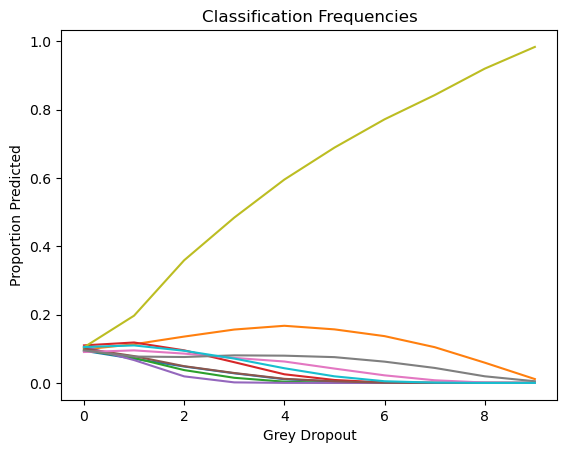

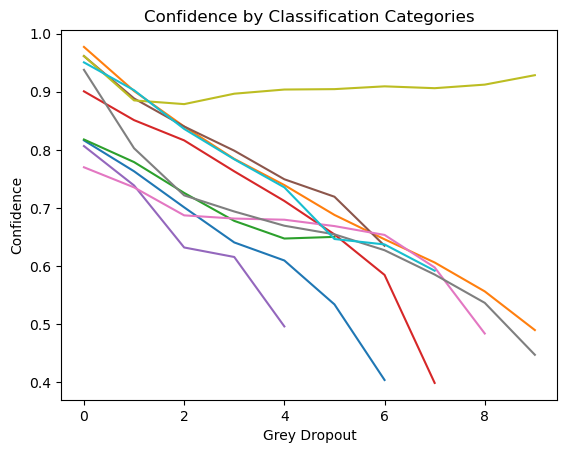

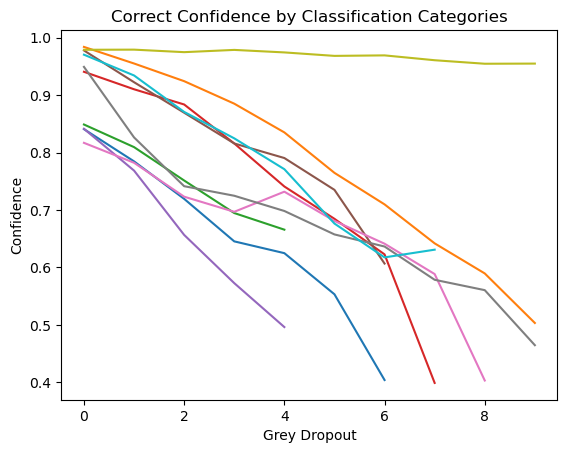

<Figure size 640x480 with 0 Axes>

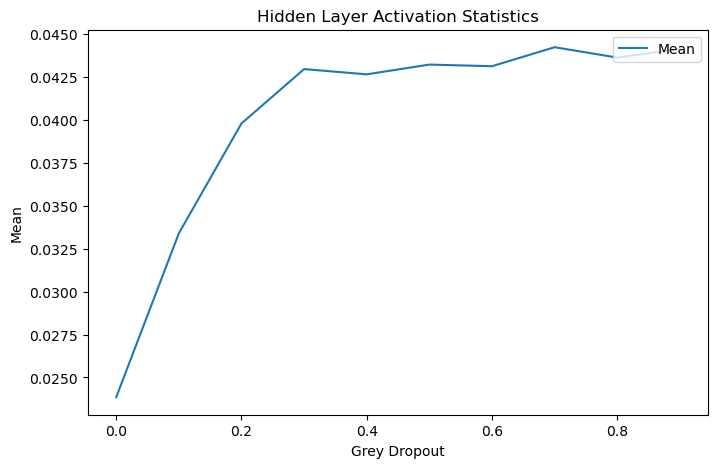

In [17]:
# Vary grey dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0.5)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Grey Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

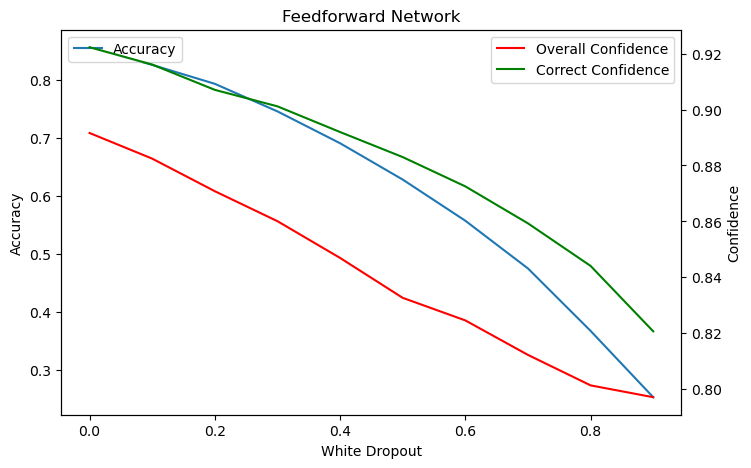

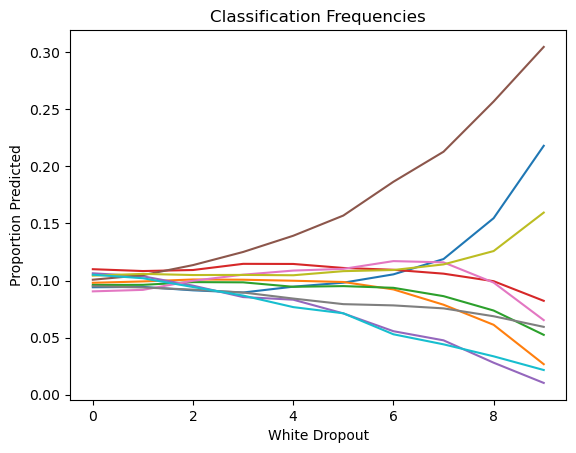

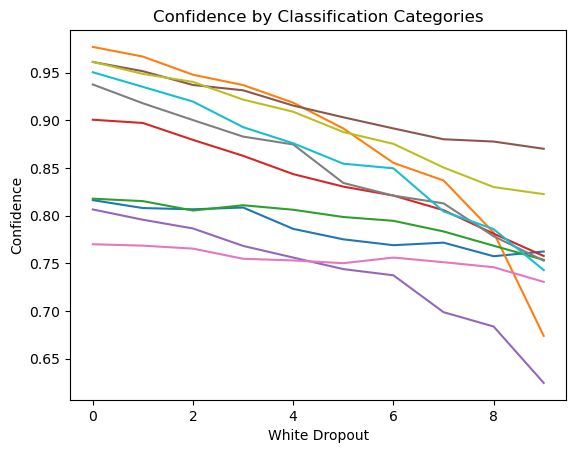

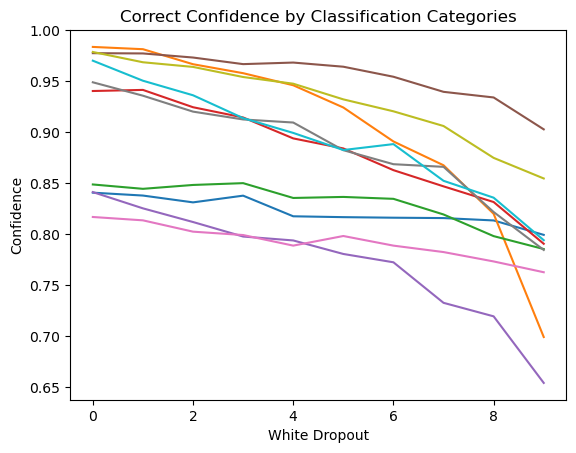

<Figure size 640x480 with 0 Axes>

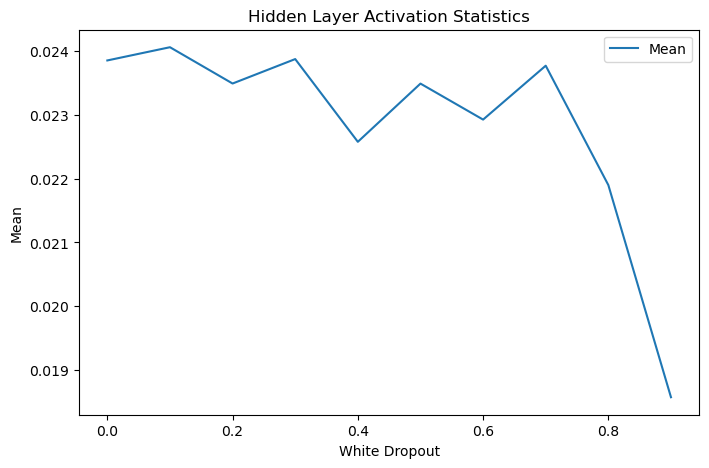

In [18]:
# Vary white dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("White Dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("White Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("White Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("White Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("White Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

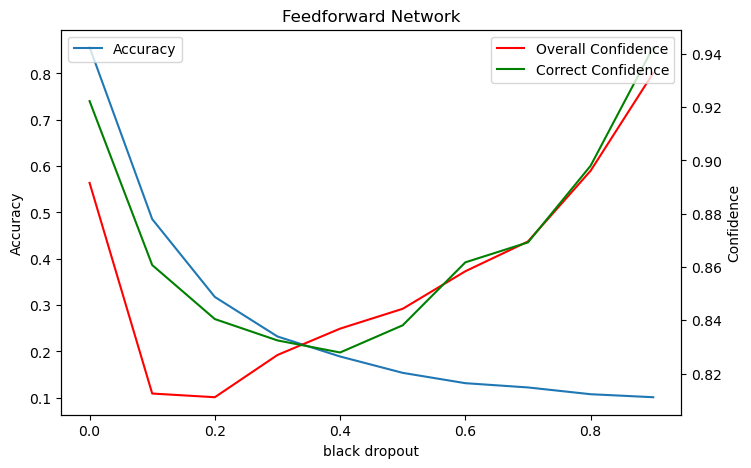

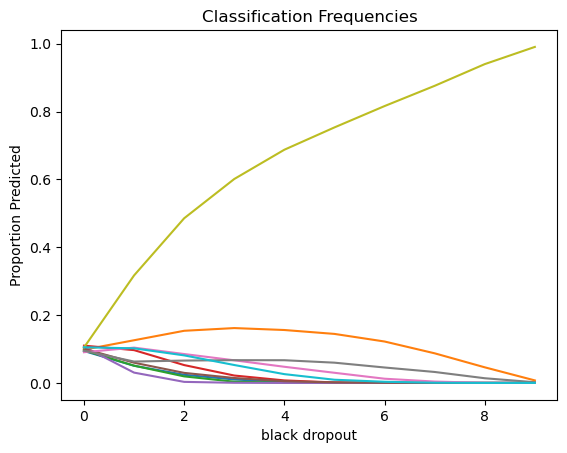

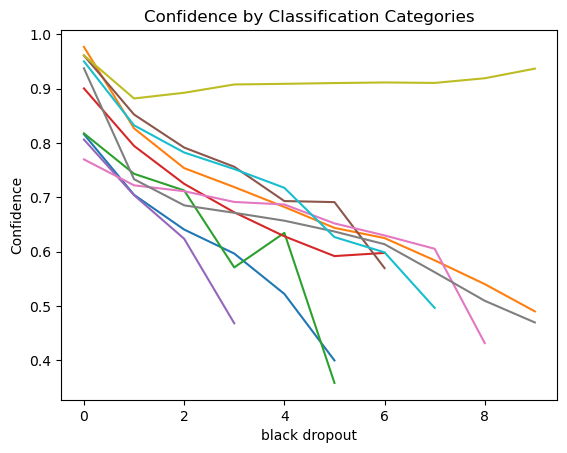

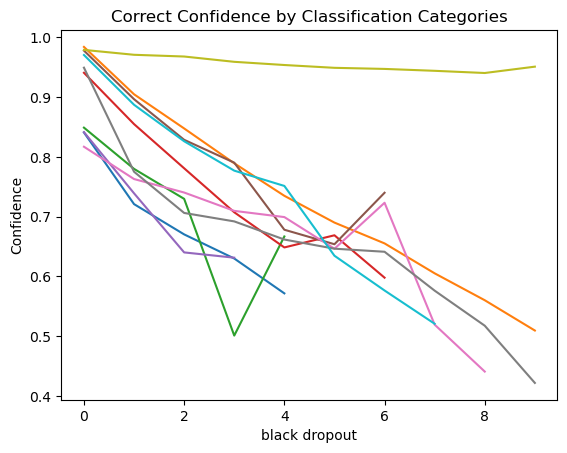

<Figure size 640x480 with 0 Axes>

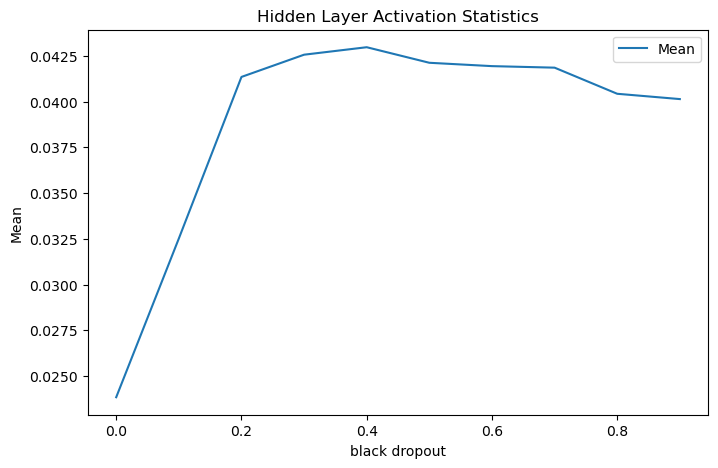

In [19]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],1)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("black dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("black dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("black dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Experiment 1c: Tiny Feedforward Network with First Layer normalization

In [20]:
#Train standard feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

layer = LayerNormalization()(inputs)

layer = Dense(10,activation='relu')(layer)


outputs = Dense(10,activation='softmax')(layer)


model_feedforward = Model(inputs=inputs,outputs=outputs)

model_feedforward_intermed = Model(inputs=inputs,outputs=layer)

model_feedforward.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_feedforward.fit(images_training_flat,labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00028: early stopping


<Figure size 640x480 with 0 Axes>

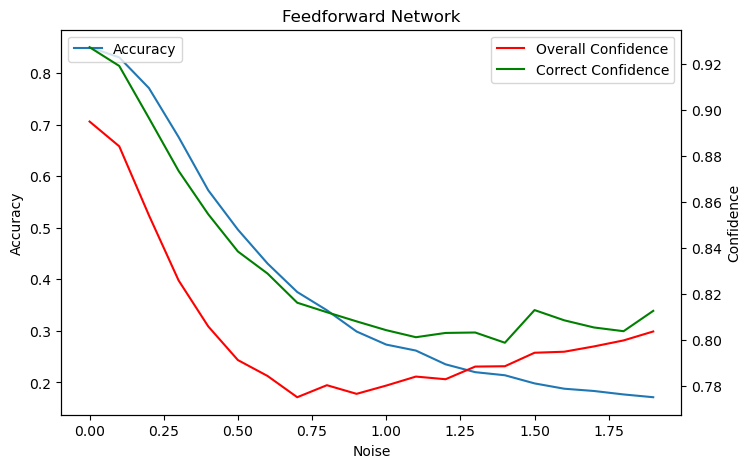

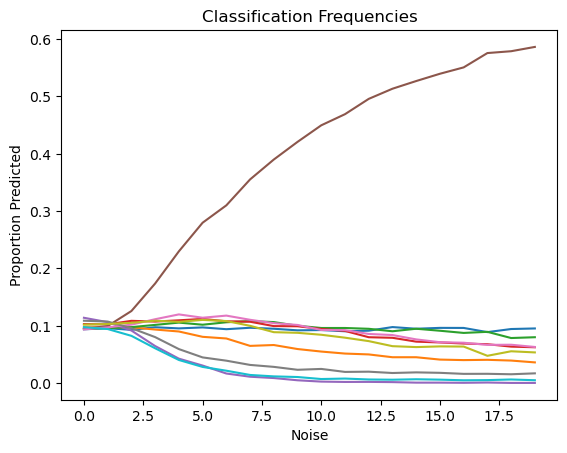

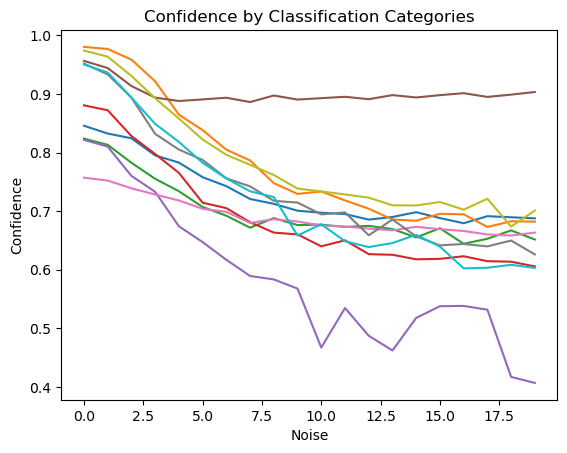

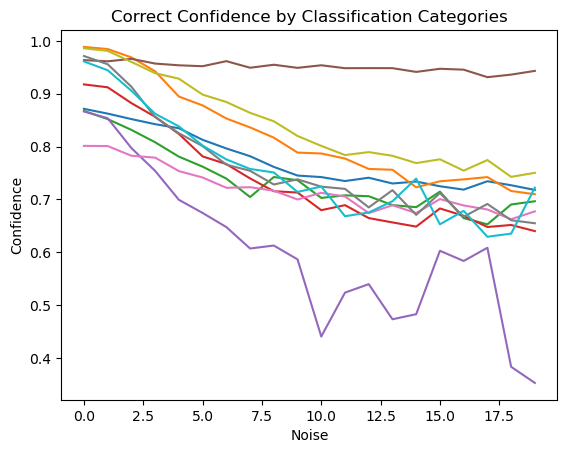

<Figure size 640x480 with 0 Axes>

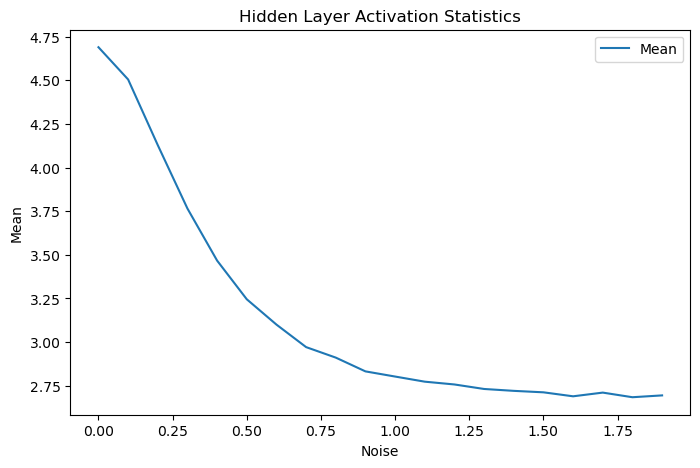

In [21]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

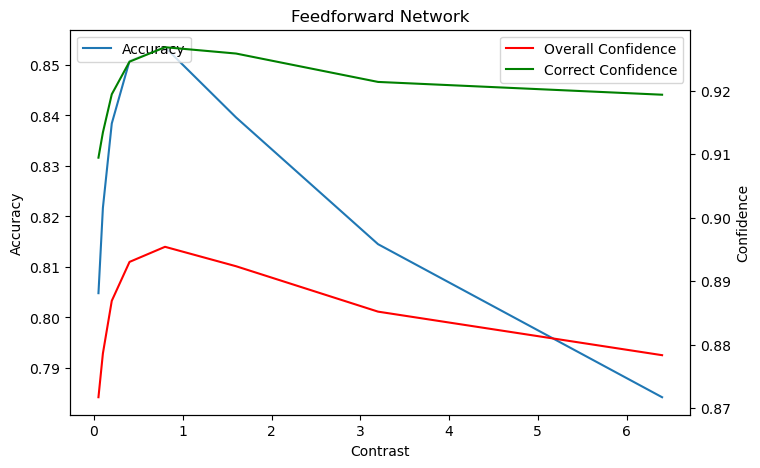

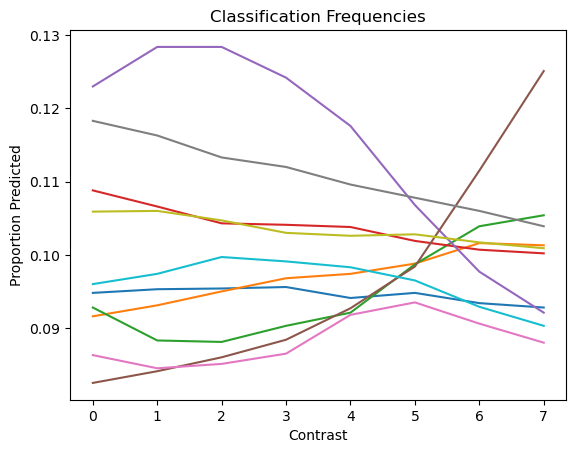

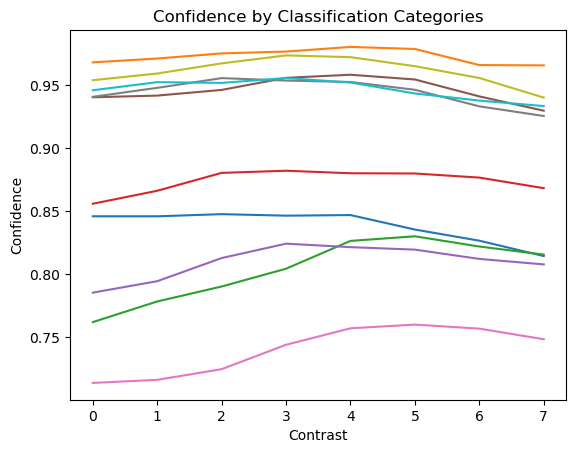

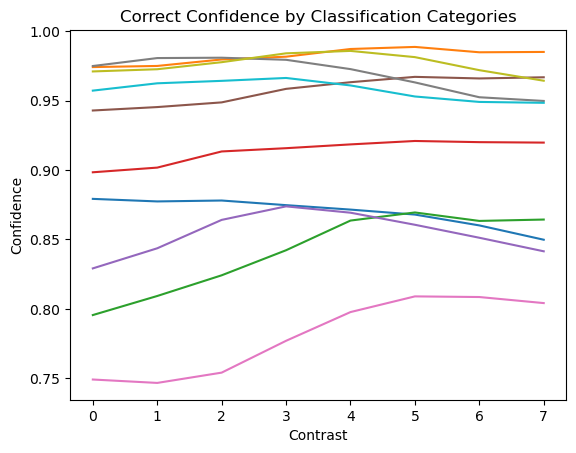

<Figure size 640x480 with 0 Axes>

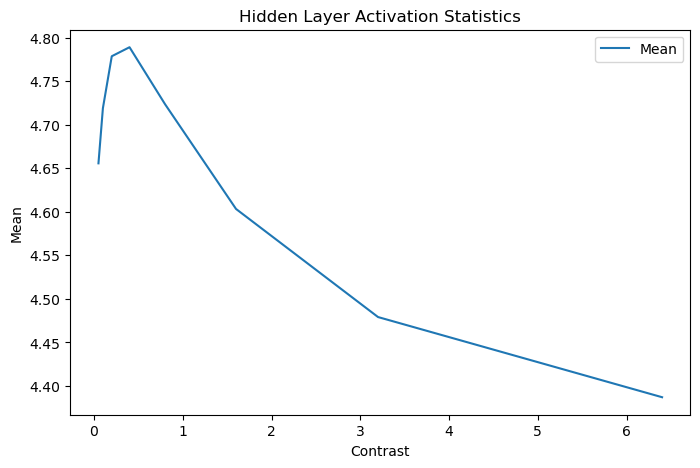

In [22]:
# Vary contrast


cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(cn_test)):
    images_testing_noise = generate_contrast(images_testing,cn_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cn_test,acc_array, label = "Accuracy")
conf_ax.plot(cn_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cn_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Contrast")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(cn_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

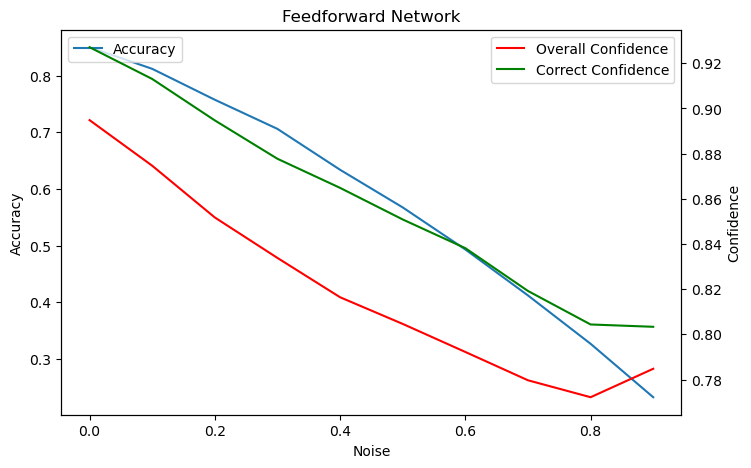

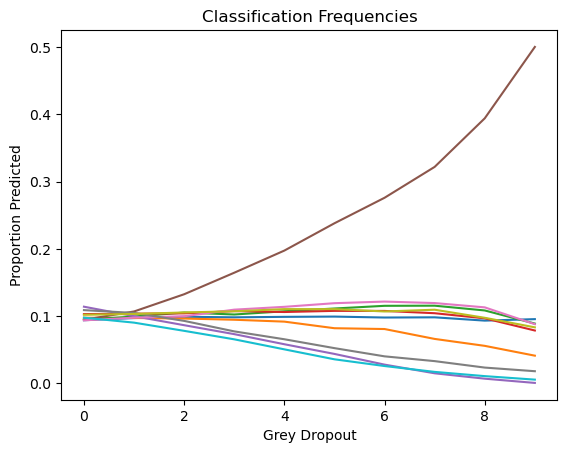

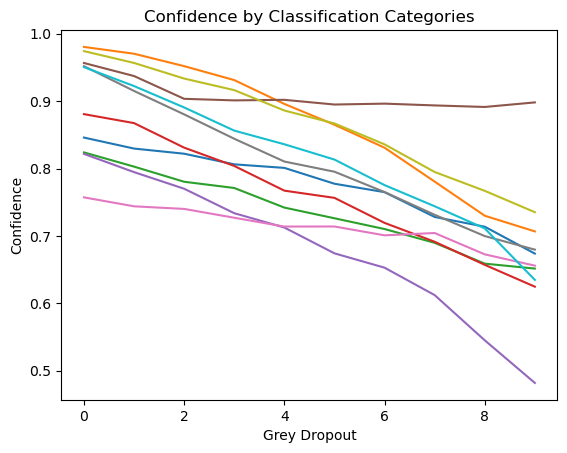

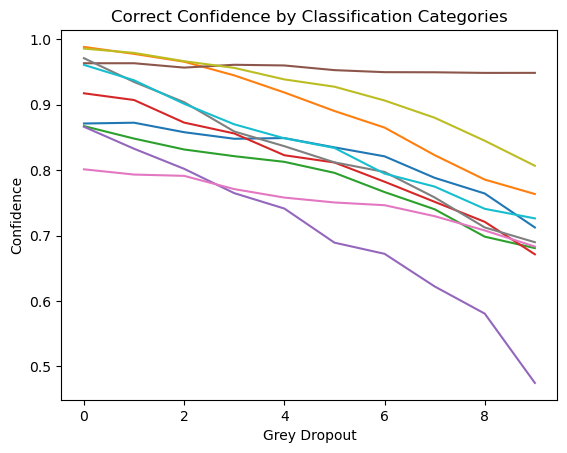

<Figure size 640x480 with 0 Axes>

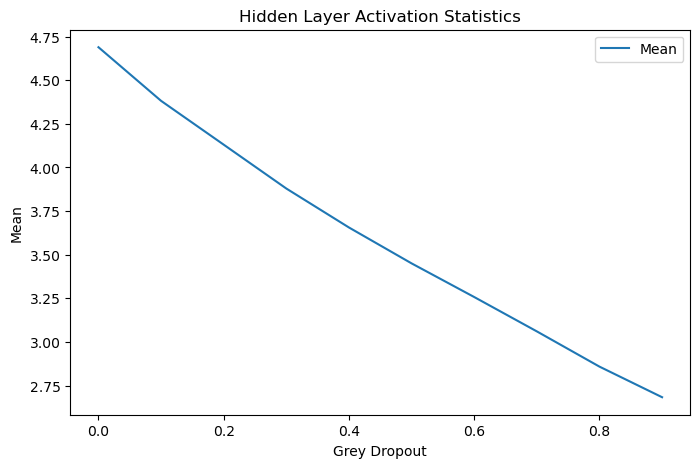

In [23]:
# Vary grey dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0.5)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Grey Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<Figure size 640x480 with 0 Axes>

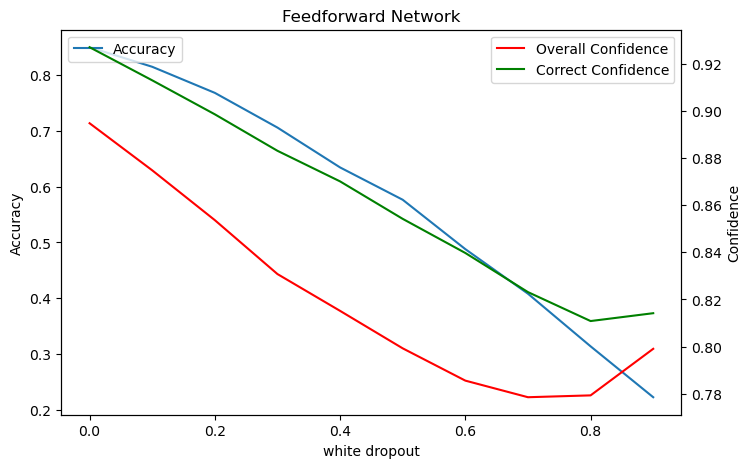

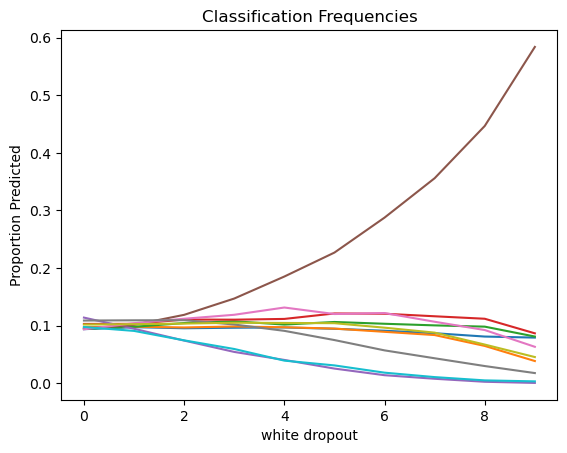

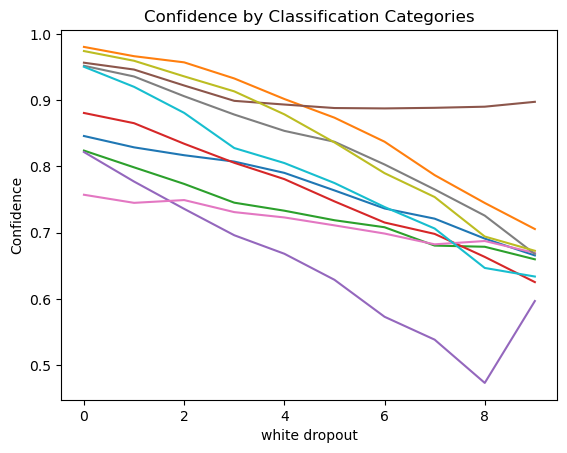

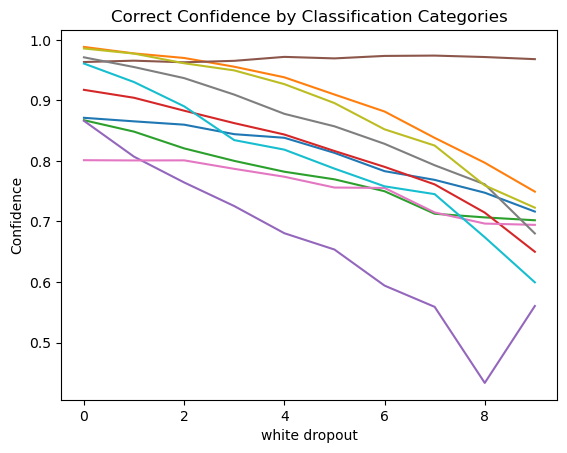

<Figure size 640x480 with 0 Axes>

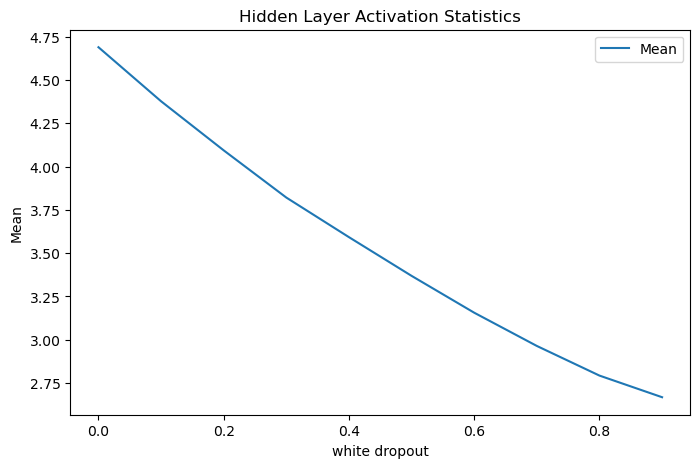

In [24]:
# Vary white dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("white dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("white dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("white dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

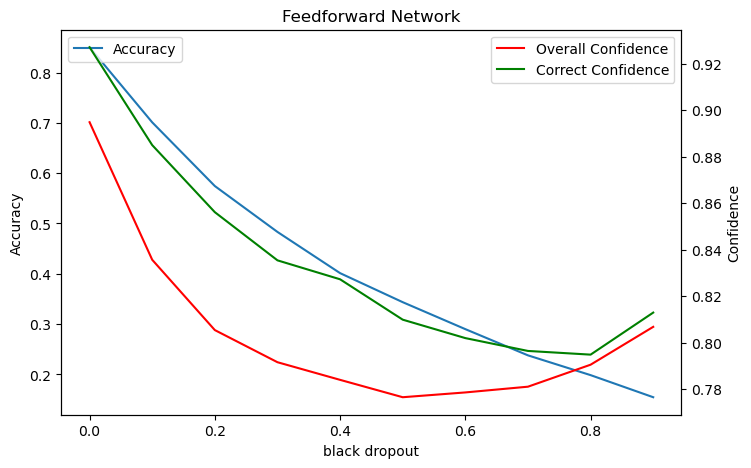

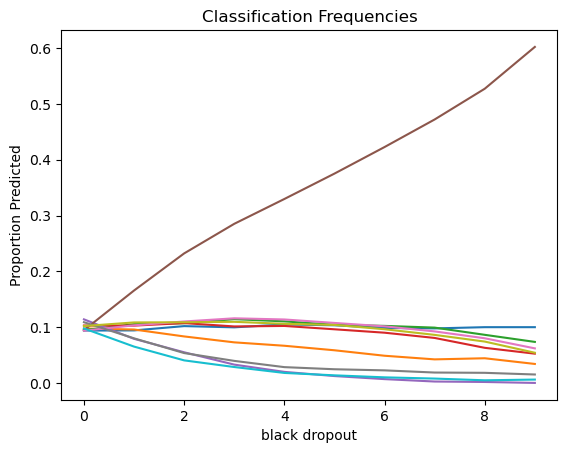

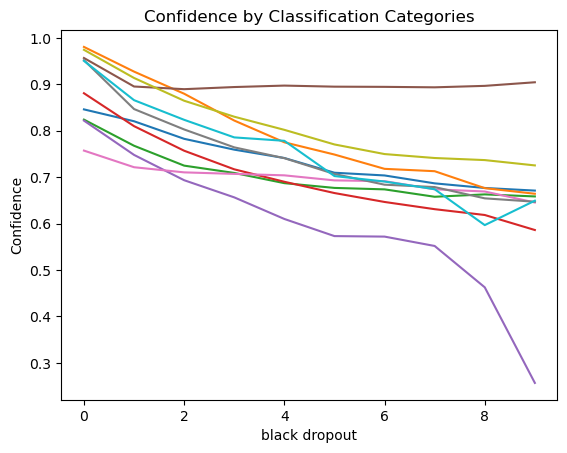

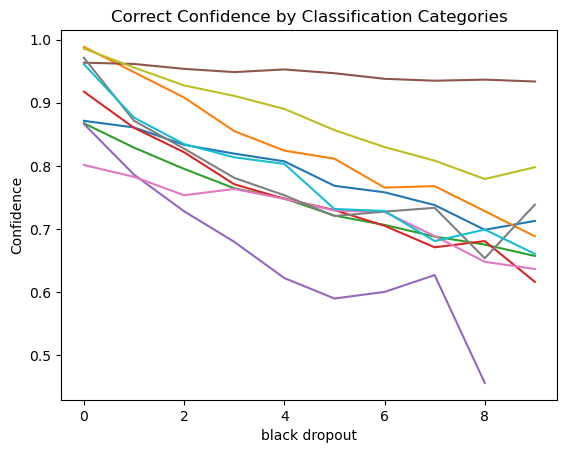

<Figure size 640x480 with 0 Axes>

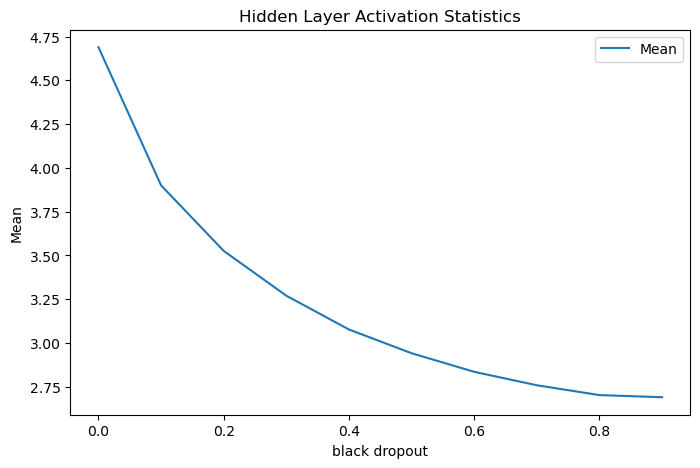

In [25]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],1)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("black dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("black dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("black dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("black dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Experiment 2a: Deep Feedforward Network

In [26]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer1 = Dense(10,activation='relu')(inputs)

layer2 = Dense(10,activation='relu')(layer1)
layer3 = Dense(10,activation='relu')(layer2)
layer4 = Dense(10,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00058: early stopping


<Figure size 640x480 with 0 Axes>

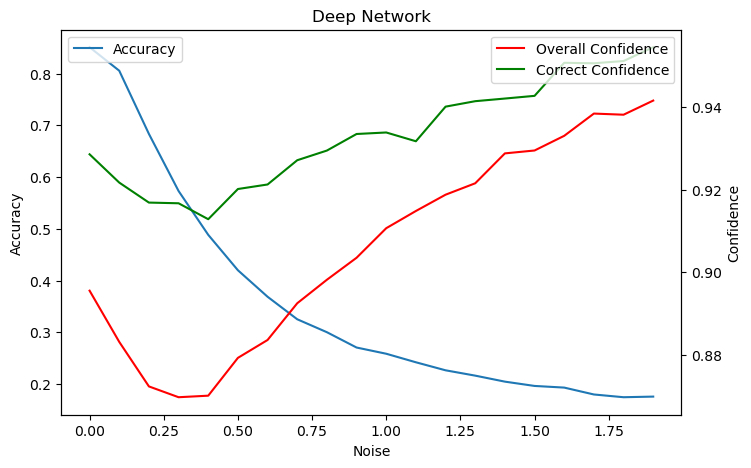

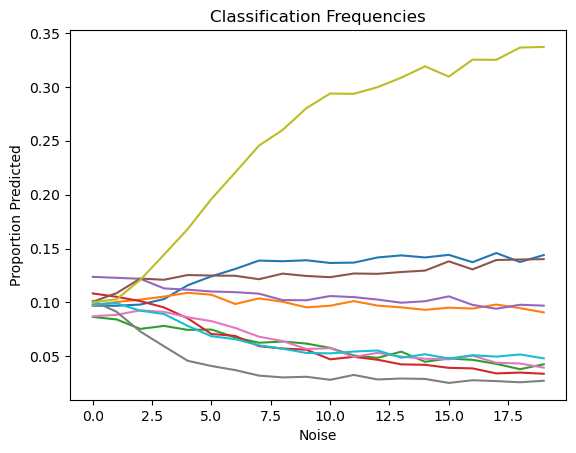

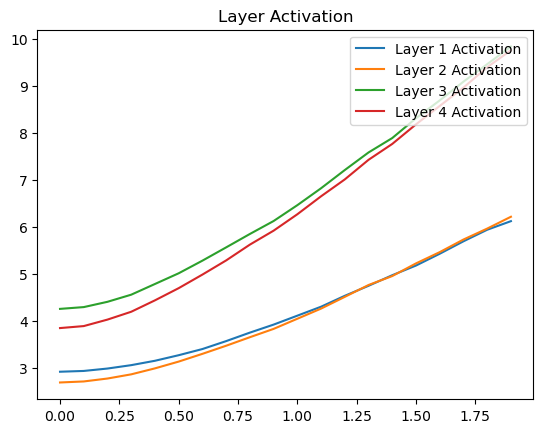

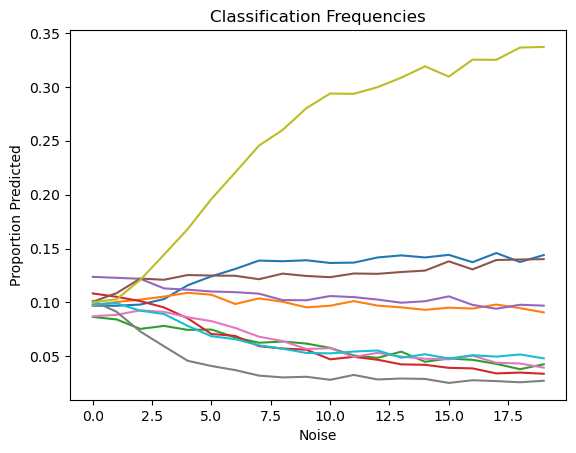

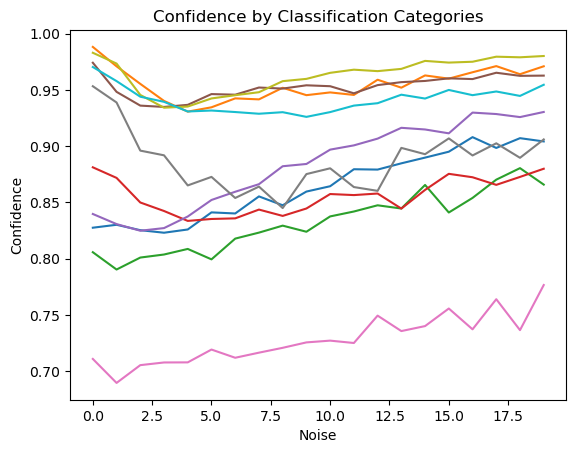

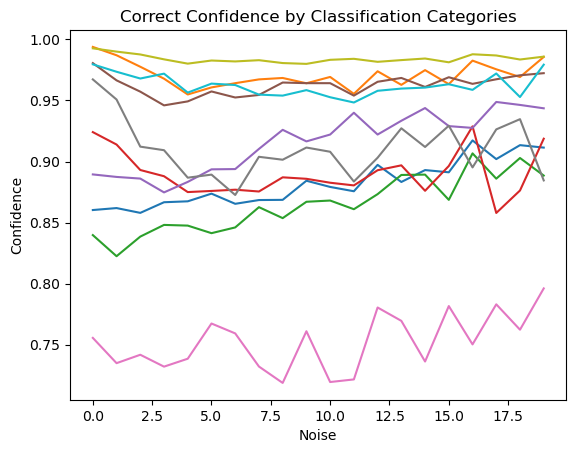

In [27]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

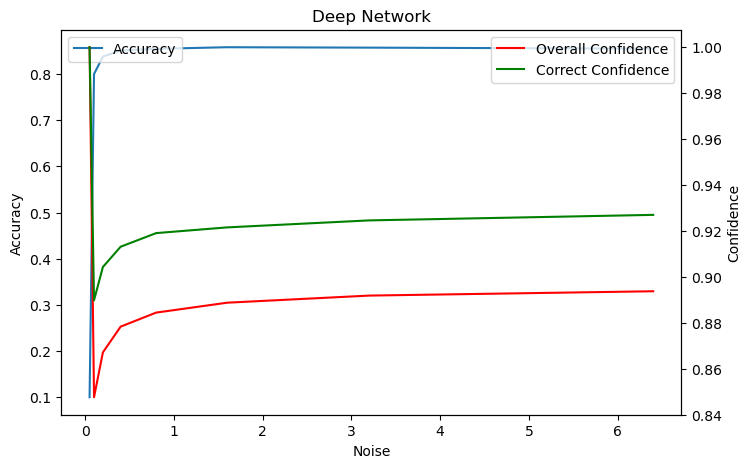

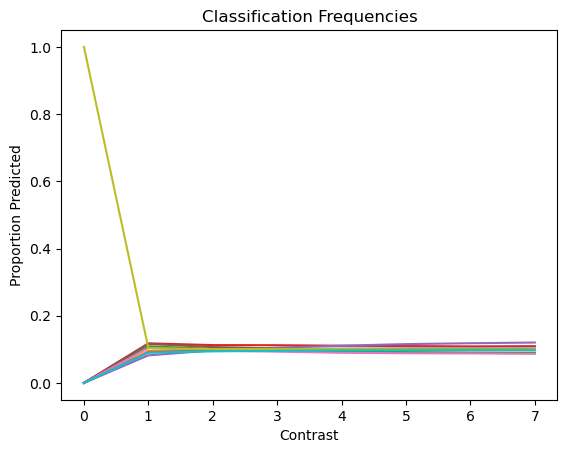

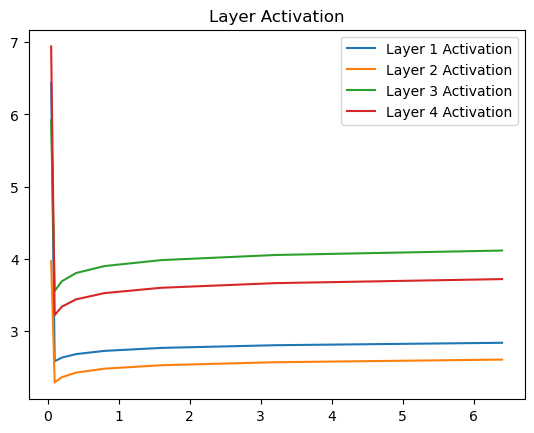

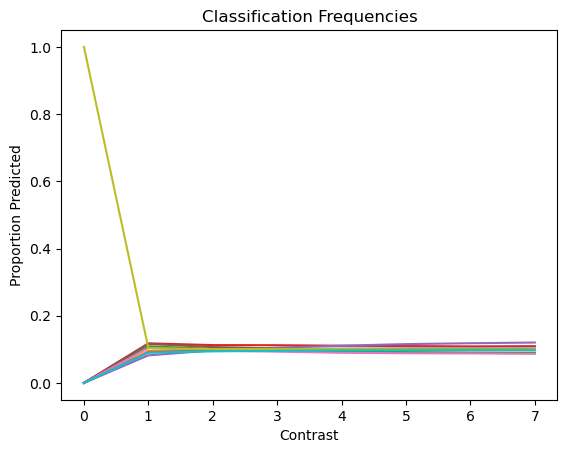

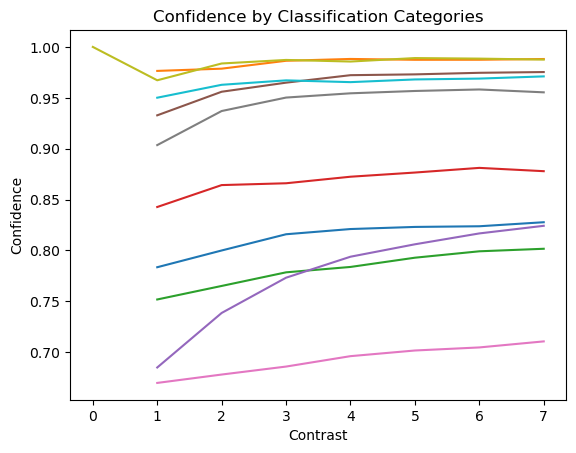

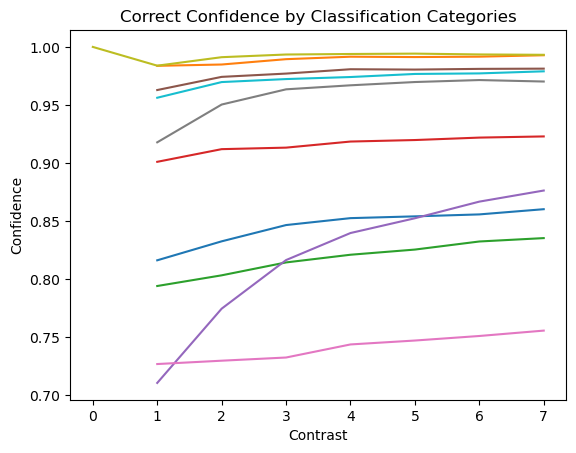

In [28]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 2b: Deep Feedforward Network- normalize 1st layer

In [29]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))


layer1 = Dense(10,activation='relu')(inputs)

layer1 = LayerNormalization()(layer1)

layer2 = Dense(10,activation='relu')(layer1)
layer3 = Dense(10,activation='relu')(layer2)
layer4 = Dense(10,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00042: early stopping


<Figure size 640x480 with 0 Axes>

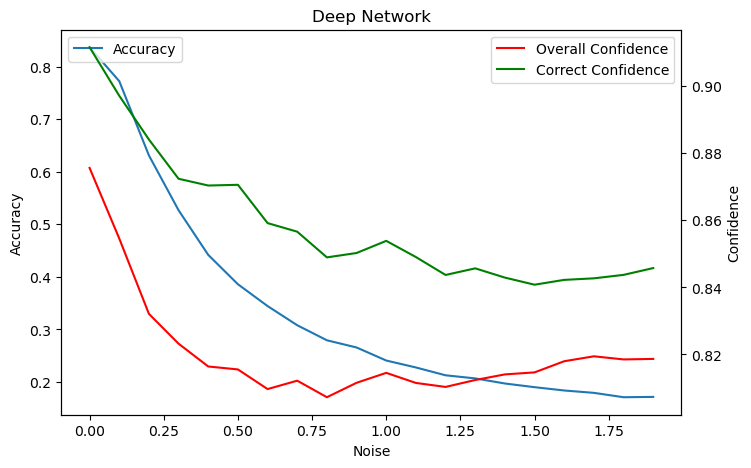

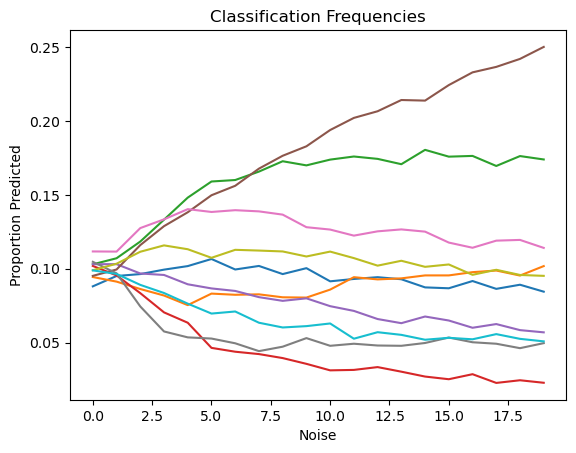

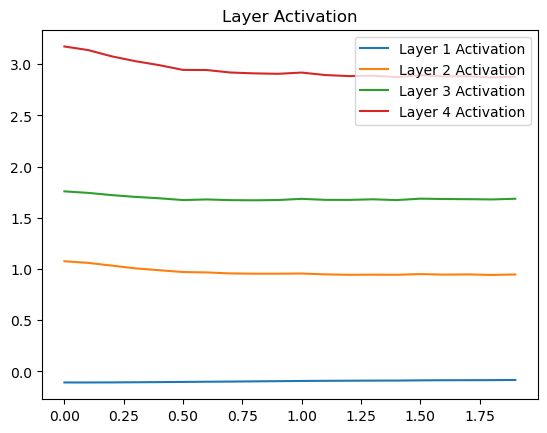

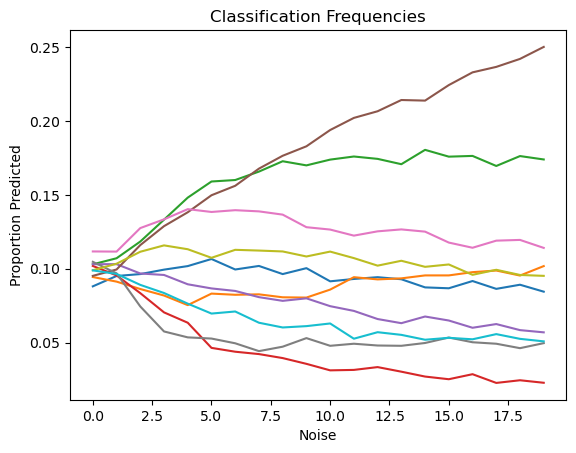

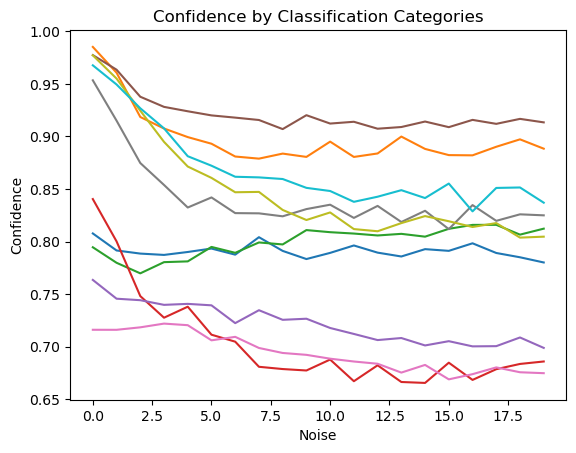

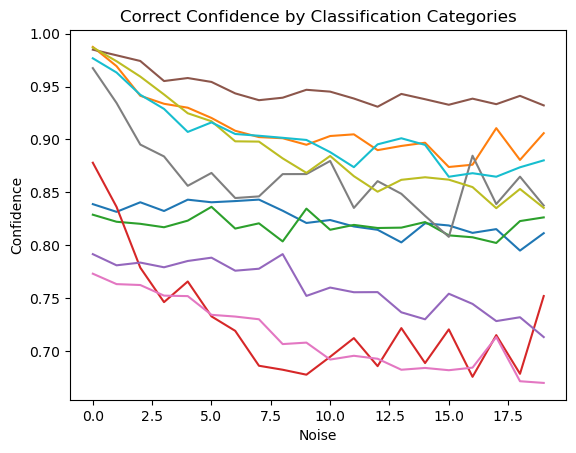

In [30]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

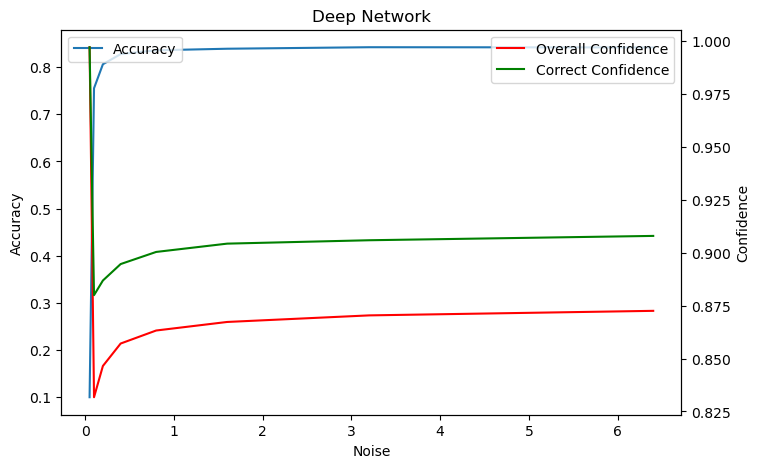

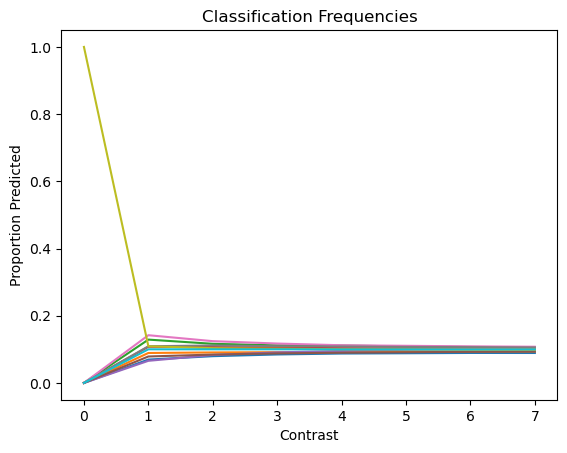

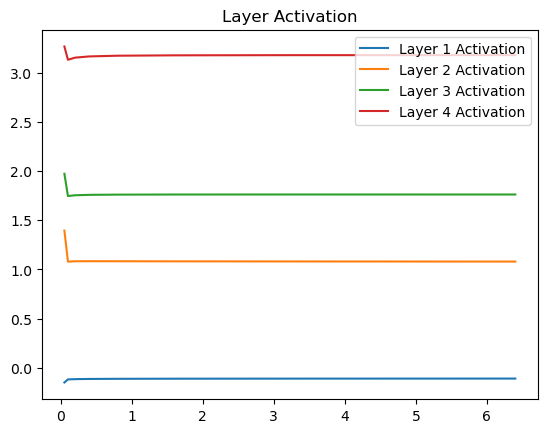

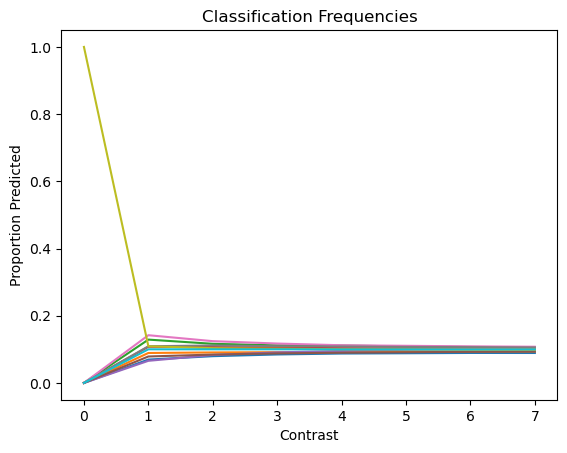

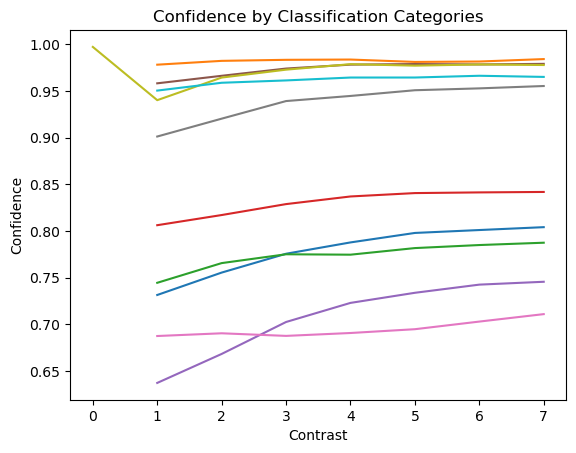

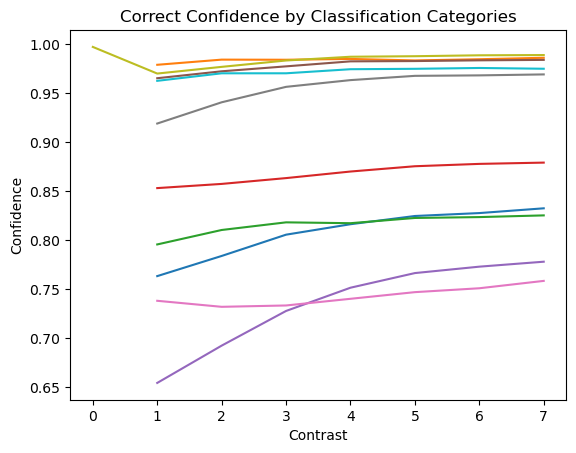

In [31]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 2c: Deep Feedforward Network- normalize 2nd layer

In [32]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

layer1 = Dense(10,activation='relu')(inputs)
layer2 = Dense(10,activation='relu')(layer1)

layer2 = LayerNormalization()(layer2)

layer3 = Dense(10,activation='relu')(layer2)
layer4 = Dense(10,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00043: early stopping


<Figure size 640x480 with 0 Axes>

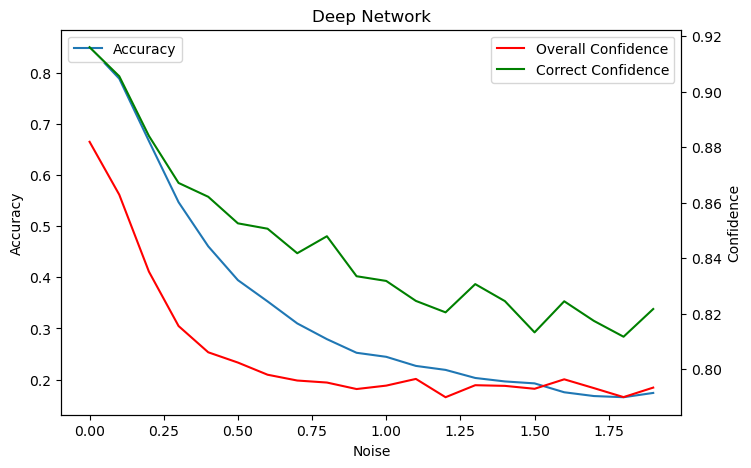

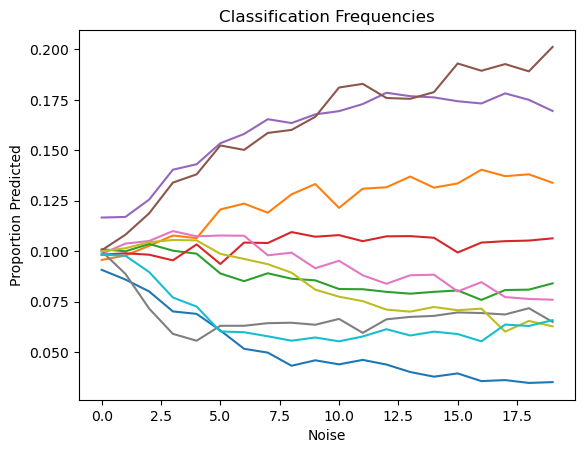

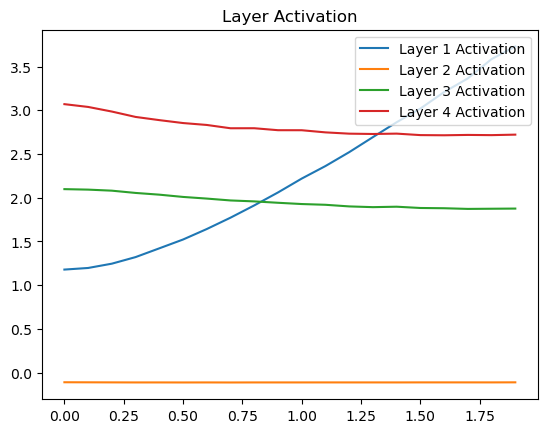

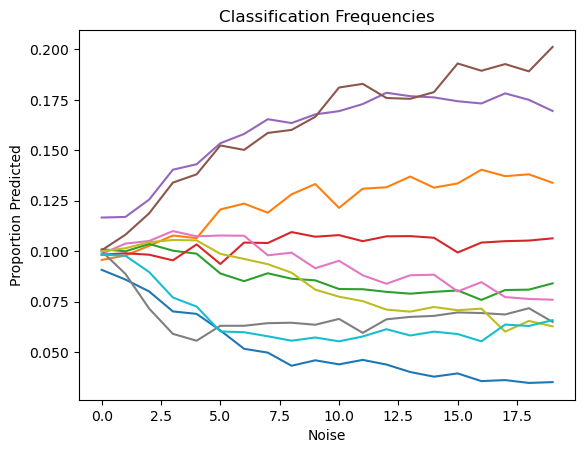

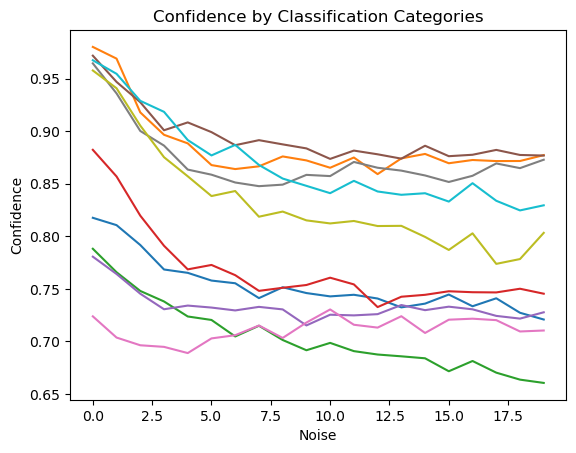

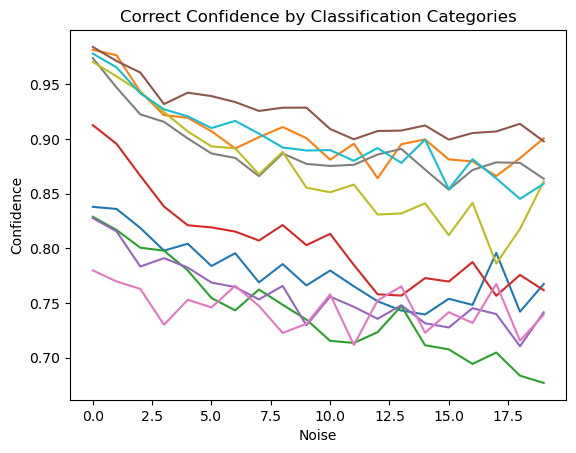

In [33]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

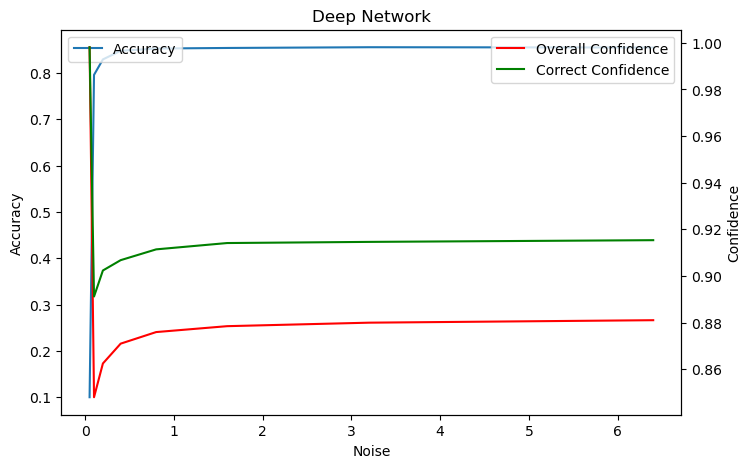

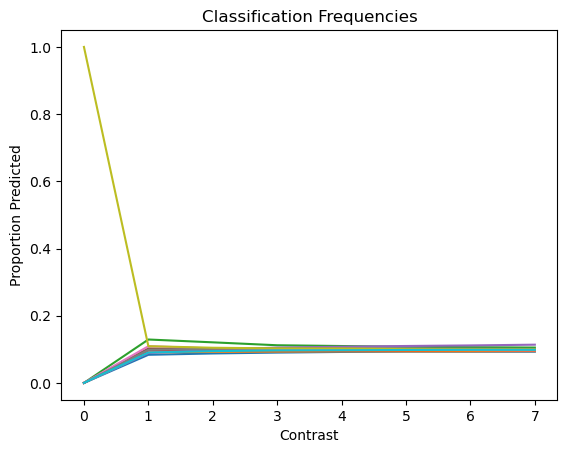

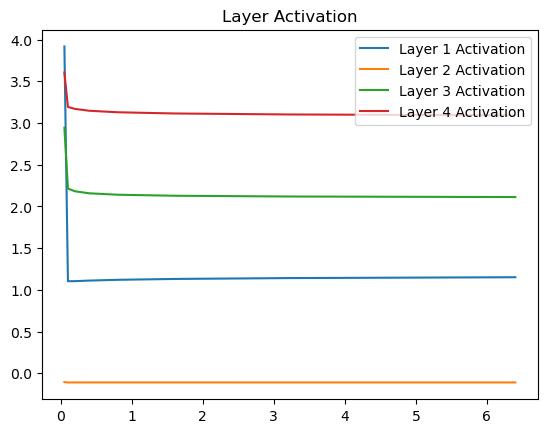

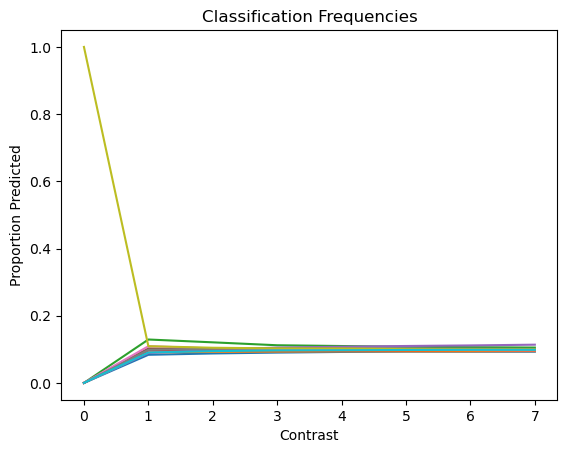

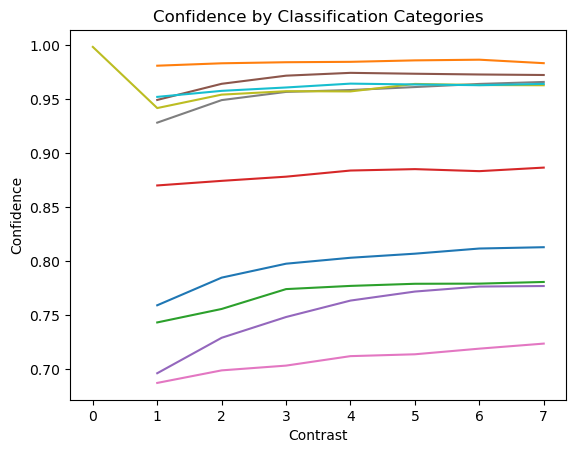

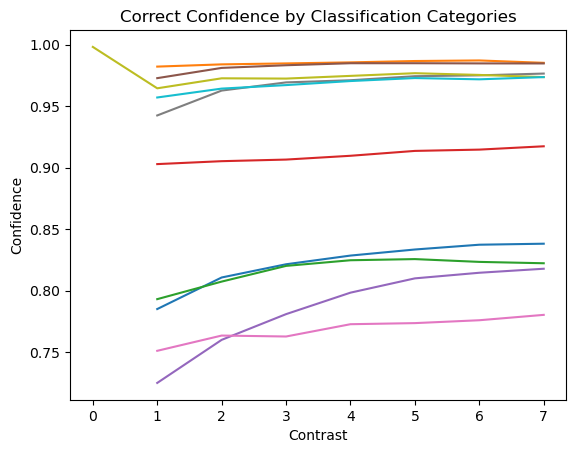

In [34]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 2d: Deep Feedforward Network- normalize 3rd layer

In [35]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

layer1 = Dense(10,activation='relu')(inputs)
layer2 = Dense(10,activation='relu')(layer1)
layer3 = Dense(10,activation='relu')(layer2)

layer3 = LayerNormalization()(layer3)

layer4 = Dense(10,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00029: early stopping


<Figure size 640x480 with 0 Axes>

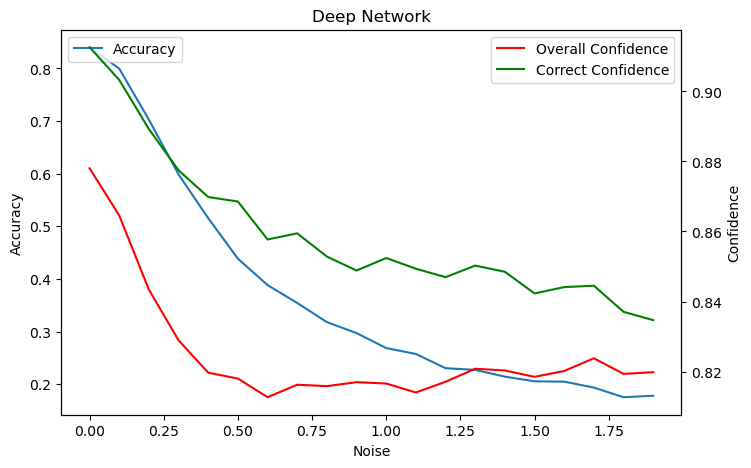

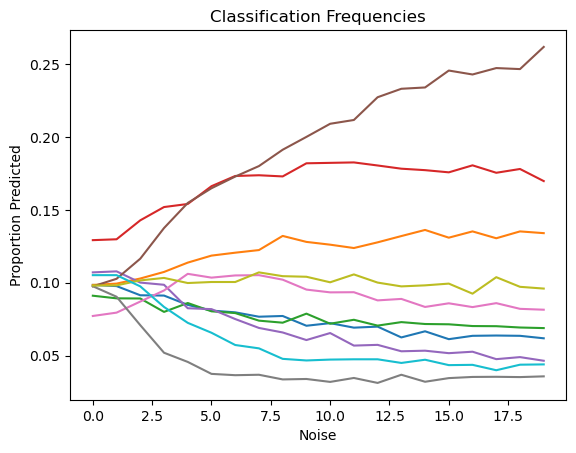

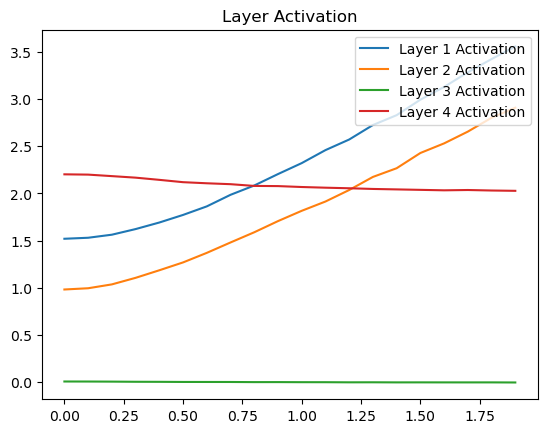

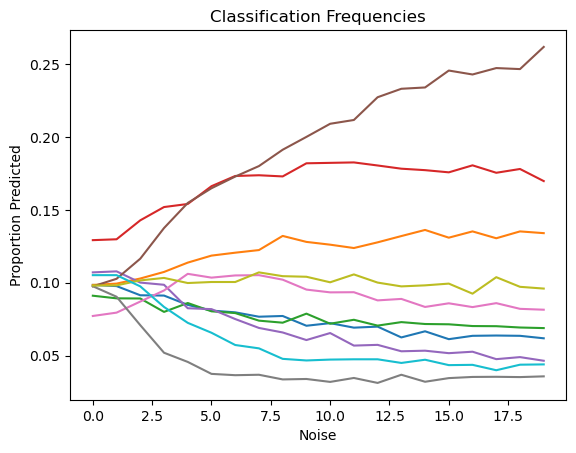

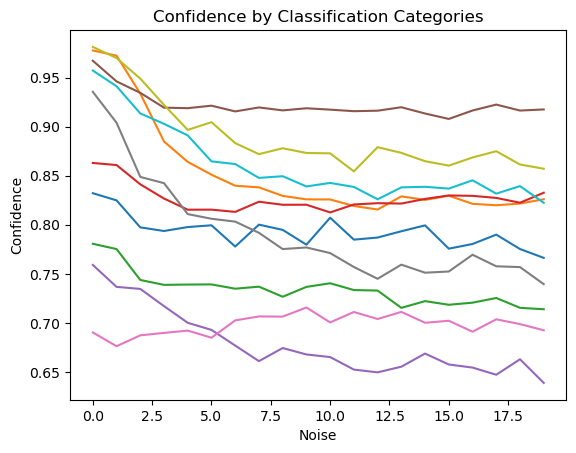

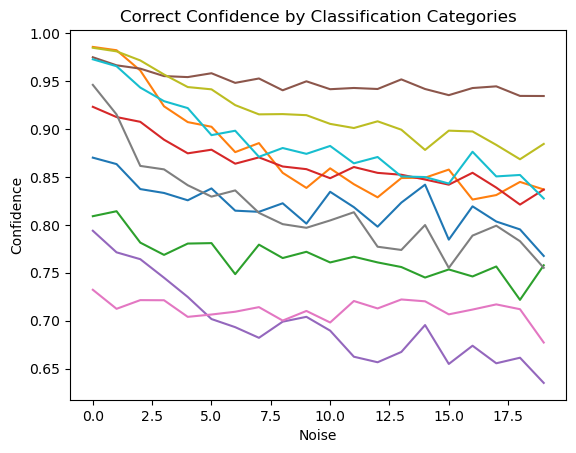

In [36]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

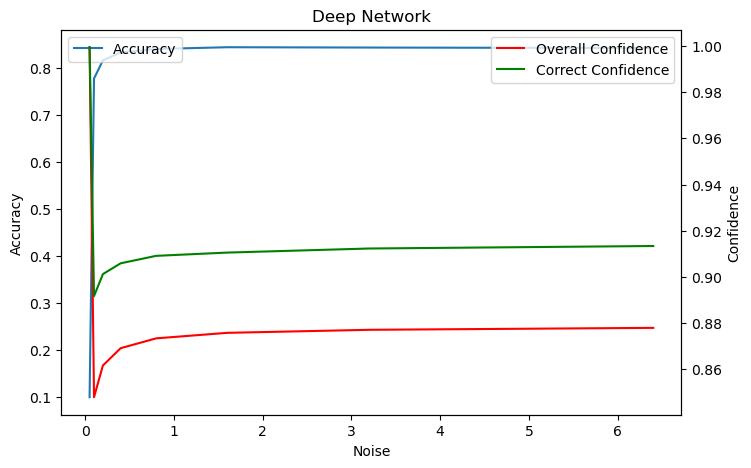

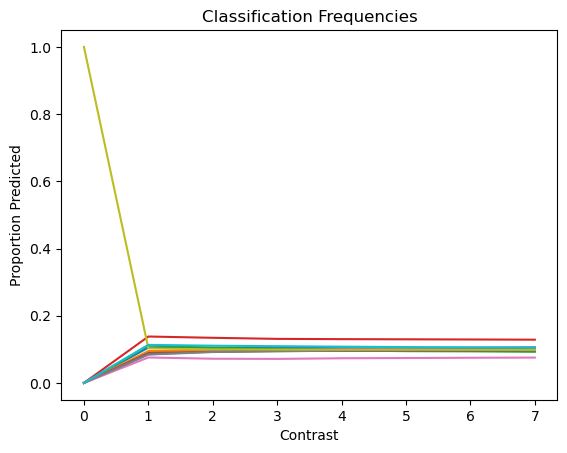

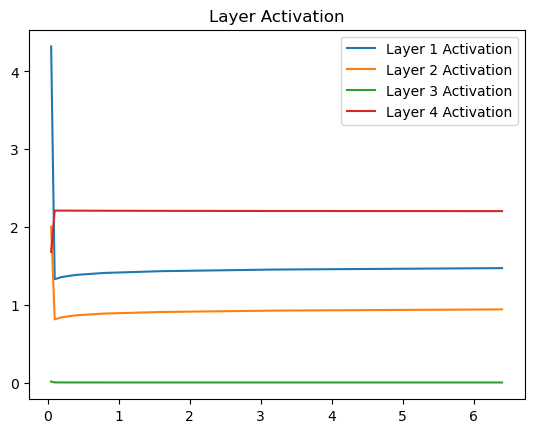

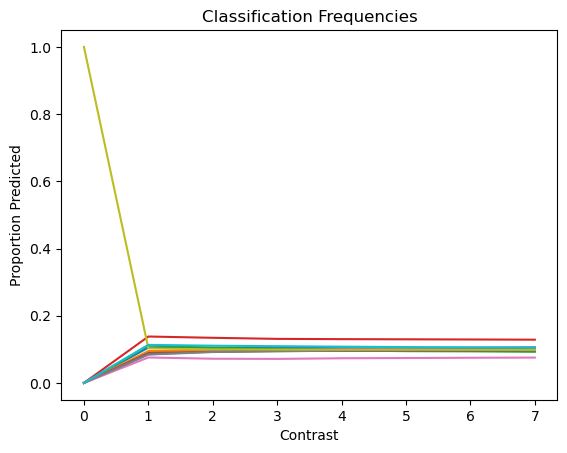

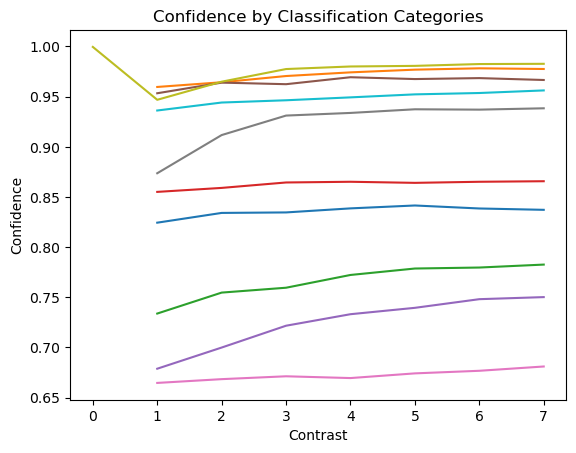

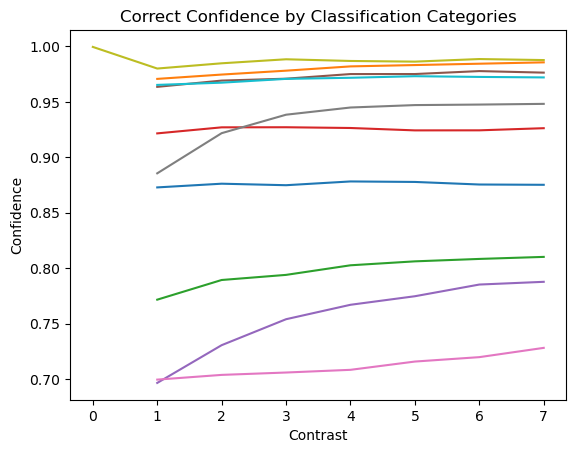

In [37]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 2e: Deep Feedforward Network- normalize 4st layer

In [38]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

layer1 = Dense(10,activation='relu')(inputs)
layer2 = Dense(10,activation='relu')(layer1)
layer3 = Dense(10,activation='relu')(layer2)
layer4 = Dense(10,activation='relu')(layer3)

layer4 = LayerNormalization()(layer4)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00033: early stopping


<Figure size 640x480 with 0 Axes>

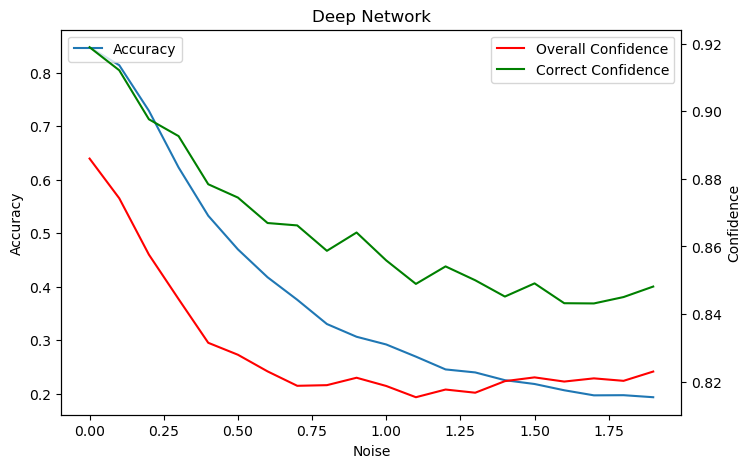

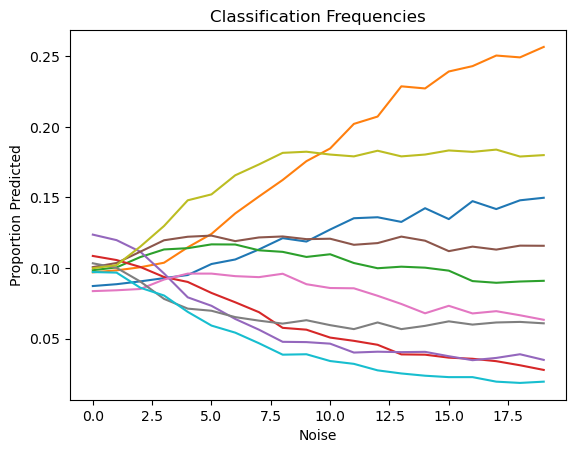

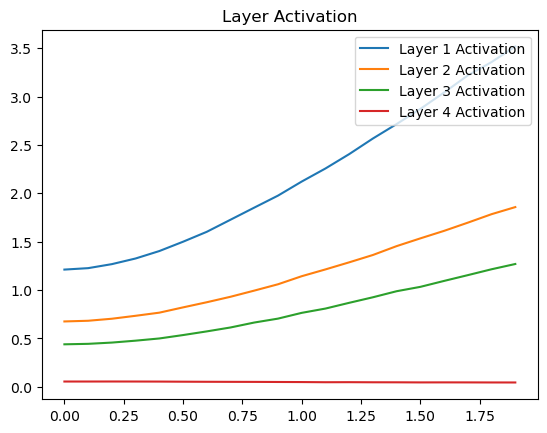

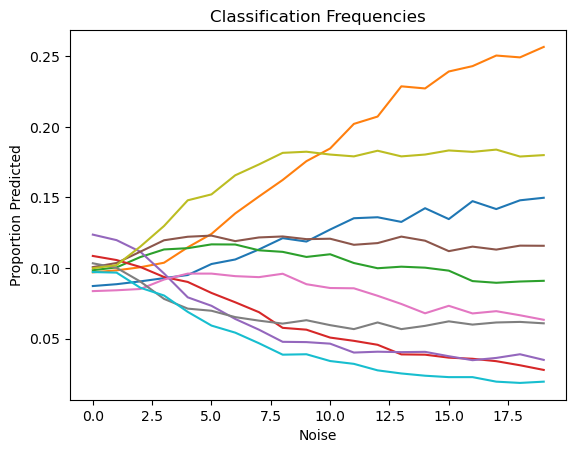

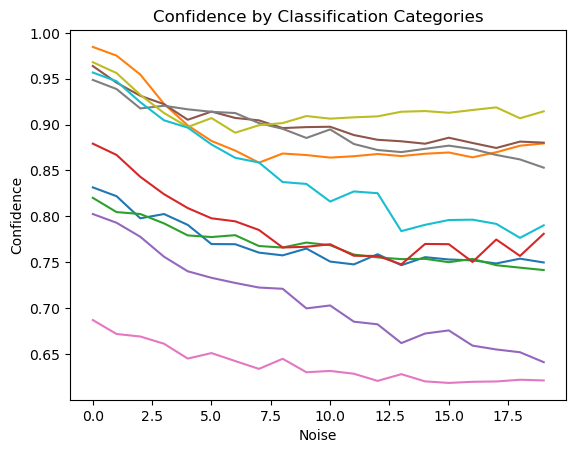

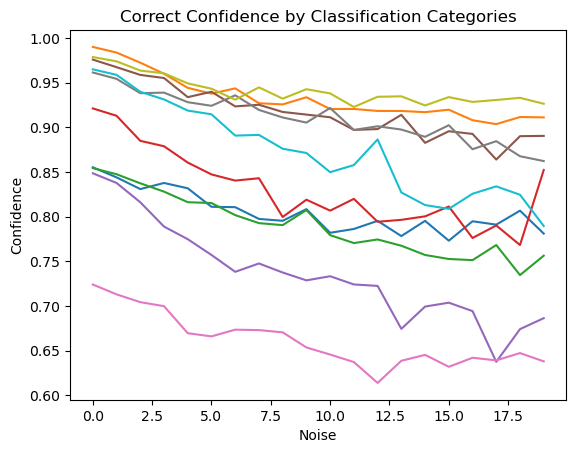

In [39]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

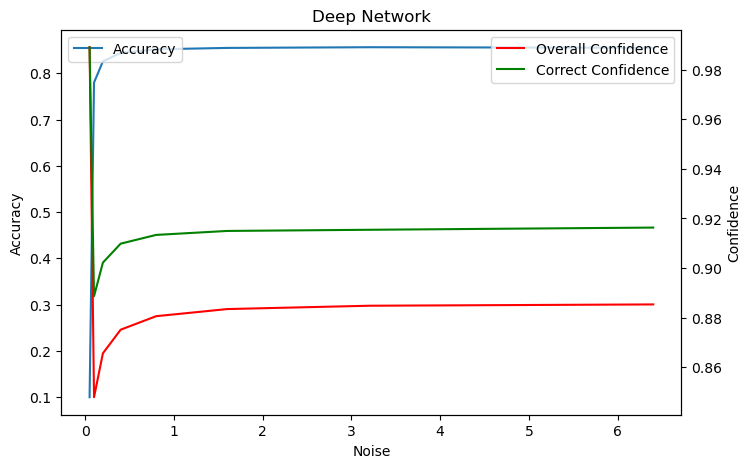

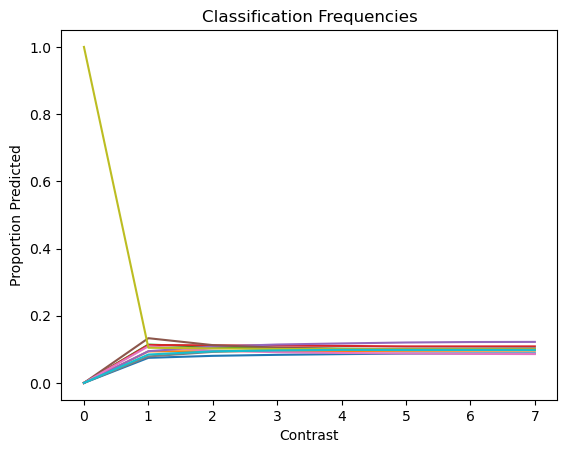

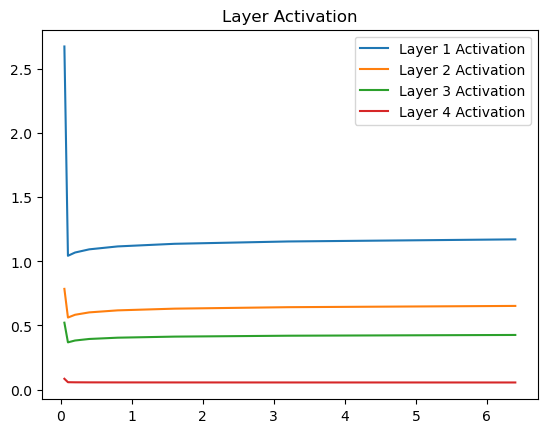

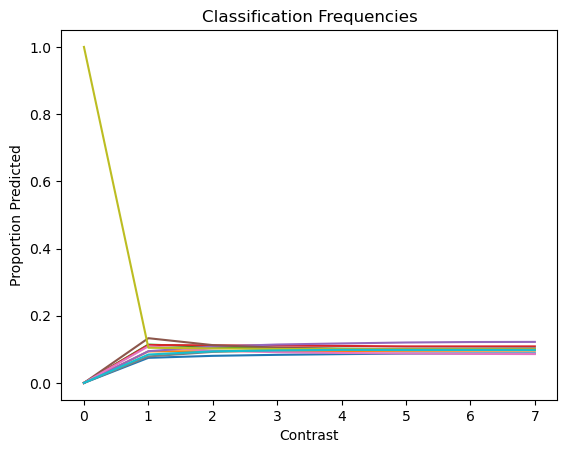

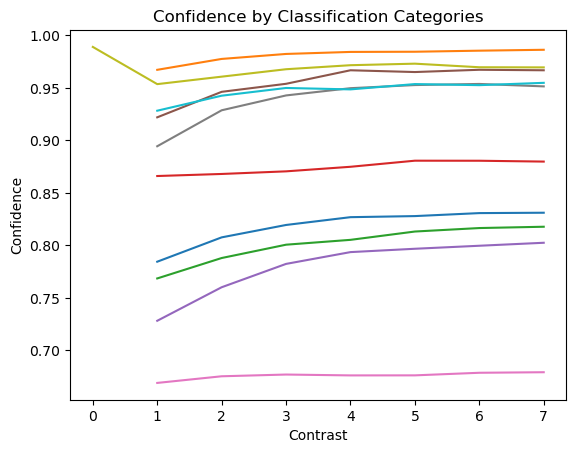

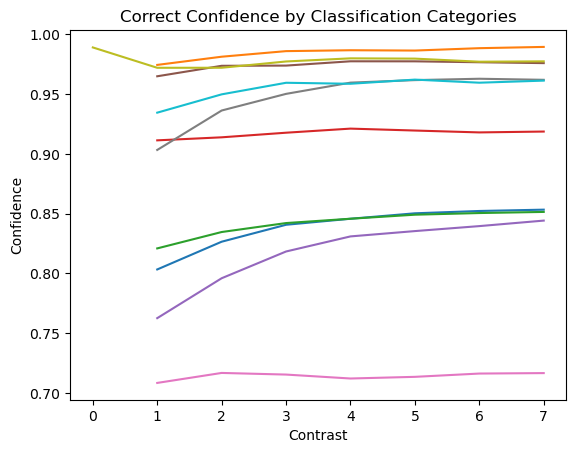

In [40]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 3a: Wide Network 

In [41]:
#Train wide feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer = Dense(200,activation='relu')(inputs)


outputs = Dense(10,activation='softmax')(layer)

model_wide = Model(inputs=inputs,outputs=outputs)

model_hidden = Model(inputs=inputs,outputs=layer)

model_wide.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_wide.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00038: early stopping


<Figure size 640x480 with 0 Axes>

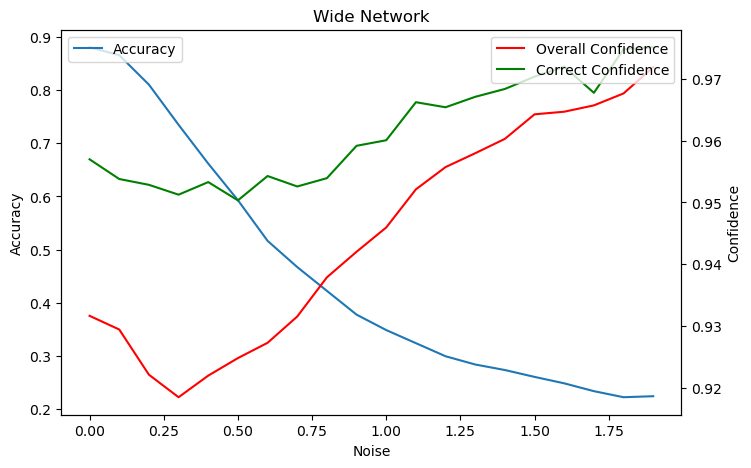

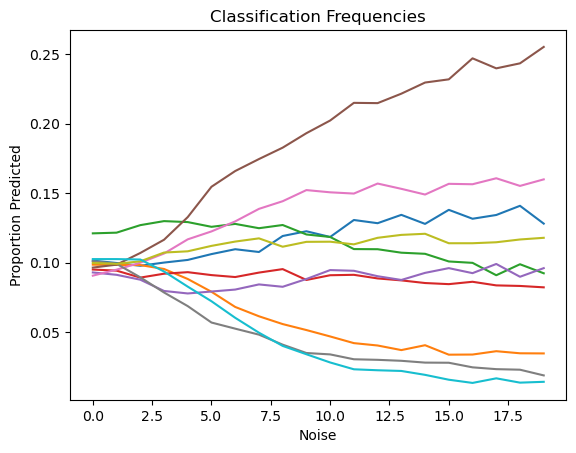

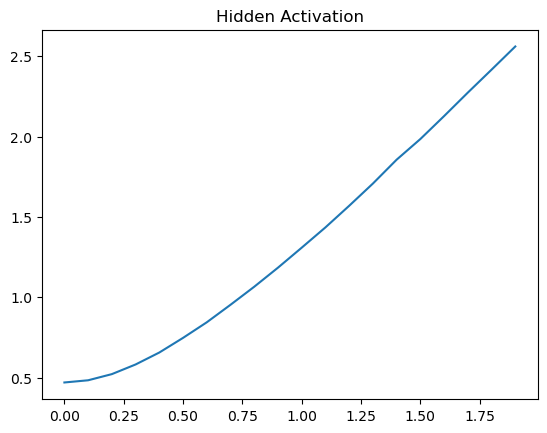

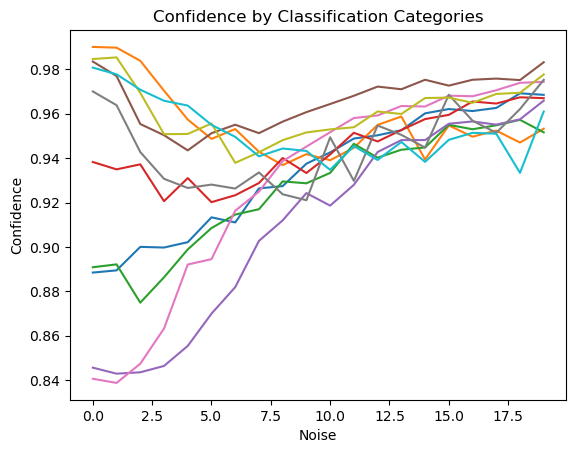

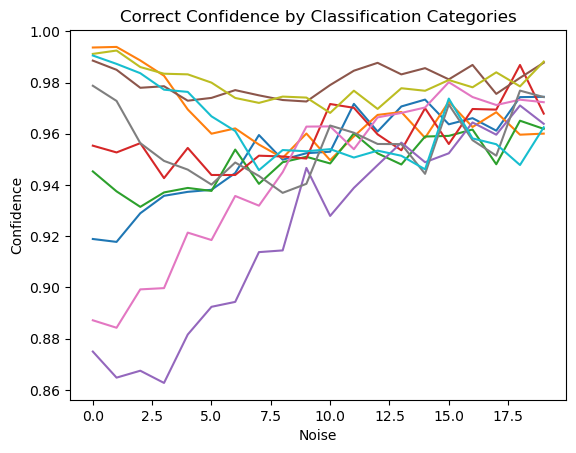

In [42]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))

hidden_activation = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_wide.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    hidden_output = model_hidden.predict(images_testing_noise_flat)
    
    hidden_activation.append(np.mean(hidden_output))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Wide Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")


plt.figure(3)
plt.plot(sd_test,hidden_activation)
plt.title("Hidden Activation")


plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

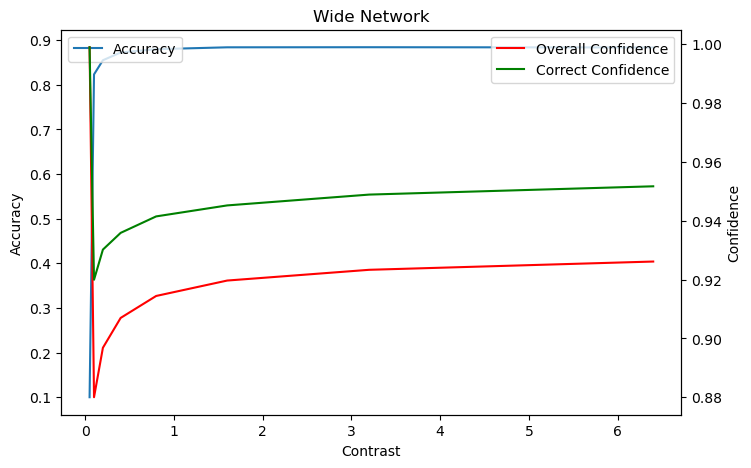

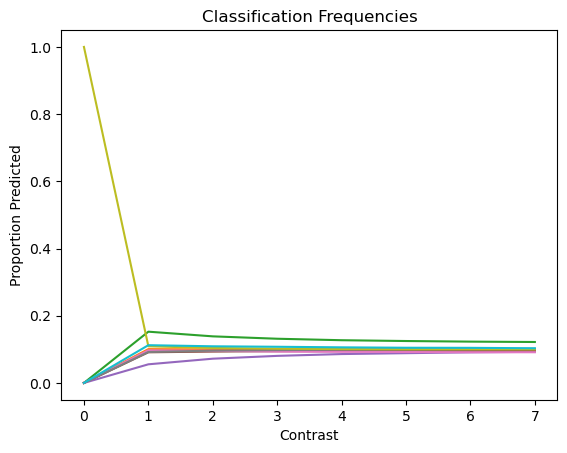

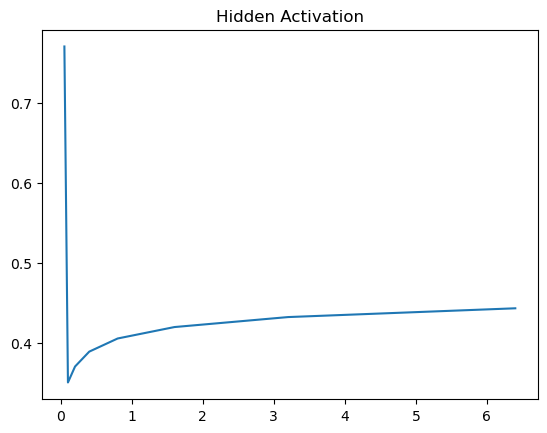

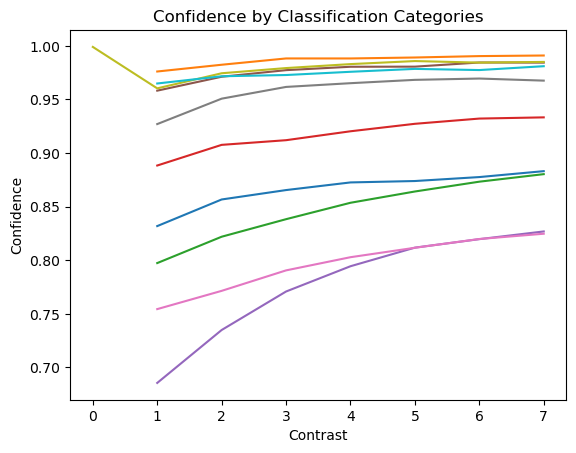

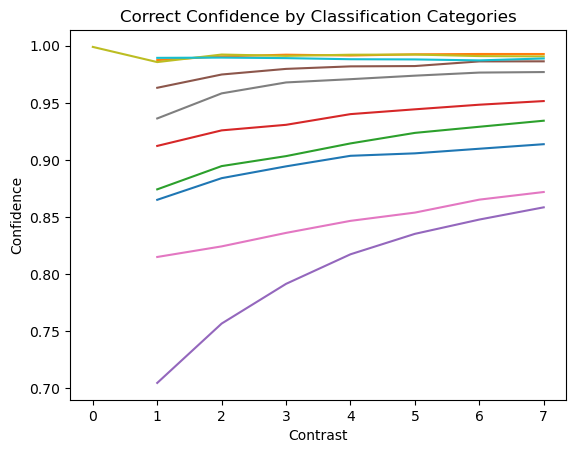

In [43]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))

hidden_activation = []

for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_wide.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    hidden_output = model_hidden.predict(images_testing_noise_flat)
    
    hidden_activation.append(np.mean(hidden_output))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Wide Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")


plt.figure(3)
plt.plot(cd_test,hidden_activation)
plt.title("Hidden Activation")


plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 3b: Wide Network Hidden layer normalization

In [44]:
#Train wide feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer = Dense(200,activation='relu')(inputs)

layer = LayerNormalization()(layer)

outputs = Dense(10,activation='softmax')(layer)

model_wide = Model(inputs=inputs,outputs=outputs)

model_hidden = Model(inputs=inputs,outputs=layer)

model_wide.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_wide.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00031: early stopping


<Figure size 640x480 with 0 Axes>

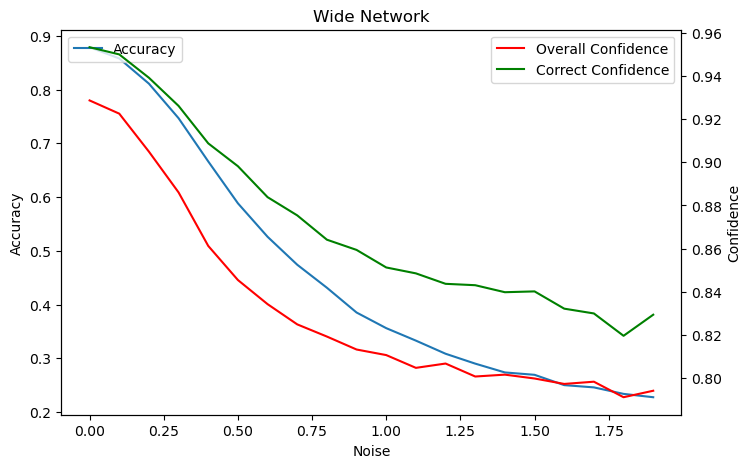

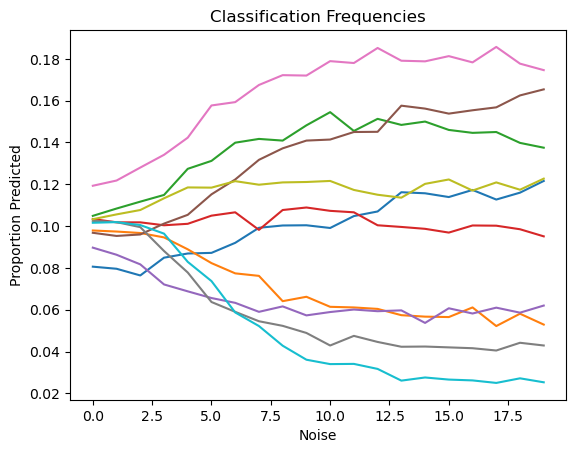

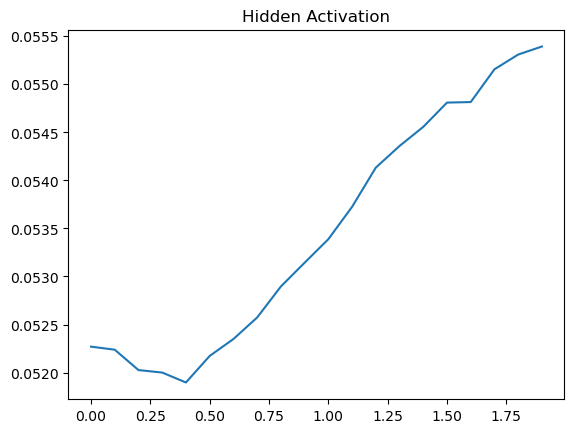

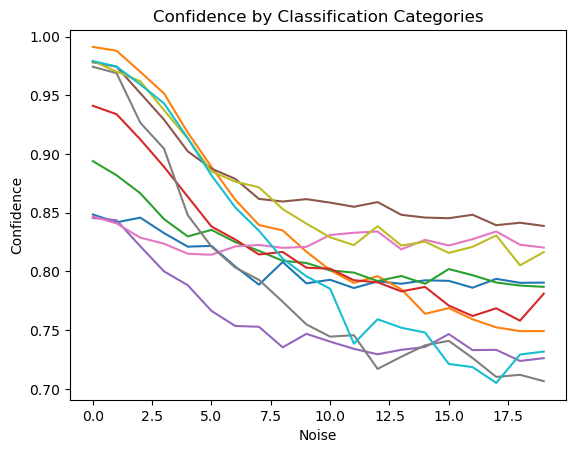

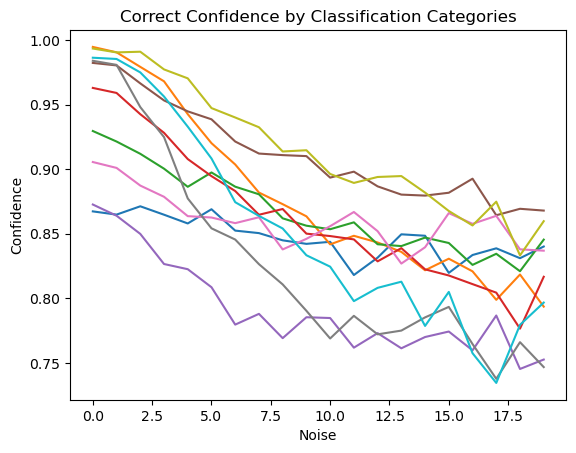

In [45]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))

hidden_activation = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_wide.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    hidden_output = model_hidden.predict(images_testing_noise_flat)
    
    hidden_activation.append(np.mean(hidden_output))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Wide Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")


plt.figure(3)
plt.plot(sd_test,hidden_activation)
plt.title("Hidden Activation")


plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

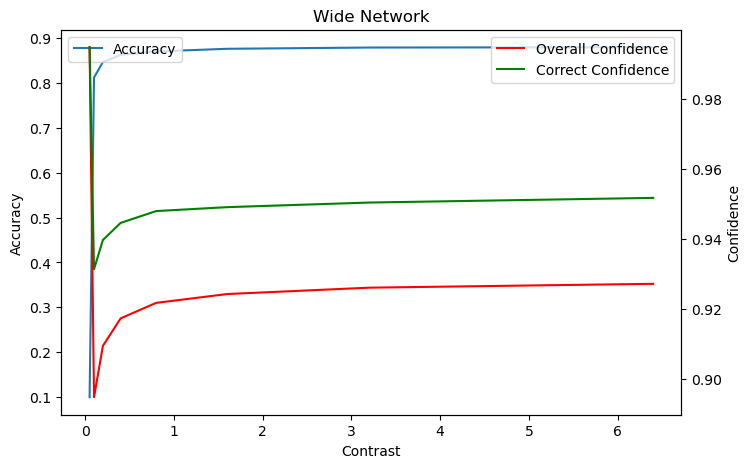

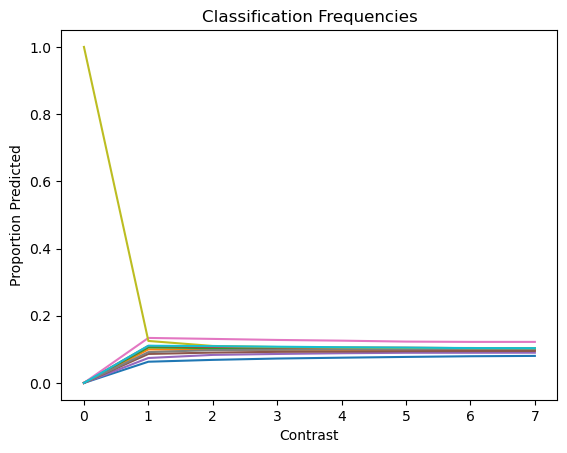

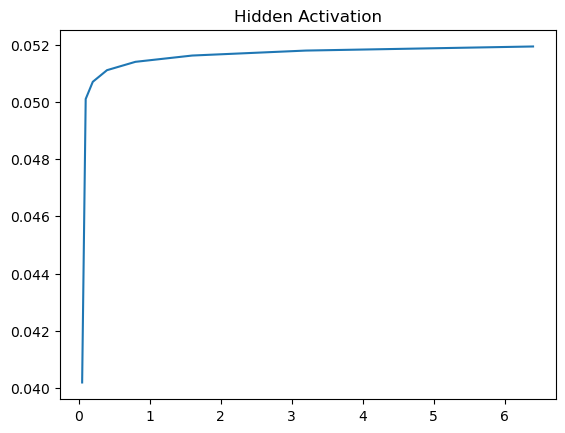

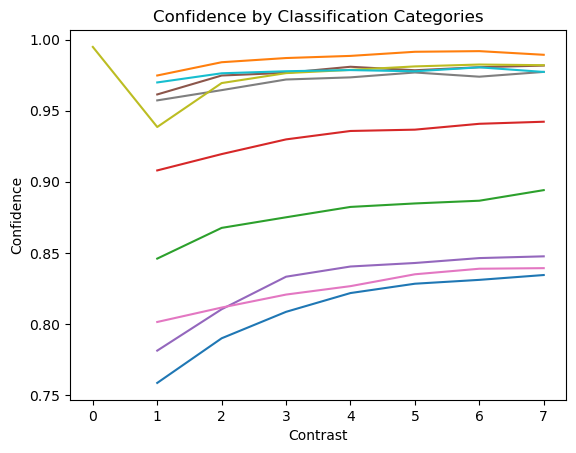

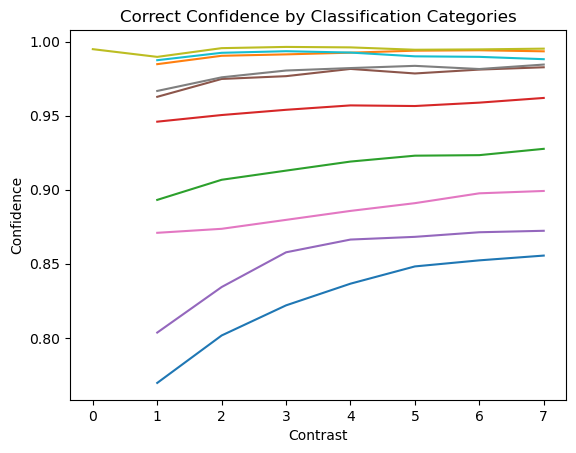

In [46]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))

hidden_activation = []

for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_wide.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    hidden_output = model_hidden.predict(images_testing_noise_flat)
    
    hidden_activation.append(np.mean(hidden_output))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Wide Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")


plt.figure(3)
plt.plot(cd_test,hidden_activation)
plt.title("Hidden Activation")


plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 4: Large Network

In [47]:
#Train deep feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer1 = Dense(200,activation='relu')(inputs)

layer2 = Dense(200,activation='relu')(layer1)
layer3 = Dense(200,activation='relu')(layer2)
layer4 = Dense(200,activation='relu')(layer3)

outputs = Dense(10,activation='softmax')(layer4)

model_deep = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)
model_layer3 = Model(inputs=inputs,outputs=layer3)
model_layer4 = Model(inputs=inputs,outputs=layer4)

model_deep.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_deep.fit(images_training_flat,labels_training,batch_size=100,verbose=0,epochs=500,validation_split=0.33,callbacks=[es])


Epoch 00031: early stopping


<Figure size 640x480 with 0 Axes>

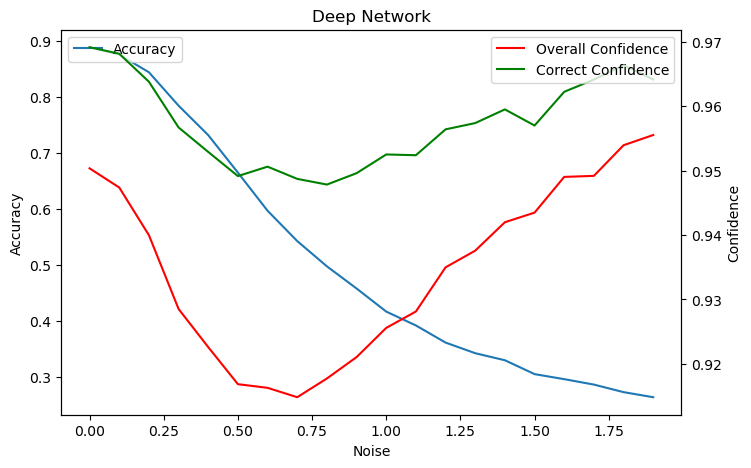

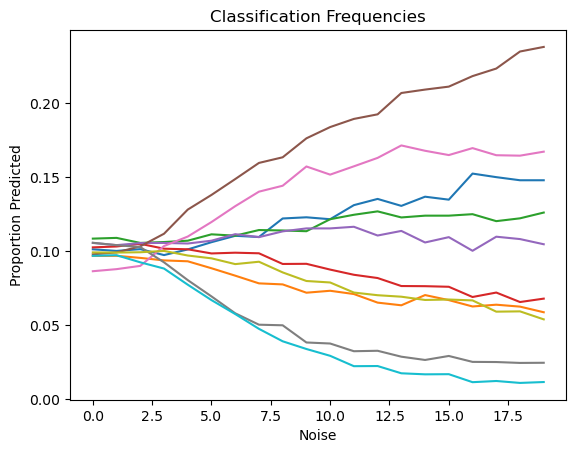

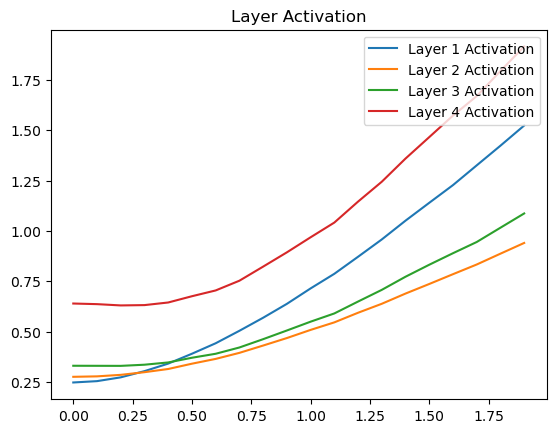

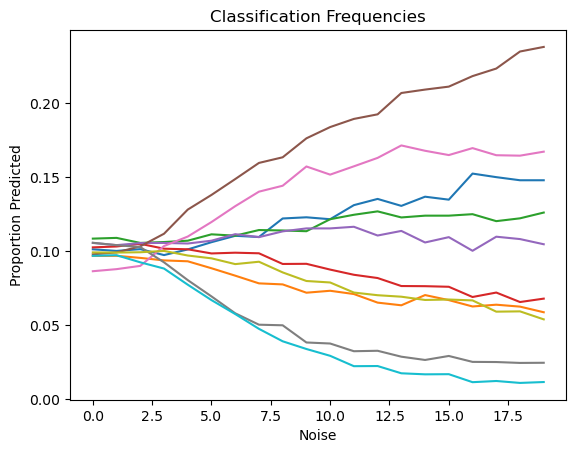

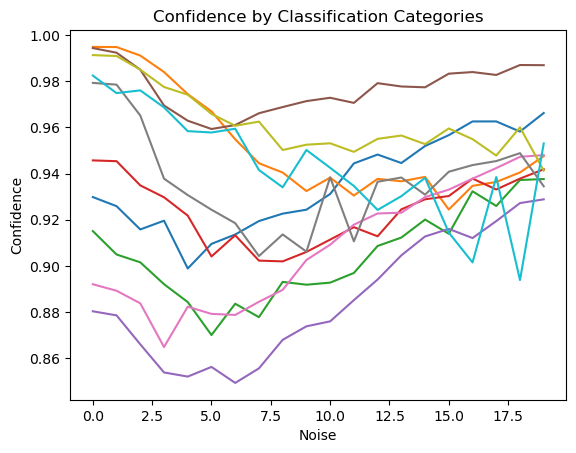

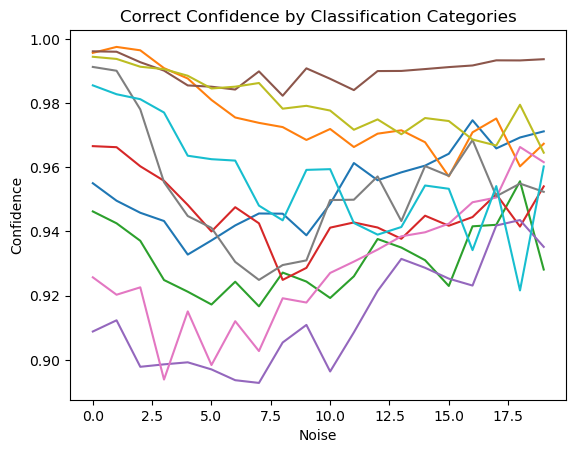

In [48]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(sd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(sd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(sd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(sd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

<ipython-input-4-2497c16af76f>:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
<ipython-input-4-2497c16af76f>:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


<Figure size 640x480 with 0 Axes>

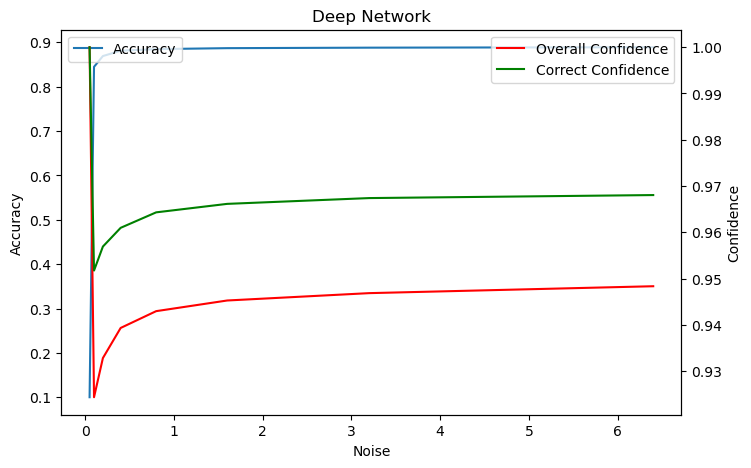

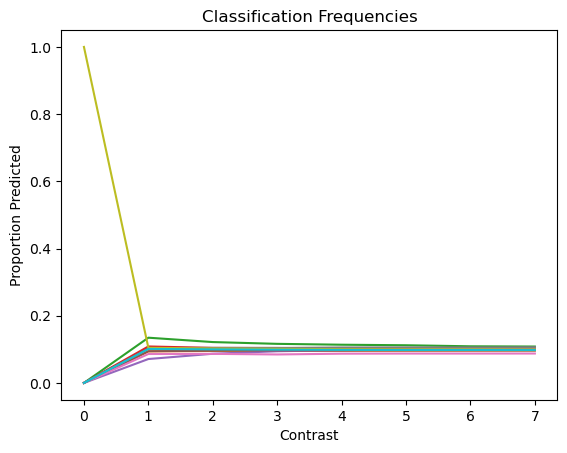

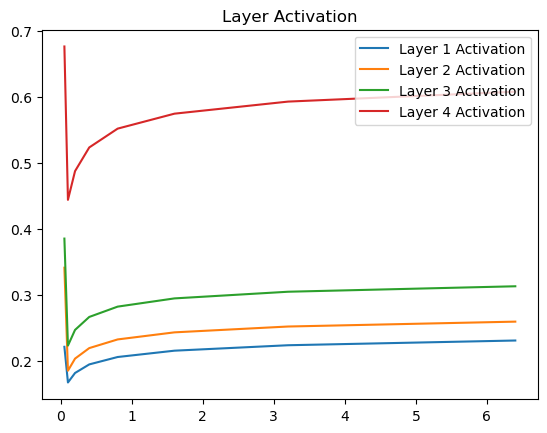

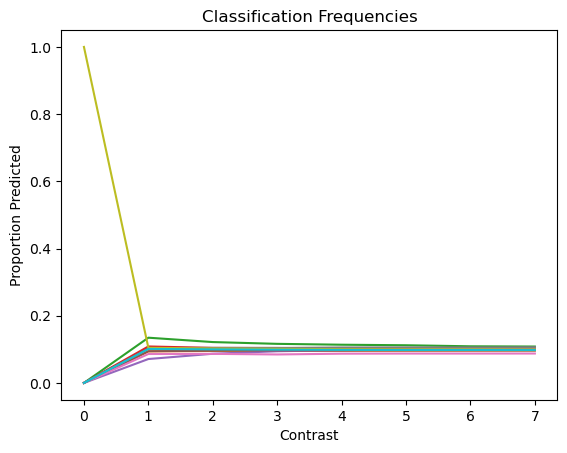

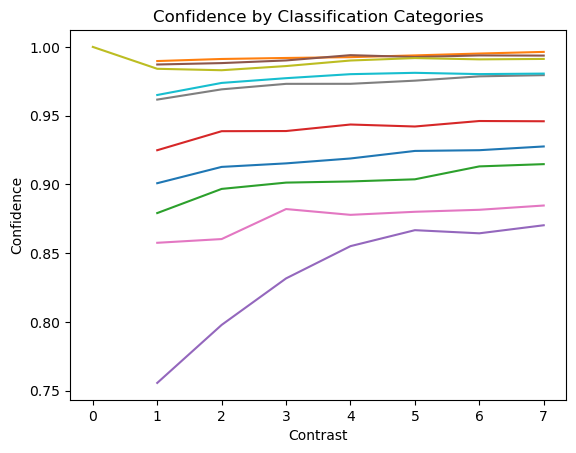

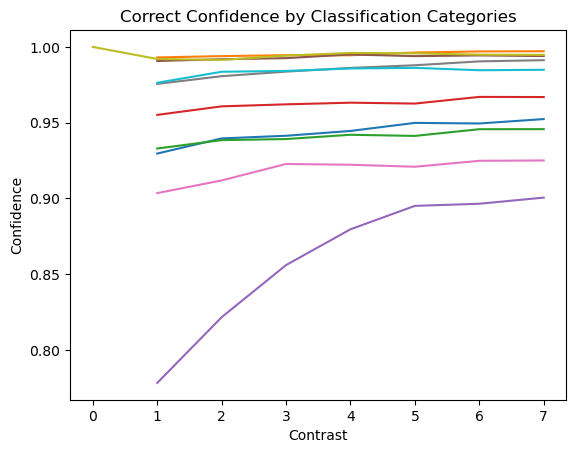

In [49]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

layer1_activation = []
layer2_activation = []
layer3_activation = []
layer4_activation = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))



for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_deep.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    

    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    hidden_activation1 = model_layer1.predict(images_testing_noise_flat)
    hidden_activation2 = model_layer2.predict(images_testing_noise_flat)
    hidden_activation3 = model_layer3.predict(images_testing_noise_flat)
    hidden_activation4 = model_layer4.predict(images_testing_noise_flat)
    
    layer1_activation.append(np.mean(hidden_activation1))
    layer2_activation.append(np.mean(hidden_activation2))
    layer3_activation.append(np.mean(hidden_activation3))
    layer4_activation.append(np.mean(hidden_activation4))    

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Deep Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

plt.figure(3)
plt.plot(cd_test,layer1_activation,label ="Layer 1 Activation")
plt.plot(cd_test,layer2_activation,label ="Layer 2 Activation")
plt.plot(cd_test,layer3_activation,label ="Layer 3 Activation")
plt.plot(cd_test,layer4_activation,label ="Layer 4 Activation")
plt.legend(loc= "upper right")
plt.title("Layer Activation")

plt.figure(4)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(5)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(6)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()

# Experiment 5: Convolutional Neural Network 

In [50]:
#Train large feedforward model

images_training_conv = images_training[:,:,:,np.newaxis]


inputs = Input(shape=(28,28,1))

layer = Conv2D(32, kernel_size=(3, 3), activation="relu")(inputs)
layer1 = MaxPooling2D(pool_size=(2, 2))(layer)

layer2 = Conv2D(64, kernel_size=(3, 3), activation="relu")(layer1)
layer2 = MaxPooling2D(pool_size=(2, 2))(layer2)

layer = Flatten()(layer)

outputs = Dense(10,activation='softmax')(layer)

model_conv = Model(inputs=inputs,outputs=outputs)

model_layer1 = Model(inputs=inputs,outputs=layer1)
model_layer2 = Model(inputs=inputs,outputs=layer2)

model_conv.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_conv.fit(images_training_conv,labels_training,batch_size=100,epochs=500,validation_split=0.33,callbacks=[es])

Epoch 1/500
402/402 [==============================] - 4s 9ms/step - loss: 0.0249 - acc: 0.8281 - val_loss: 0.0198 - val_acc: 0.8637
Epoch 2/500
402/402 [==============================] - 4s 9ms/step - loss: 0.0170 - acc: 0.8857 - val_loss: 0.0166 - val_acc: 0.8884
Epoch 3/500
402/402 [==============================] - 3s 9ms/step - loss: 0.0147 - acc: 0.9014 - val_loss: 0.0158 - val_acc: 0.8926
Epoch 4/500
402/402 [==============================] - 3s 9ms/step - loss: 0.0134 - acc: 0.9112 - val_loss: 0.0155 - val_acc: 0.8946
Epoch 5/500
402/402 [==============================] - 3s 9ms/step - loss: 0.0124 - acc: 0.9189 - val_loss: 0.0152 - val_acc: 0.8957
Epoch 6/500
402/402 [==============================] - 4s 9ms/step - loss: 0.0114 - acc: 0.9258 - val_loss: 0.0150 - val_acc: 0.8967
Epoch 7/500
402/402 [==============================] - 4s 9ms/step - loss: 0.0107 - acc: 0.9310 - val_loss: 0.0149 - val_acc: 0.8973
Epoch 8/500
402/402 [==============================] - 4s 9ms/step - 

<Figure size 640x480 with 0 Axes>

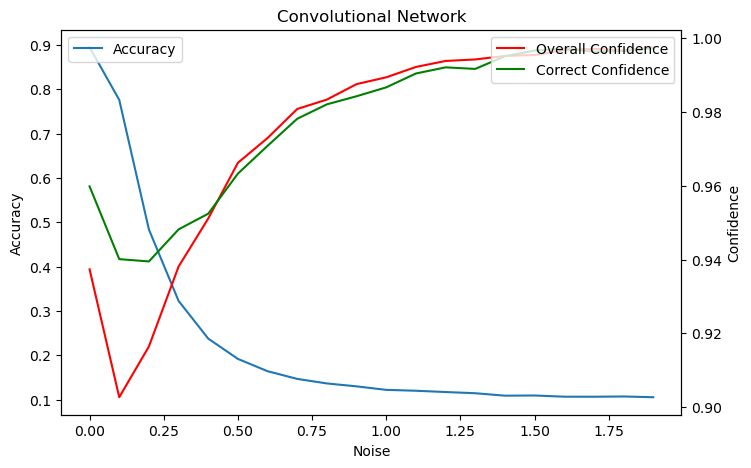

Text(0.5, 1.0, 'Classification Frequencies')

In [51]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    labels_testing_predicted = model_conv.predict(images_testing_noise)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Convolutional Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

# Experiment 6a: No Hidden Layer

In [52]:
#Train network with no hidden layer

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))

outputs = Dense(10,activation='softmax')(inputs)

model_nohidden = Model(inputs=inputs,outputs=outputs)

model_nohidden.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_nohidden.fit(images_training_flat,labels_training,batch_size=100, verbose=0,epochs=500,validation_split=0.33,callbacks=[es])

Epoch 00043: early stopping


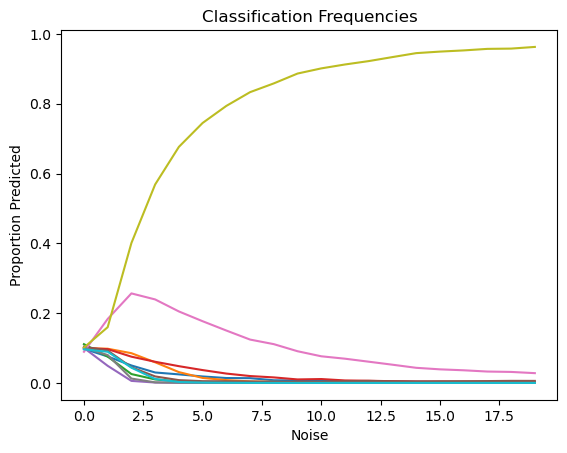

<Figure size 640x480 with 0 Axes>

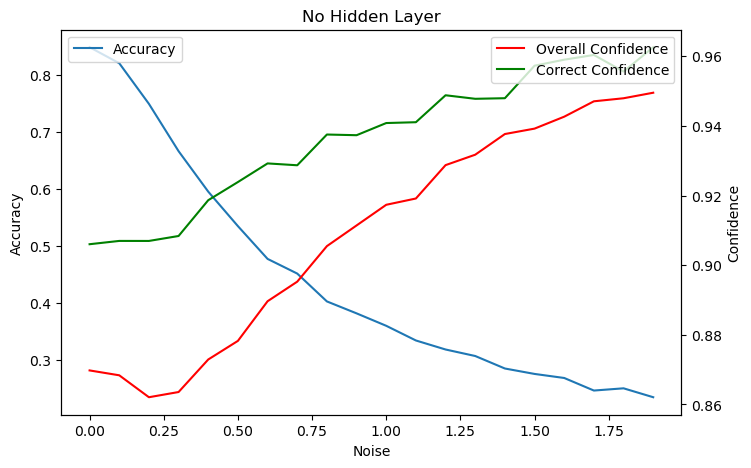

Text(0.5, 1.0, 'Classification Frequencies')

In [53]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_nohidden.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("No Hidden Layer")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

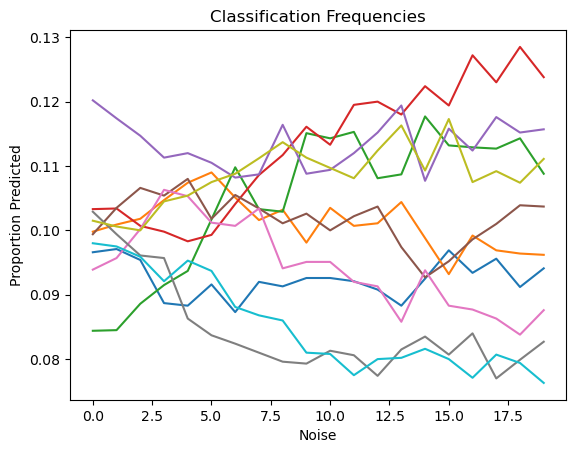

<Figure size 640x480 with 0 Axes>

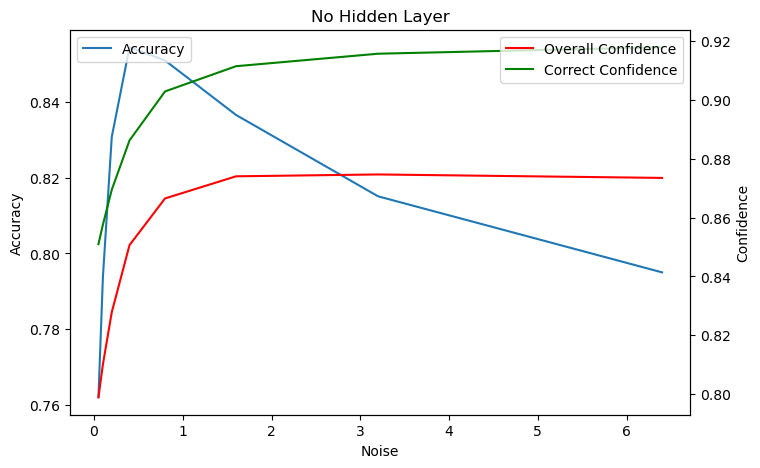

Text(0.5, 1.0, 'Classification Frequencies')

In [54]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,cd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_nohidden.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("No Hidden Layer")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

# Experiment 6b: No Hidden Layer and layer normalization

In [55]:
#Train network with no hidden layer

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))


layer = LayerNormalization()(inputs)

outputs = Dense(10,activation='softmax')(layer)

model_nohidden = Model(inputs=inputs,outputs=outputs)

model_nohidden.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_nohidden.fit(images_training_flat,labels_training,batch_size=100, verbose=0,epochs=500,validation_split=0.33,callbacks=[es])

Epoch 00025: early stopping


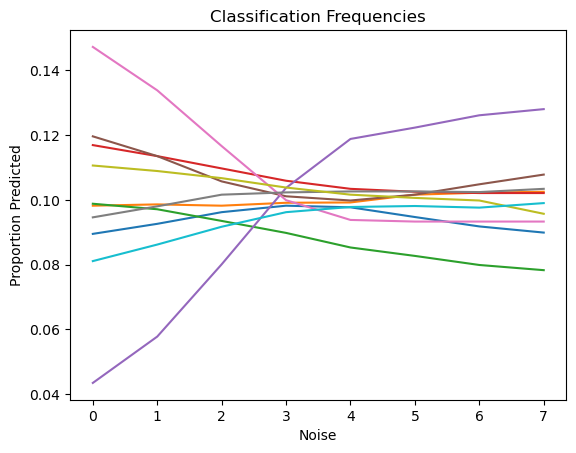

<Figure size 640x480 with 0 Axes>

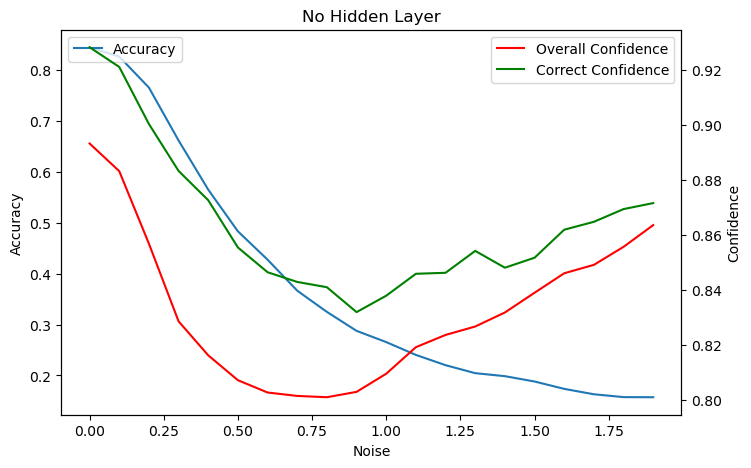

Text(0.5, 1.0, 'Classification Frequencies')

In [56]:
sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_nohidden.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("No Hidden Layer")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

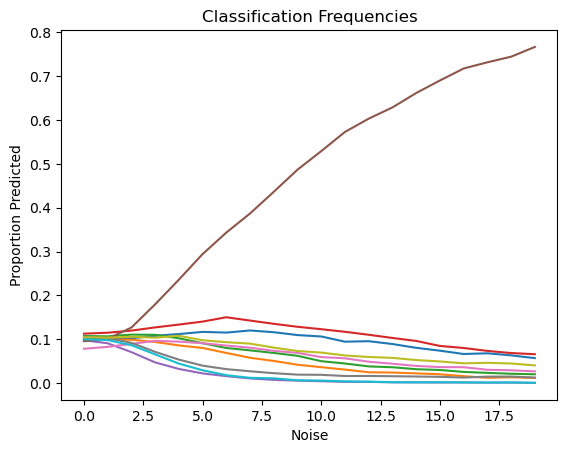

<Figure size 640x480 with 0 Axes>

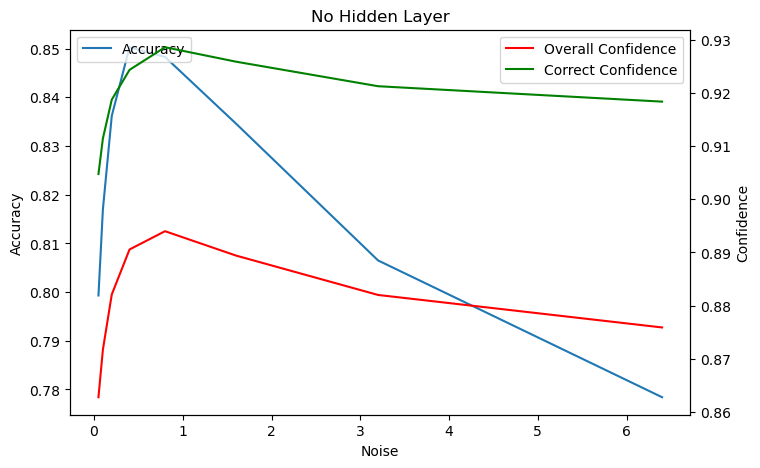

Text(0.5, 1.0, 'Classification Frequencies')

In [57]:
cd_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

freq_all = np.empty((10,0))

for i in range(len(cd_test)):
    images_testing_noise = generate_contrast(images_testing,cd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_nohidden.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cd_test,acc_array, label = "Accuracy")
conf_ax.plot(cd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("No Hidden Layer")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")

# Bayesian Neural Netowrks

In [4]:
def prior(kernel_size, bias_size, dtype=None):
    n = kernel_size + bias_size
    prior_model = keras.Sequential(
        [
            tfp.layers.DistributionLambda(
                lambda t: tfp.distributions.MultivariateNormalDiag(
                    loc=tf.zeros(n), scale_diag=tf.ones(n)
                )
            )
        ]
    )
    return prior_model

def posterior(kernel_size, bias_size, dtype=None):
    n = kernel_size + bias_size
    posterior_model = keras.Sequential(
        [
            tfp.layers.VariableLayer(
                tfp.layers.MultivariateNormalTriL.params_size(n), dtype=dtype
            ),
            tfp.layers.MultivariateNormalTriL(n),
        ]
    )
    return posterior_model

In [5]:
#Train baeysian feedforward model

images_training_flat = images_training.reshape(np.shape(images_training)[0],784)

inputs = Input(shape=(784))
layer = Dense(10,activation='relu')(inputs)
layer = tfp.layers.DenseVariational(10,make_prior_fn=prior,make_posterior_fn=posterior,activation="sigmoid")(inputs)

outputs = Dense(10,activation='softmax')(layer)

model_feedforward = Model(inputs=inputs,outputs=outputs)

model_feedforward_intermed = Model(inputs=inputs,outputs=layer)

model_feedforward.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=100)
model_feedforward.fit(images_training_flat,labels_training,batch_size=100,verbose = 1, epochs=500,validation_split=0.33,callbacks=[es])


Instructions for updating:
`scale_identity_multiplier` is deprecated; please combine it into `scale_diag` directly instead.
Epoch 1/500
402/402 [==============================] - 436s 1s/step - loss: 3799.4258 - acc: 0.0997 - val_loss: 6638.1538 - val_acc: 0.1002
Epoch 2/500
402/402 [==============================] - 442s 1s/step - loss: 9098.2637 - acc: 0.0972 - val_loss: 11396.3506 - val_acc: 0.1003
Epoch 3/500
402/402 [==============================] - 442s 1s/step - loss: 13099.3232 - acc: 0.0971 - val_loss: 14632.3145 - val_acc: 0.0969
Epoch 4/500
402/402 [==============================] - 440s 1s/step - loss: 15861.5430 - acc: 0.1023 - val_loss: 16958.7266 - val_acc: 0.0985
Epoch 5/500
402/402 [==============================] - 441s 1s/step - loss: 17747.6484 - acc: 0.0961 - val_loss: 18661.1895 - val_acc: 0.0963
Epoch 6/500
402/402 [==============================] - 441s 1s/step - loss: 19349.0840 - acc: 0.0969 - val_loss: 19853.8574 - val_acc: 0.0935
Epoch 7/500
402/402 [======

313/313 [==============================] - 46s 143ms/step


C:\Users\samue\AppData\Local\Temp\ipykernel_20292\2301251458.py:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
C:\Users\samue\AppData\Local\Temp\ipykernel_20292\2301251458.py:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


313/313 [==============================] - 47s 149ms/step


<Figure size 432x288 with 0 Axes>

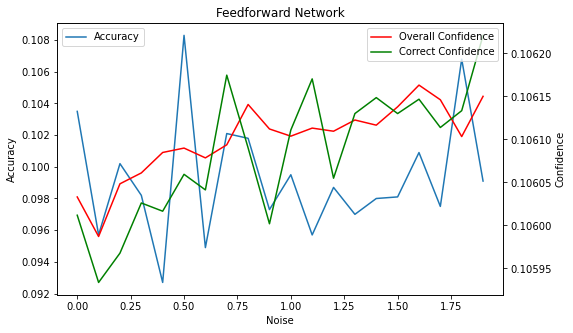

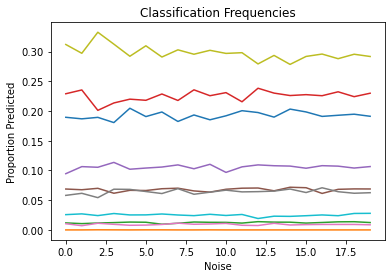

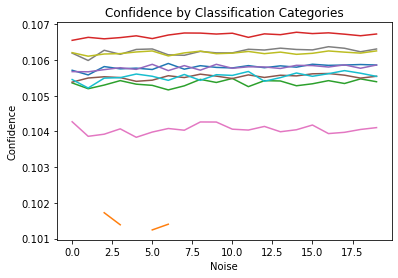

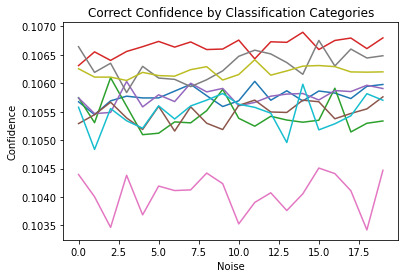

<Figure size 432x288 with 0 Axes>

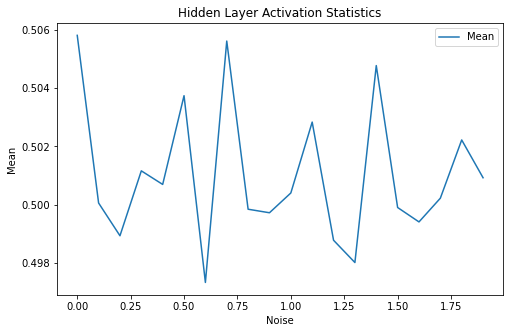

In [12]:
# Vary noise


sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

# Mix up calibration

In [14]:
mixed_images_training = np.zeros(np.shape(images_training))
mixed_labels_training = np.zeros(np.shape(labels_training))

for i in range(np.shape(images_training)[0]):
    
    a = np.random.random(1,)[0]
    b = 1-a
    
    int_a = int(np.random.random(1,)[0]*np.shape(images_training)[0])
    int_b = int(np.random.random(1,)[0]*np.shape(images_training)[0])    
    
    mixed_images_training[i,:,:] = a*images_training[int_a,:,:] + b*images_training[int_b,:,:]
    
    mixed_labels_training[i,:] = a*labels_training[int_a,:] + b*labels_training[int_b,:]
    
    
    
    
    

<Figure size 432x288 with 0 Axes>

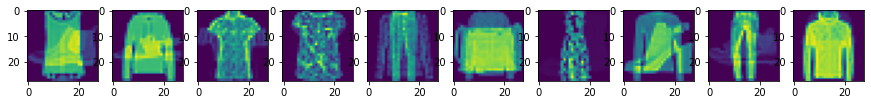

In [17]:
display_images(mixed_images_training)

In [26]:
#Train standard feedforward model

images_training_flat = mixed_images_training.reshape(np.shape(mixed_images_training)[0],784)

inputs = Input(shape=(784))
layer = Dense(10,activation='relu')(inputs)


outputs = Dense(10,activation='softmax')(layer)

model_feedforward = Model(inputs=inputs,outputs=outputs)

model_feedforward_intermed = Model(inputs=inputs,outputs=layer)

model_feedforward.compile(loss='mean_squared_error', optimizer='adam', metrics=['acc'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_feedforward.fit(images_training_flat,mixed_labels_training,batch_size=100,verbose = 0, epochs=500,validation_split=0.33,callbacks=[es])


Epoch 49: early stopping


313/313 [==============================] - 0s 550us/step


<Figure size 432x288 with 0 Axes>

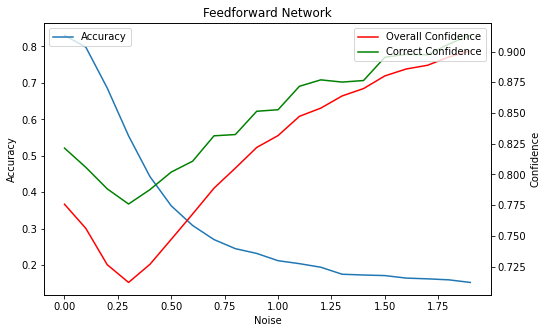

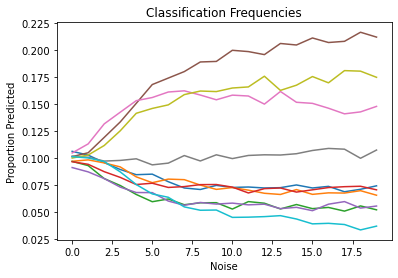

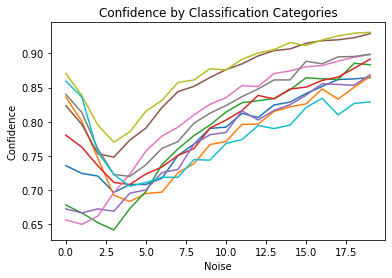

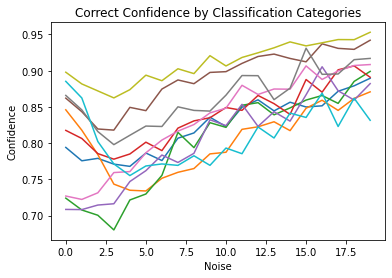

<Figure size 432x288 with 0 Axes>

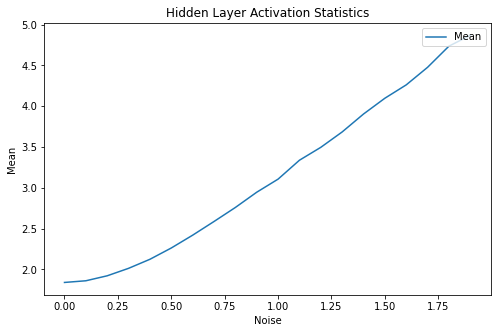

In [27]:
# Vary noise


sd_test = np.arange(0,2,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_gaussian_noise(images_testing,sd_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Noise")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Noise")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Noise")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Noise")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

313/313 [==============================] - 0s 535us/step


C:\Users\samue\AppData\Local\Temp\ipykernel_34780\2301251458.py:94: RuntimeWarning: invalid value encountered in true_divide
  all_conf[j] = all_conf[j]/cc[j]
C:\Users\samue\AppData\Local\Temp\ipykernel_34780\2301251458.py:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


313/313 [==============================] - 0s 548us/step


<Figure size 432x288 with 0 Axes>

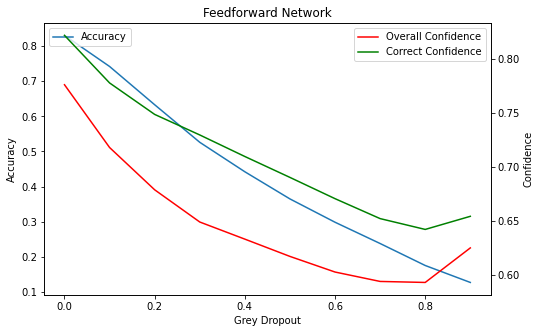

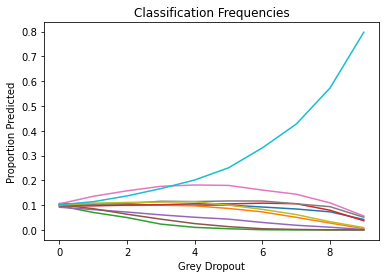

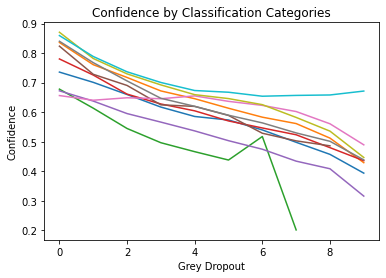

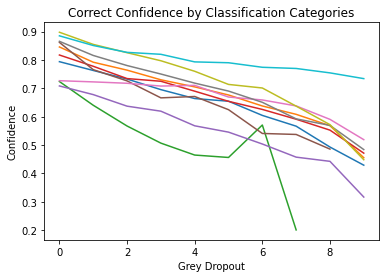

<Figure size 432x288 with 0 Axes>

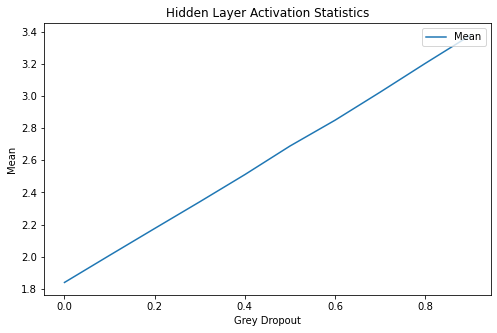

In [34]:
# Vary grey dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0.5)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Grey Dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Grey Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

313/313 [==============================] - 0s 529us/step


<Figure size 432x288 with 0 Axes>

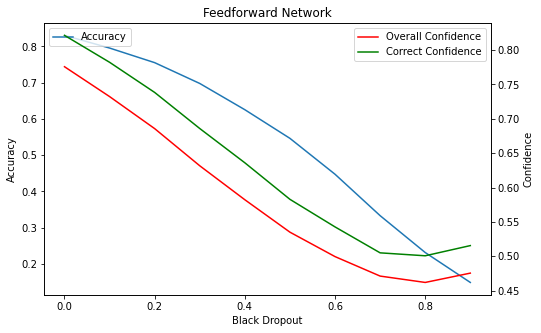

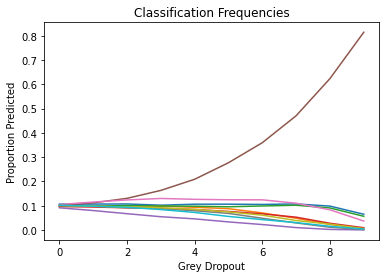

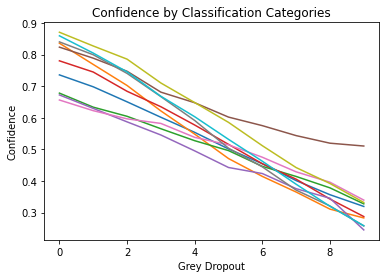

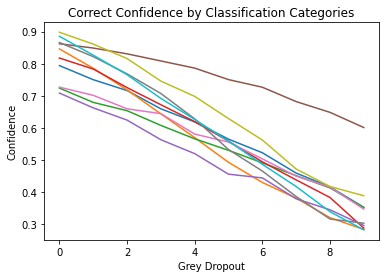

<Figure size 432x288 with 0 Axes>

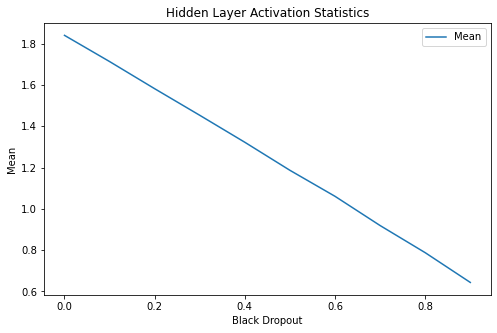

In [33]:
# Vary black dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Black Dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Grey Dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Black Dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

313/313 [==============================] - 0s 532us/step


<Figure size 432x288 with 0 Axes>

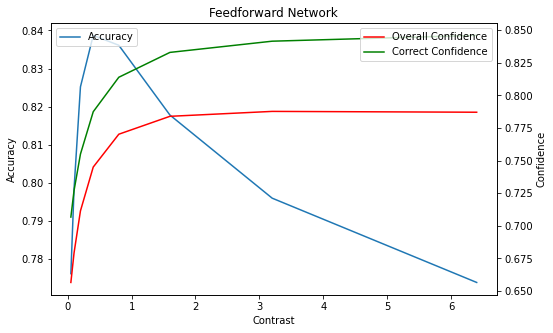

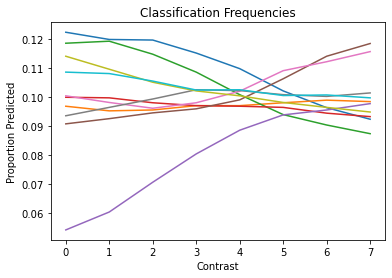

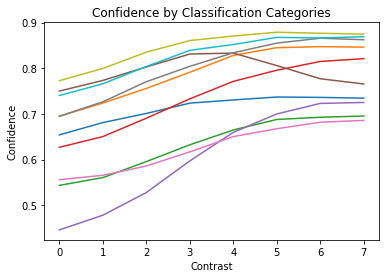

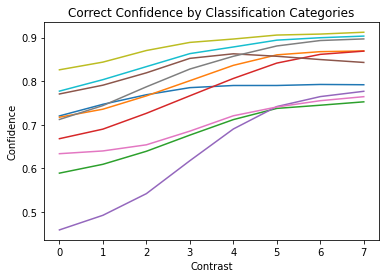

<Figure size 432x288 with 0 Axes>

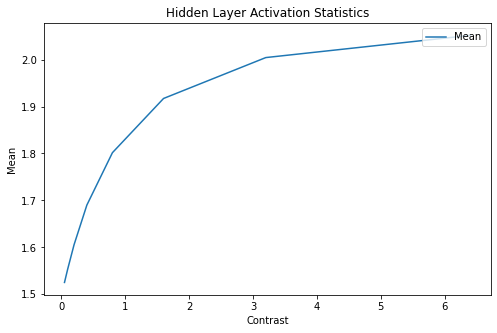

In [31]:
# Vary contrast


cn_test = [0.05, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4]

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(cn_test)):
    images_testing_noise = generate_contrast(images_testing,cn_test[i])
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("Contrast")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(cn_test,acc_array, label = "Accuracy")
conf_ax.plot(cn_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(cn_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("Contrast")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("Contrast")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("Contrast")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(cn_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()

313/313 [==============================] - 0s 538us/step


C:\Users\samue\AppData\Local\Temp\ipykernel_34780\2301251458.py:95: RuntimeWarning: invalid value encountered in true_divide
  correct_conf[j] = correct_conf[j]/c[j]


313/313 [==============================] - 0s 507us/step


<Figure size 432x288 with 0 Axes>

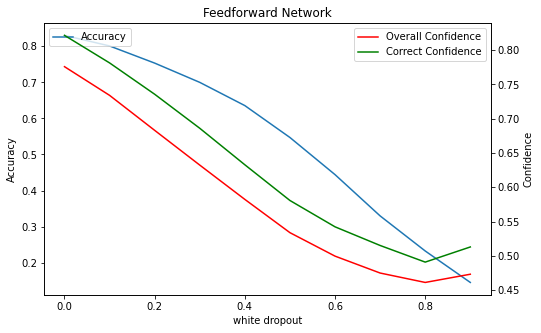

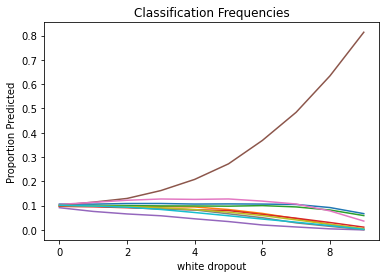

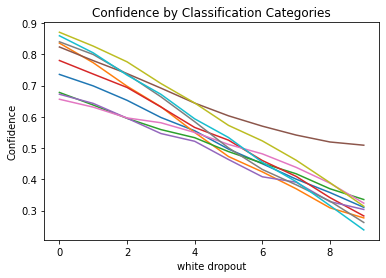

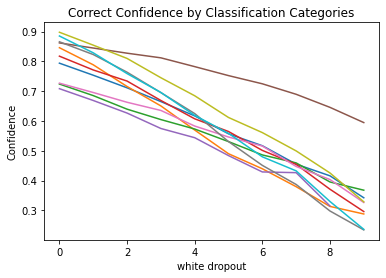

<Figure size 432x288 with 0 Axes>

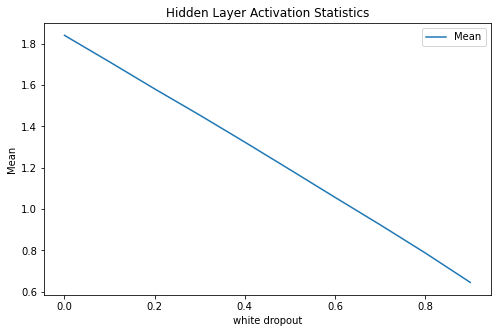

In [32]:
# Vary white dropout


sd_test = np.arange(0,1,.1)

all_conf_array = []
correct_conf_array = []
acc_array = []

conf_cat_all_array = np.empty((10,0))
conf_cat_correct_array = np.empty((10,0))
freq_all = np.empty((10,0))

activation_mean = []

for i in range(len(sd_test)):
    images_testing_noise = generate_pixel_dropout(images_testing,sd_test[i],0)
    images_testing_noise_flat = images_testing_noise.reshape(np.shape(images_testing_noise)[0],784)
    labels_testing_predicted = model_feedforward.predict(images_testing_noise_flat)
    
    all_conf,correct_conf = compute_confidence(labels_testing,labels_testing_predicted)
    acc = compute_accuracy(labels_testing,labels_testing_predicted)
    
    all_conf_array.append(all_conf)
    correct_conf_array.append(correct_conf)   
    acc_array.append(acc)
    
    freq = compute_frequencies(labels_testing_predicted)
    
    freq_all = np.hstack((freq_all,freq))
    
    conf_cat_all, conf_cat_correct = compute_confidence_by_category(labels_testing,labels_testing_predicted)
    

    
    conf_cat_all_array = np.hstack((conf_cat_all_array,conf_cat_all))
    conf_cat_correct_array = np.hstack((conf_cat_correct_array,conf_cat_correct))
    
    
    hidden_activation = model_feedforward_intermed.predict(images_testing_noise_flat)
    
    activation_mean.append(np.mean(hidden_activation))

plt.figure(1)
fig, acc_ax = plt.subplots(figsize=(8,5))
conf_ax = acc_ax.twinx()
acc_ax.set_xlabel("white dropout")
acc_ax.set_ylabel("Accuracy")
conf_ax.set_ylabel("Confidence")
acc_ax.plot(sd_test,acc_array, label = "Accuracy")
conf_ax.plot(sd_test,all_conf_array, label = "Overall Confidence",color='r')
conf_ax.plot(sd_test,correct_conf_array, label = "Correct Confidence",color='g')
plt.title("Feedforward Network")
conf_ax.legend(loc= "upper right")
acc_ax.legend(loc= "upper left")
plt.show()

plt.figure(2)
for i in range(10):
    plt.plot(freq_all[i,:])

plt.xlabel("white dropout")
plt.ylabel("Proportion Predicted")
plt.title("Classification Frequencies")
plt.show()

plt.figure(3)
for i in range(10):
    plt.plot(conf_cat_all_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Confidence by Classification Categories")
plt.show()

plt.figure(4)
for i in range(10):
    plt.plot(conf_cat_correct_array[i,:])

plt.xlabel("white dropout")
plt.ylabel("Confidence")
plt.title("Correct Confidence by Classification Categories")
plt.show()


plt.figure(5)
fig, mean_ax = plt.subplots(figsize=(8,5))
#var_ax = mean_ax.twinx()
mean_ax.set_xlabel("white dropout")
mean_ax.set_ylabel("Mean")
#var_ax.set_ylabel("Variance")
mean_ax.plot(sd_test,activation_mean, label = "Mean")
#var_ax.plot(sd_test,activation_var, label = "Var",color='r')
plt.title("Hidden Layer Activation Statistics")
mean_ax.legend(loc= "upper right")
#var_ax.legend(loc= "upper left")
plt.show()